# Imports

In [1]:
import numpy as np
import scipy
from scipy.stats import unitary_group
from sklearn.linear_model import LinearRegression

In [2]:
import seaborn as sns
import pandas as pd

In [3]:
import matplotlib.pyplot as plt
import matplotlib as mpl
cmap = mpl.colormaps['cool']

In [4]:
import jax
import jax.numpy as jnp
from jax import grad, jit, vmap
from jax import jacfwd, jacrev

# Choose device : GPUs or CPU

In [5]:
!nvidia-smi

Thu Aug 31 14:32:43 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.60.13    Driver Version: 525.60.13    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100S-PCI...  Off  | 00000000:3B:00.0 Off |                    0 |
| N/A   45C    P0    29W / 250W |      0MiB / 32768MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla V100S-PCI...  Off  | 00000000:5E:00.0 Off |                    0 |
| N/A   

If the above returns an issue choose CPU otherwise choose GPU, and select the kdevice with the most RAM.

In [6]:
ENV_DEV = 'GPU'
# ENV_DEV = 'CPU'
assert ENV_DEV=='GPU' or ENV_DEV=='CPU'

In [7]:
if ENV_DEV == 'GPU':
    gpus = jax.devices('gpu')
    print(gpus)
    print("choose GPU here")
    dev = gpus[3]
elif ENV_DEV == 'CPU':
    cpus = jax.devices('cpu')
    print(cpus)
    print("chooseCPU here")
    dev = cpus[0]
print(dev)

[StreamExecutorGpuDevice(id=0, process_index=0, slice_index=0), StreamExecutorGpuDevice(id=1, process_index=0, slice_index=0), StreamExecutorGpuDevice(id=2, process_index=0, slice_index=0), StreamExecutorGpuDevice(id=3, process_index=0, slice_index=0)]
choose GPU here
gpu:3


# Define Functions

run everything and check that all tests are passed successfully and that the precisions are small enough

In [8]:
def Paulis():
    I = np.array([[+1,+0],[+0,+1]])
    X = np.array([[+0,+1],[+1,+0]])
    Y = np.array([[+0,-1j],[+1j,+0]])
    Z = np.array([[+1,+0],[+0,-1]])
    return I,X,Y,Z

In [9]:
def eigvalstopoly(eigvals,deg):
    r"""transforms eigenvalues into polynomials

    Args:
        eigvals [n]: array of integer eigenvalues values usually 2 to the number of qubits
        deg: max degree covered

    Returns:
        poly: [n,2*deg+1] : eigenvalues as polynomials
    """
    poly = np.zeros((eigvals.size,2*deg+1))
    for k,eigval in enumerate(eigvals):
        poly[k,int(np.round(eigval+deg))] = 1
        # poly.at[k,int(jnp.round(eigval+deg))].set(1)
    return poly

In [10]:
def test_eigvalstopoly():
    eigvals_test = np.array([-2,0,3])
    result = np.array([[0., 0., 1., 0., 0., 0., 0., 0., 0.],[0., 0., 0., 0., 1., 0., 0., 0., 0.],[0., 0., 0., 0., 0., 0., 0., 1., 0.]])
    assert np.allclose(eigvalstopoly(eigvals_test,deg=4),result)

test_eigvalstopoly()

In [11]:
def polytokernel(P,deg=None):
    r"""transforms polynomials into convolving kernels

    Args:
        P [n,deg]: array of integer eigenvalues values usually 2 to the number of qubits
        deg: max degree covered

    Returns:
        poly: [n,2*deg+1] : eigenvalues as polynomials
    """
    if deg is None:
        deg = (P.shape[1]-1)//2
    MP = np.zeros((P.shape[0],2*deg+1,2*deg+1))
    for k in reversed(range(1,deg+1)):
        MP[:,:,deg-k] = np.concatenate([P[:,k:],np.zeros((P.shape[0],k))],axis=1)
    MP[:,:,deg] = P
    for k in range(1,deg+1):
        MP[:,:,deg+k] = np.concatenate([np.zeros((P.shape[0],k)),P[:,:-k]],axis=1)
    return MP

In [12]:
def test_polytokernel():
    p1 = np.array([0,0,1,5,-1,0,0])
    p2 = np.array([0,0,-2,1,2,0,0])
    P = np.stack([p1,p2])
    MP = polytokernel(P)
    
    q = np.array([0,0,2,1,5,0,0])
    
    p1q_a = MP[0] @ q
    p1q_b = np.convolve(p1,q, mode='same')
    p2q_a = MP[1] @ q
    p2q_b = np.convolve(p2,q, mode='same')
    
    assert np.allclose(p1q_a,p1q_b)
    assert np.allclose(p2q_a,p2q_b)

test_polytokernel()

In [13]:
def apply_conv(MP,state):
    return jnp.einsum('ijk,ik->ij',MP,state)

In [14]:
def test_applyconv():
    states = jnp.stack([np.array([[0,0,1,0,-1,0,0],[0,0,0,2,0,0,0],[0,0,1,2,3,0,0],[0,0,5,0,0,0,0]])]*10,axis=2)
    p1 = np.array([0,0,1,5,-1,0,0])
    p2 = np.array([0,0,-2,1,2,0,0])
    P = np.stack([p1,p2,p1,p2])
    MP = polytokernel(P)
    _fun = lambda state : apply_conv(MP,state)
    test_res = jit(vmap(_fun), device = dev)(states.transpose([2,0,1]))
    
    for k in range(4):
        ta = np.convolve(P[k],states[k,:,0], mode='same')
        tb = test_res[k,k,:]
        assert np.allclose(ta,tb)

test_applyconv()

In [15]:
def eval_trigpoly(P,xs):
    deg = (P.size-1)//2
    eikx = np.exp(1j*np.einsum('i,j->ij',np.arange(-deg,deg+1),xs))
    return np.einsum('i,ij->j',P,eikx)

In [16]:
def test_eval_trigpoly():

    xs = np.linspace(0,2*np.pi)
    #test 1
    P = np.array([0,1,2,3,0])
    ta = eval_trigpoly(P,xs)
    tb = np.exp(-xs*1j) + 2 + 3 * np.exp(xs*1j)
    
    assert np.allclose(ta,tb)

    #test 2
    p1 = np.array([0,0,1,4,-1,0,0]) # 4 - i 2sx
    p2 = np.array([0,0,2,1,2,0,0]) # 1 + 4cx
    q = np.convolve(p1,p2, mode='same') # [ 0  2  9  4  7 -2  0] 4 + 16cx -2isx -i8sxcx
    
    ys1 = eval_trigpoly(p1,xs)
    ys2 = eval_trigpoly(p2,xs)
    ysq = eval_trigpoly(q,xs)
    
    assert np.allclose(ys1*ys2,ysq)

test_eval_trigpoly()

In [17]:
def eval_several_scpoly(Ps,xs):
    deg = (Ps.shape[0]-1)//2
    coskx = [np.cos(xs*k) for k in range(1,deg+1)]
    sinkx = [np.sin(xs*k) for k in range(1,deg+1)]
    
    sckx = np.concatenate([np.array([xs*0+1]),np.array(coskx),np.array(sinkx)])

    return np.einsum('ik,ij->kj',Ps,sckx)

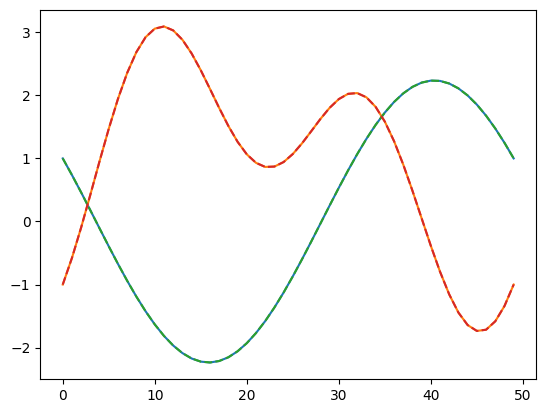

In [18]:
def test_eval_several_scpoly(boolPlot=True):
    P = np.array([[0,1,0,-2,0],[1,-1,-1,1,1]]).T
    xs = np.linspace(0,2*np.pi)
    
    ys_a = eval_several_scpoly(P,xs).T
    ys_b = np.array([np.cos(xs)-2*np.sin(xs),1-np.cos(xs)-np.cos(2*xs)+np.sin(xs)+np.sin(2*xs)]).T

    if boolPlot:
        plt.plot(ys_a)
        plt.plot(ys_b,'--')
    
    assert np.allclose(ys_a,ys_b)

test_eval_several_scpoly()

In [19]:
def trig_to_sc(obs):
    N = (obs.shape[-1]-1)//2
    one = obs[:,:,N:N+1]
    assert np.allclose(one.imag,0,atol=5e-7)
    one = one.real
    cos = (obs[:,:,:N:]+obs[:,:,:N:-1])
    assert np.allclose(cos.imag,0,atol=5e-7)
    cos = cos.real
    sin = (obs[:,:,:N:]-obs[:,:,:N:-1])
    assert np.allclose(sin.real,0,atol=5e-7)
    sin = sin.imag
    return one,cos[:,:,::-1],sin[:,:,::-1]

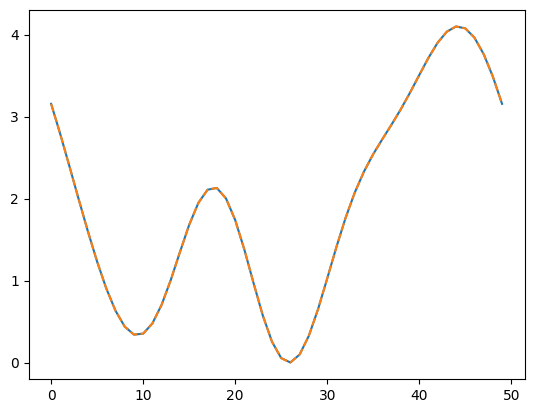

In [20]:
def test_trig_to_sc(boolPlot=True):
    xs = np.linspace(0,2*np.pi)
    
    np.random.seed(0)
    eix = (np.random.rand(5)*2-1) + 1j*(np.random.rand(5)*2-1)
    eix2 = np.convolve(eix,eix[::-1].conj())
    oscx = np.concatenate(trig_to_sc(np.expand_dims(eix2,axis=(0,1))),axis=2)
    
    ys_a = eval_trigpoly(eix2,xs)
    assert np.allclose(ys_a.imag,0)
    ys_a = ys_a.real
    ys_b = eval_several_scpoly(oscx[0].T,xs)[0,:]

    if boolPlot:
        plt.plot(ys_a)
        plt.plot(ys_b,'--')

    assert np.allclose(ys_a,ys_b)

test_trig_to_sc()

In [21]:
def thes_state(A,Bs,numlayers,thes):
    N = A.shape[0]
    
    eigA, SA = np.linalg.eigh(A)
    dA = int(np.round(np.max(np.abs(eigA))))
    
    eigBs = []
    SBs = []
    
    for B in Bs:
        eigB, SB = np.linalg.eigh(B)
        eigBs.append(eigB)
        SBs.append(SB)
        
    deg = dA * numlayers # no margin
    
    MPA = polytokernel(eigvalstopoly(eigA,deg))
    
    states = []
    
    #init
    state = np.zeros([N,2*deg+1])
    state[0,deg] = 1
    state_jnp = jnp.array(state)

    k_init = 0
    for k in range(numlayers): #go to A basis
        
        state_jnp = jnp.einsum('ij,jk->ik',np.conjugate(SA.T),state_jnp) #change basis to A
        state_jnp = jnp.einsum('ijk,ik->ij',MPA,state_jnp) #convolution with generator A
        state_jnp = jnp.einsum('ij,jk->ik',SA,state_jnp) #change basis to I
        
        for ind_b in range(len(Bs)):
            eigB = eigBs[ind_b]
            SB = SBs[ind_b]            
            state_jnp = jnp.einsum('ij,jk->ik',np.conjugate(SB.T),state_jnp) #change basis to B
            eithB = jnp.exp(1j*eigB*thes[k_init])
            k_init += 1
            state_jnp = jnp.einsum('i,ij->ij',eithB,state_jnp) # apply B parameter
            state_jnp = jnp.einsum('ij,jk->ik',SB,state_jnp) #change basis to I

        states.append(state_jnp)
        # print(f"{k} out of {numlayers}")
    
    return jnp.stack(states)

In [22]:
def test_thes_state():
    I,X,Y,Z = Paulis()
    A = (np.kron(np.kron(np.kron(X,I),I),I) + np.kron(np.kron(np.kron(I,X),I),I) + np.kron(np.kron(np.kron(I,I),X),I) + np.kron(np.kron(np.kron(I,I),I),X))/2
    B = np.kron(np.kron(np.kron(Y,Y),I),I) + np.kron(np.kron(np.kron(I,I),Y),Y) + np.kron(np.kron(np.kron(I,Y),Y),I) + np.kron(np.kron(np.kron(Y,I),I),Y)
    Bs = [B]
    N = A.shape[0]
    
    xs = np.linspace(-np.pi,np.pi)
    thes = [0.5,0.6]

    #track 1
    states = thes_state(A,Bs,2,thes)
    Sa = np.array([eval_trigpoly(states[-1][k,:],xs) for k in range(N)]).T

    #track 2 
    def fun_x_thes(x):
        state = np.zeros([N])
        state[0] = 1
        ax = scipy.linalg.expm(1j*A*x)
        b1 = scipy.linalg.expm(1j*B*thes[0])
        b2 = scipy.linalg.expm(1j*B*thes[1])
        state = b2 @ ax @ b1 @ ax @ state 
        return state
    Sb = np.array([fun_x_thes(x) for x in xs])

    #compare
    # assert np.allclose(Sa,Sb)
    print(f"precision : {np.mean(np.abs(Sa-Sb))}")

test_thes_state()

precision : 3.4900761130931636e-08


In [23]:
def measurement(states,M):
    eigM, SM = np.linalg.eigh(M)
    states = jnp.einsum('ij,rsjk->rsik',np.conjugate(SM.T),states) #change basis to M
    
    #get probabilities for each coordinates
    proba_fun = vmap(vmap(vmap(lambda x : jnp.convolve(x,x[::-1].conj()))))
    obs = jnp.einsum('k,ijkl->ijl',eigM,proba_fun(states)) #change basis to M

    return obs

In [24]:
def regular_simulation(A,Bs,M,numlayers,thes):
    N = A.shape[0]
    def fun_x_thes(x):
        state = np.zeros([N])
        state[0] = 1
        k_init = 0
        for k in range(numlayers):
            ax = scipy.linalg.expm(1j*A*x)
            state = ax @ state 
            for B in Bs:
                b = scipy.linalg.expm(1j*B*thes[k_init])
                k_init += 1
                state = b @ state 
        m = np.conjugate(state.T) @ M @ state
        return state, m
    
    return fun_x_thes


precision : 6.776403858002572e-08
precision : 5.176660834702815e-08


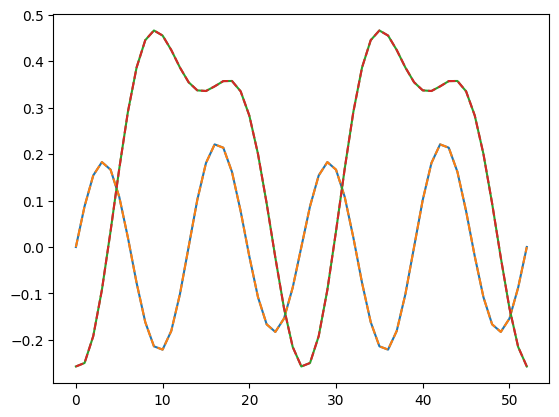

In [25]:
def test_measurement(boolPlot=True):
    
    N = 4
    I,X,Y,Z = Paulis()
    xs = np.linspace(-np.pi,np.pi,53)
    
    ## test 1
    A = (np.kron(np.kron(np.kron(X,I),I),I) + np.kron(np.kron(np.kron(I,X),I),I) + np.kron(np.kron(np.kron(I,I),X),I) + np.kron(np.kron(np.kron(I,I),I),X))/2
    B = np.kron(np.kron(np.kron(Y,Y),I),I) + np.kron(np.kron(np.kron(I,I),Y),Y) + np.kron(np.kron(np.kron(I,Y),Y),I) + np.kron(np.kron(np.kron(Y,I),I),Y)
    Bs = [B]
    M = A/2
    thes = np.array([0.5,1.1])
    
    #track 1
    states = np.expand_dims(thes_state(A,Bs,2,thes),axis=0)
    obs = measurement(states,M)
    one,cos,sin = trig_to_sc(obs)
    ocs = np.concatenate([one,cos,sin],axis=2)

    #track 2
    fun_x_thes = regular_simulation(A,Bs,M,2,thes)

    #swipe [0,2pi]
    Sa = eval_several_scpoly(ocs[:,1,:].T,xs)
    Sb = np.array([fun_x_thes(x)[1] for x in xs])
    assert np.allclose(Sb.imag,0)
    Sb = Sb.real

    ## test 2
    A = (np.kron(np.kron(np.kron(X,I),I),I) + np.kron(np.kron(np.kron(I,X),I),I) + np.kron(np.kron(np.kron(I,I),X),I) + np.kron(np.kron(np.kron(I,I),I),X))/2
    B1 = np.kron(np.kron(np.kron(Y,Y),I),I) + np.kron(np.kron(np.kron(I,I),Y),Y) + np.kron(np.kron(np.kron(I,Y),Y),I) + np.kron(np.kron(np.kron(Y,I),I),Y)
    B2 = np.kron(np.kron(np.kron(X,I),I),I) + np.kron(np.kron(np.kron(I,X),I),I) + np.kron(np.kron(np.kron(I,I),X),I) + np.kron(np.kron(np.kron(I,I),I),X)
    Bs = [B1,B2]
    M = A/2
    thes = np.array([0.5,1.1,10,15])
    
    #track 1
    states = np.expand_dims(thes_state(A,Bs,2,thes),axis=0)
    obs = measurement(states,M)
    one,cos,sin = trig_to_sc(obs)
    ocs = np.concatenate([one,cos,sin],axis=2)

    #track 2
    fun_x_thes = regular_simulation(A,Bs,M,2,thes)

    #swipe [0,2pi]
    Sc = eval_several_scpoly(ocs[:,1,:].T,xs)
    Sd = np.array([fun_x_thes(x)[1] for x in xs])
    assert np.allclose(Sd.imag,0)
    Sd = Sd.real
    
    
    if boolPlot:
        plt.plot(Sa.T)
        plt.plot(Sb.T,'--')
        plt.plot(Sc.T)
        plt.plot(Sd.T,'--')
    
    print(f"precision : {np.mean(np.abs(Sa-Sb))}")
    print(f"precision : {np.mean(np.abs(Sc-Sd))}")

test_measurement()

In [26]:
def max_lip(Ps, M = 1001):
    deg = (Ps.shape[0]-1)/2
    xs = np.linspace(0,2*np.pi,M)
    dx = xs[1] - xs[0]
    ys = eval_several_scpoly(Ps,xs)

    # L1 norm and Linf
    ys_max = np.max(np.abs(ys),axis=1)
    P_L1 = np.sum(np.abs(Ps),axis=0)

    # L1 norm and Linf
    dys = (ys[:,1:]-ys[:,:-1])/dx
    dys_max = np.max(np.abs(dys),axis=1)
    ns = np.concatenate([np.arange(0,deg+1),np.arange(1,deg+1)])
    dP_L1 = np.sum(np.abs(Ps)*np.expand_dims(ns,axis=1),axis=0)

    return ys_max, P_L1, dys_max, dP_L1

In [27]:
from matplotlib import rcParams, colors

rcParams['font.family'] = 'sans'
rcParams['mathtext.default'] = 'regular'
rcParams['figure.figsize'] = (10, 8)
rcParams['figure.dpi'] = 120
rcParams['font.size'] = 14 #24
rcParams['axes.labelsize'] = 14 #24
rcParams['axes.titlesize'] = 18 # 45
rcParams['axes.linewidth'] = 2
rcParams['legend.fontsize'] = 12
rcParams['xtick.labelsize'] = 14 # 24
rcParams['ytick.labelsize'] = 14 # 24
rcParams['lines.linewidth'] = 2
rcParams['lines.markersize'] = 8
rcParams['xtick.major.size'] = 6 # 15.0
rcParams['xtick.major.width'] = 1.5
rcParams['xtick.minor.size'] = 3 # 7.0
rcParams['xtick.minor.width'] = 1
rcParams['ytick.major.size'] = 6 # 15.0
rcParams['ytick.major.width'] = 1.5
rcParams['ytick.minor.size'] = 3 # 7.0
rcParams['ytick.minor.width'] = 1
rcParams['text.usetex'] = False
rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'
rcParams["figure.facecolor"] = "w"
rcParams["figure.edgecolor"] = "w"

# Trigonometric polynomial study

In [28]:
Ps = np.concatenate([np.random.dirichlet(np.ones(5)/5, size=300000),np.zeros((300000,4))],axis=1).T
prob = np.random.rand(9,300000)>0.5
sign = (prob>0.5)*1.0 - (prob<0.5)*1.0
Ps = Ps * sign
Ps.shape

(9, 300000)

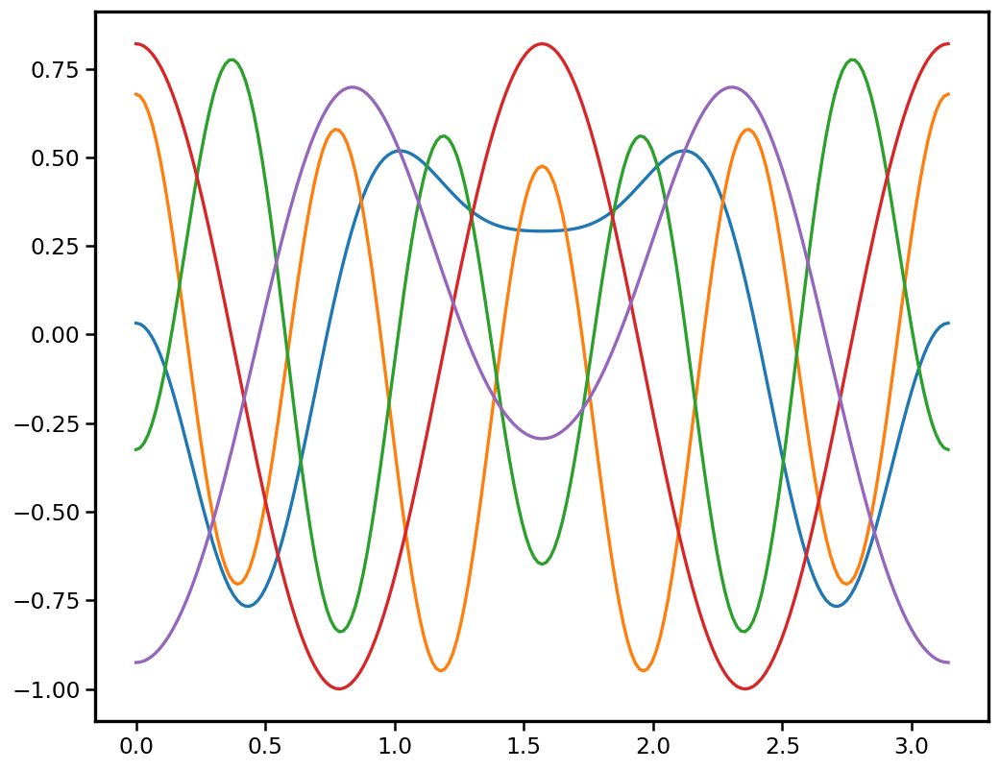

In [335]:
xs = np.linspace(0,np.pi,201)
dx = xs[1] - xs[0]
r = eval_several_scpoly(Ps,xs)
r.shape
plt.plot(xs,r[:5,:].T)

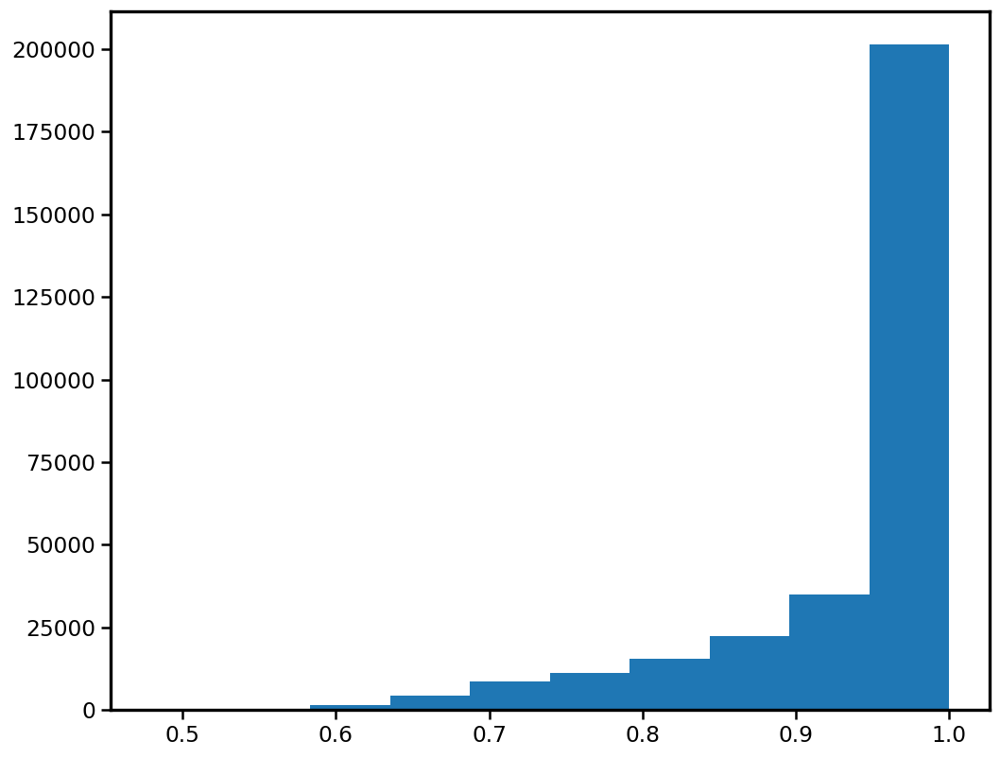

In [336]:
r_max = np.max(np.abs(r),axis=1,keepdims=True)
plt.hist(r_max);
# r = r/r_max
# Ps = Ps/r_max.T

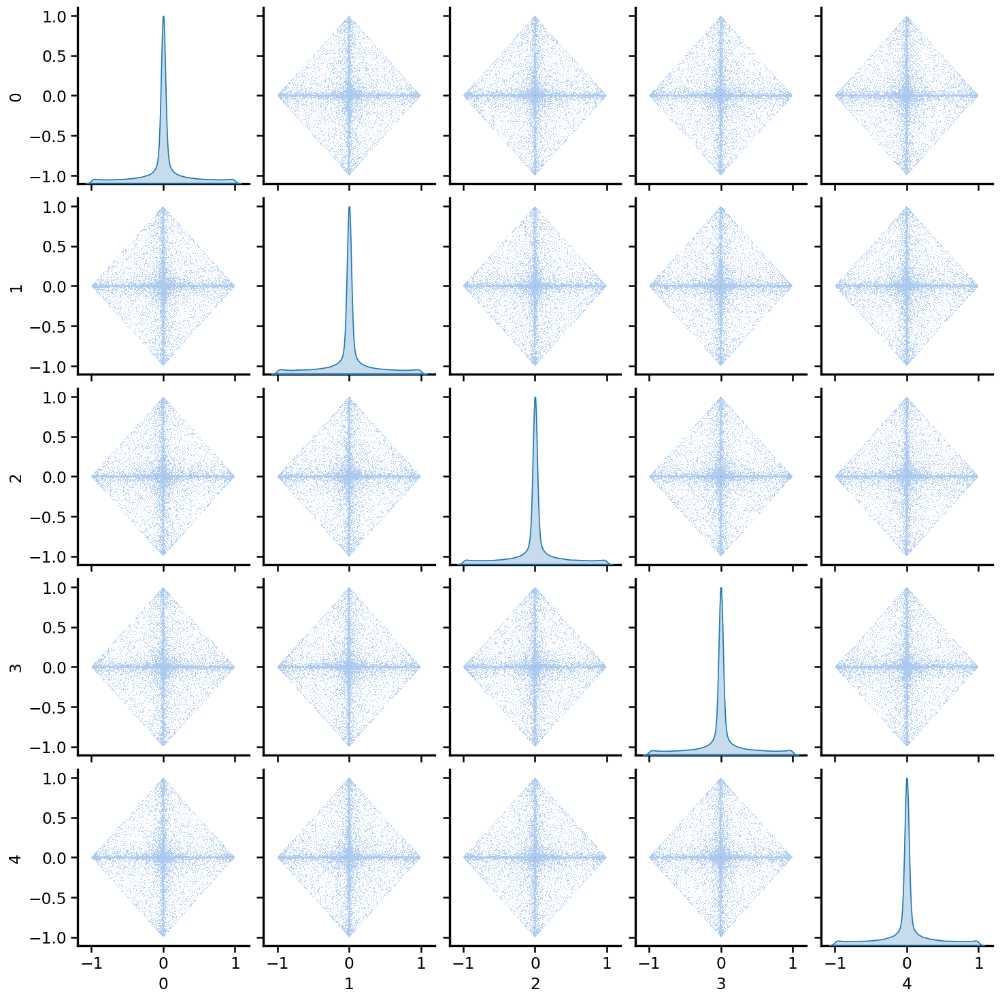

In [337]:
data = Ps[:5,:].T
df = pd.DataFrame(data)

g = sns.pairplot(df, diag_kind="kde", kind="hist")
# g = sns.pairplot(df,plot_kws={'alpha':0.1}, diag_kind="kde")
# g.sns.(kdeplot, levels=4, color=".2")
# g.axes[0,2].set_xlim((0,40))
# g.axes[1,2].set_xlim((-20,20))

In [316]:
s = np.max(np.abs(r[:,1:]-r[:,:-1]),axis=1)/dx

(array([21034., 21629., 45808., 35444., 50045., 33642., 29957., 30357.,
        15552., 16532.]),
 array([6.67401375e-08, 7.99473271e-01, 1.59894648e+00, 2.39841968e+00,
        3.19789288e+00, 3.99736609e+00, 4.79683929e+00, 5.59631250e+00,
        6.39578570e+00, 7.19525890e+00, 7.99473211e+00]),
 <BarContainer object of 10 artists>)

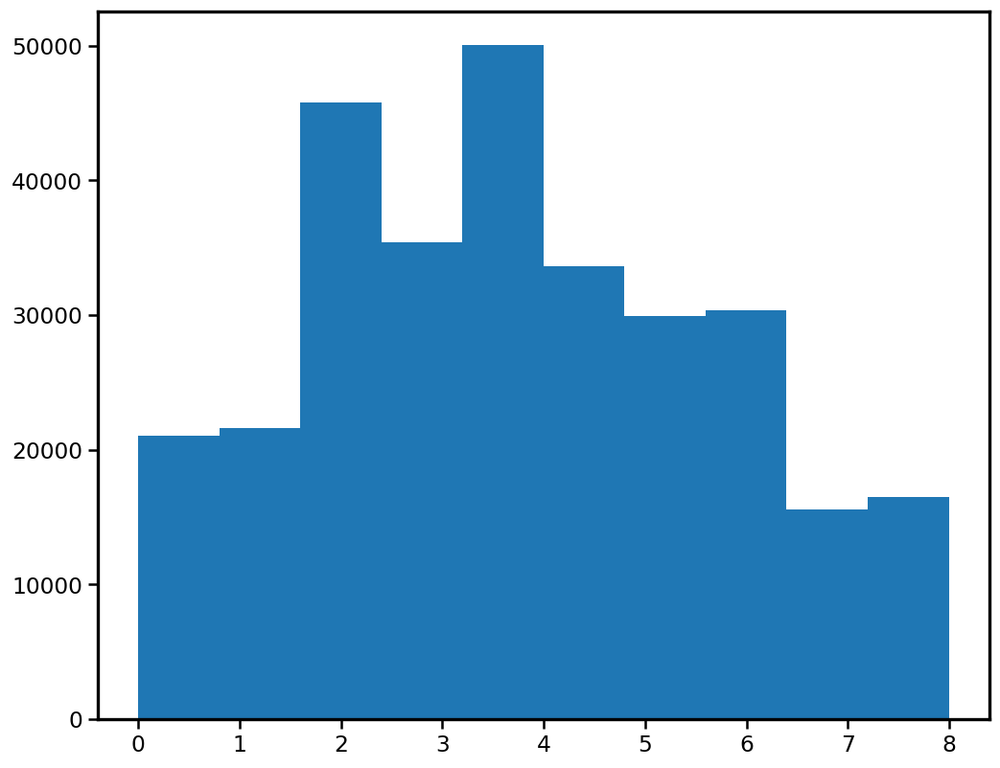

In [317]:
plt.hist(s)

(array([19239., 18645., 35861., 34689., 41459., 41753., 34432., 35798.,
        18689., 19435.]),
 array([7.70869862e-08, 7.99999582e-01, 1.59999909e+00, 2.39999859e+00,
        3.19999810e+00, 3.99999760e+00, 4.79999710e+00, 5.59999661e+00,
        6.39999611e+00, 7.19999562e+00, 7.99999512e+00]),
 <BarContainer object of 10 artists>)

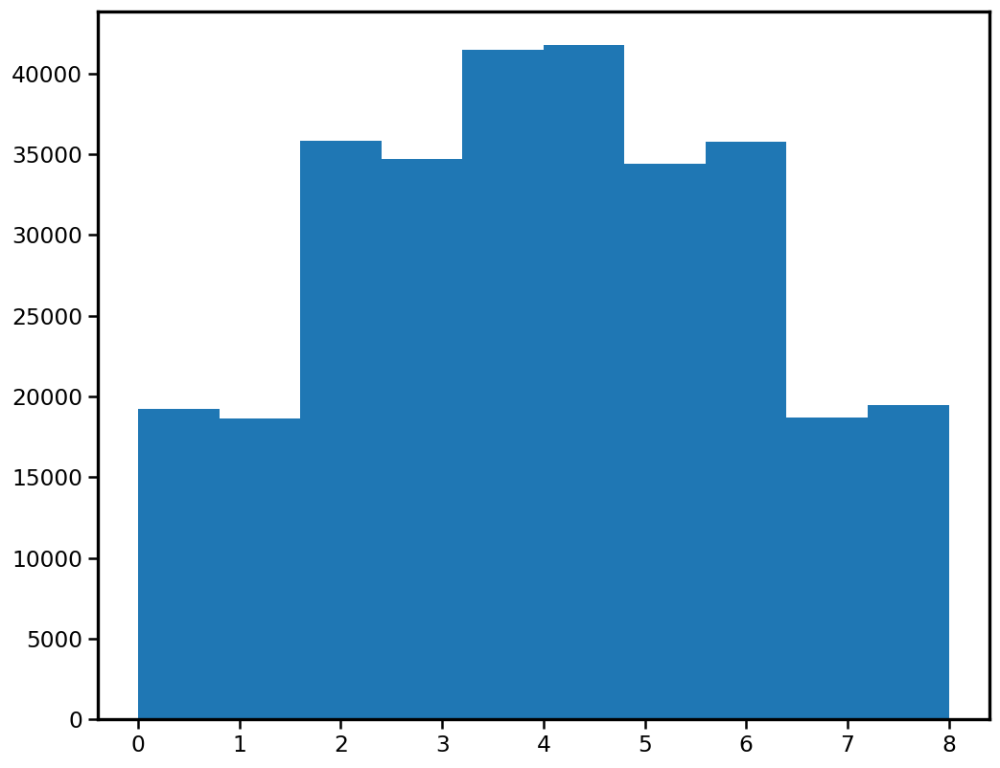

In [318]:
t = np.sum(np.abs(Ps)*2*np.expand_dims(ks,axis=1),axis=0)
plt.hist(t)

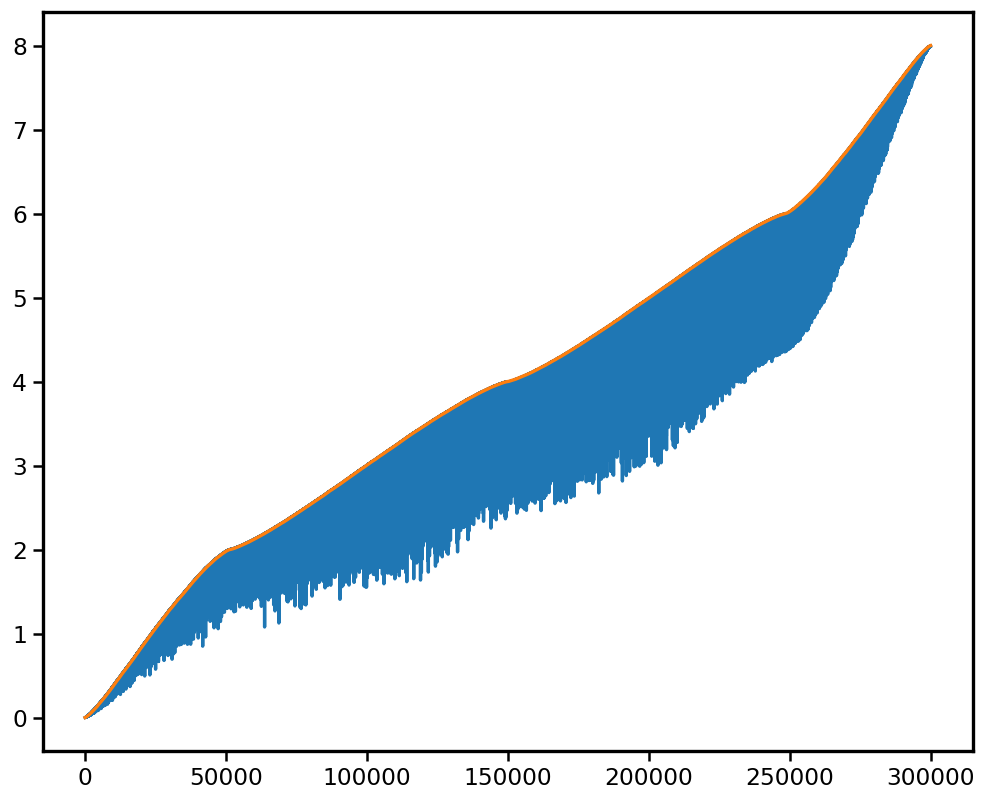

In [319]:
ids = np.argsort(t)
plt.plot(s[ids])
plt.plot(t[ids])

## dirichlet : cosinus and sinus

In [30]:
def generate_Ps(M,T,boolSign = True):
    Ps = np.concatenate([np.random.dirichlet(np.ones(2*M+1)/(2*M+1), size=T)],axis=1).T
    if boolSign:
        prob = np.random.rand(2*M+1,T)>0.5
        sign = (prob>0.5)*1.0 - (prob<0.5)*1.0
        Ps = Ps * sign
    return Ps

In [31]:
Ps = generate_Ps(4,300000)
Ps.shape

(9, 300000)

In [32]:
ys_max, P_L1, dys_max, dP_L1 = max_lip(Ps,201)

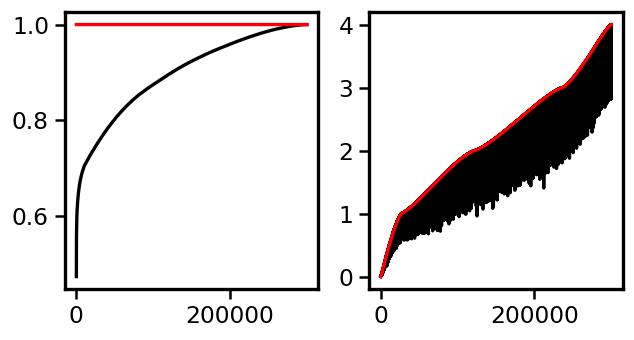

In [33]:
fig,axs = plt.subplots(1,2,figsize=(6,3))

idx_ys = np.argsort(ys_max)
axs[0].plot(ys_max[idx_ys],'k')
axs[0].plot(P_L1[idx_ys],'r',linewidth=2)

idx_dys = np.argsort(dP_L1)
axs[1].plot(dys_max[idx_dys],'k')
axs[1].plot(dP_L1[idx_dys],'r',linewidth=2)

In [34]:
# data = Ps[:,:1000].T
# df = pd.DataFrame(data)

# g = sns.pairplot(df, diag_kind="kde", kind="hist")

In [35]:
Y = []
T = 1000
M = 50
for k in range(1,M):
    Ps = generate_Ps(k,T)
    ys_max, P_L1, dys_max, dP_L1 = max_lip(Ps[:2*k+1,:])
    assert np.allclose(P_L1,1)
    Y.append([ys_max, dys_max, dP_L1])
Y = np.array(Y)
Y.shape

(49, 3, 1000)

0
0


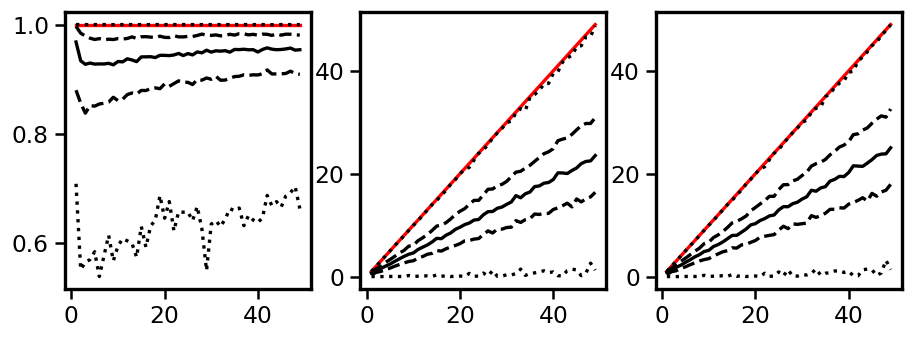

In [36]:
fig, axs = plt.subplots(1,3,figsize=(9,3))
ks = np.arange(1,50)

axs[0].plot(ks,0*ks+1,'r')
axs[1].plot(ks,ks,'r')
axs[2].plot(ks,ks,'r')

for (k,ax) in enumerate(axs.flat):
    a = Y[:,k,:]
    mina = np.min(a,axis=1)
    maxa = np.max(a,axis=1)

    ax.plot(ks,np.percentile(a, 50,axis=1),'k')
    ax.plot(ks,np.percentile(a, 25,axis=1),'k--')
    ax.plot(ks,np.percentile(a, 75,axis=1),'k--')
    ax.plot(ks,mina,'k:')
    ax.plot(ks,maxa,'k:')

print(np.sum(Y[:,0]>1))
print(np.sum(Y[:,1]>Y[:,2]))

# Experiments

## Experiment 1
* A = (XIII + IXII + IIXI + IIIX)/2
* B1 = YYII + IIYY + IYYI + YIIY
* M = A

### Experiment definition

In [33]:
I,X,Y,Z = Paulis()
A = (np.kron(np.kron(np.kron(X,I),I),I) + np.kron(np.kron(np.kron(I,X),I),I) + np.kron(np.kron(np.kron(I,I),X),I) + np.kron(np.kron(np.kron(I,I),I),X))/2
B1 = np.kron(np.kron(np.kron(Y,Y),I),I) + np.kron(np.kron(np.kron(I,I),Y),Y) + np.kron(np.kron(np.kron(I,Y),Y),I) + np.kron(np.kron(np.kron(Y,I),I),Y)
Bs = [B1]
M = A/2

numlayers = 15
numthes = 10000

np.random.seed(0)
thes = (np.random.rand(numthes,numlayers*len(Bs))-0.5)*np.pi

### Check State Amplitude in the $e^{ix\pi}$ basis

In [34]:
fun_states = jit(vmap(lambda thes : thes_state(A,Bs,numlayers,thes)),device=dev)

In [35]:
states = fun_states(thes)
print(f"The {states.shape[2]} complex amplitudes of the state vector for the {states.shape[3]} frequencies at the end of each of the {states.shape[1]} layers was sampled for {states.shape[0]} instances of the circuit parameters")

The 16 complex amplitudes of the state vector for the 61 frequencies at the end of each of the 15 layers was sampled for 10000 instances of the circuit parameters


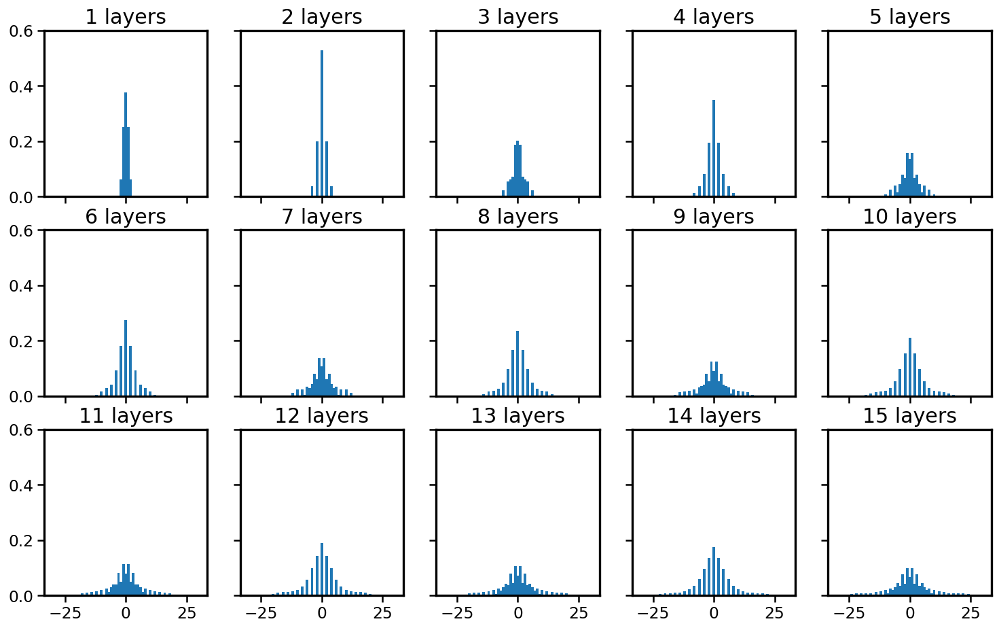

In [36]:
L = 30
x = np.arange(-L,L+1)
states_norm = np.sum(np.abs(states)**2,axis=2)

fig,axs = plt.subplots(3,5,figsize=(15,9), sharex=True, sharey=True)
for k,ax in enumerate(axs.flat):
    ax.bar(x,np.mean(states_norm[:,k,:],axis=0), color = 'C0',width =1.1)
    ax.set_title(f"{k+1} layers",fontsize = 18)
    ax.set_ylim([0,0.6])

# fig.savefig('layered_ansatzes.pdf')

In [37]:
obs = jit(lambda states : measurement(states,M),device=dev)(states[:2500,:,:,:])

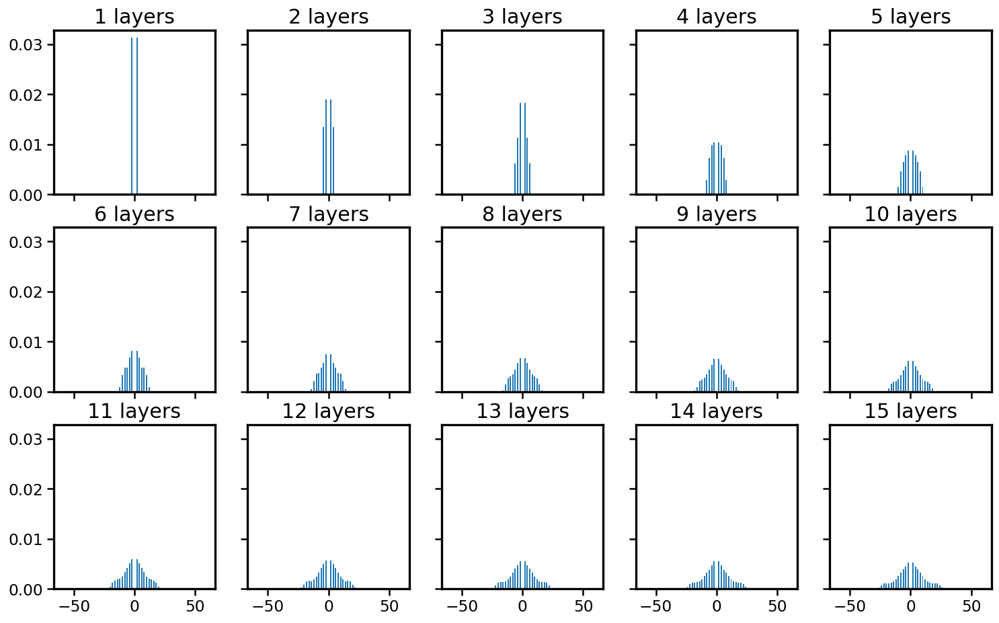

In [38]:
L = 60
x = np.arange(-L,L+1)
obs_norm = np.abs(obs)**2

fig,axs = plt.subplots(3,5,figsize=(15,9), sharex=True, sharey=True)
for k,ax in enumerate(axs.flat):
    ax.bar(x,np.mean(obs_norm[:,k,:],axis=0), color = 'C0',width =1.1)
    ax.set_title(f"{k+1} layers",fontsize = 18)
    # ax.set_ylim([0,0.6])

# fig.savefig('layered_ansatzes.pdf')

### Check output function in the $\cos(x\pi)$ and $\sin(x\pi)$ basis

In [39]:
one,cos,sin = trig_to_sc(obs)
ocs = np.concatenate([one,cos,sin],axis=2)
print(f"The output functions as cos sin decomposition represented by {ocs.shape[2]} coefficient at the end of each of the {ocs.shape[1]} layers was sampled for {ocs.shape[0]} instances of the circuit parameters")
ocs.shape

The output functions as cos sin decomposition represented by 121 coefficient at the end of each of the 15 layers was sampled for 2500 instances of the circuit parameters


(2500, 15, 121)

In [40]:
Y = []
for k in range(ocs.shape[1]):
    ys_max, P_L1, dys_max, dP_L1 = max_lip(ocs[:,k,:].T)
    Y.append([ys_max, P_L1, dys_max, dP_L1])
Y = np.array(Y)
Y.shape

(15, 4, 2500)

228
0


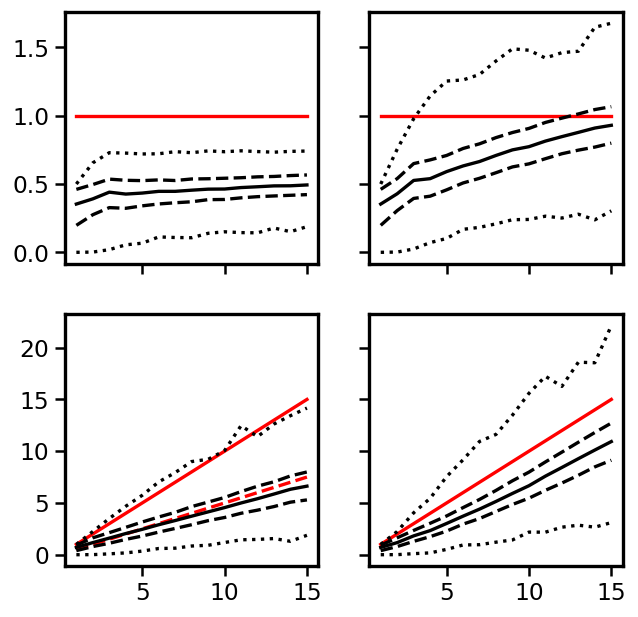

In [42]:
fig, axs = plt.subplots(2,2,figsize=(6,6),sharex=True,sharey='row')
ks = np.arange(1,16)

axs[0,0].plot(ks,0*ks+1,'r')
axs[0,1].plot(ks,0*ks+1,'r')
axs[1,0].plot(ks,ks,'r')
axs[1,0].plot(ks,ks/2,'r--')
axs[1,1].plot(ks,ks,'r')

for (k,ax) in enumerate(axs.flat):
    a = Y[:,k,:]
    mina = np.min(a,axis=1)
    maxa = np.max(a,axis=1)

    ax.plot(ks,np.percentile(a, 50,axis=1),'k')
    ax.plot(ks,np.percentile(a, 25,axis=1),'k--')
    ax.plot(ks,np.percentile(a, 75,axis=1),'k--')
    ax.plot(ks,mina,'k:')
    ax.plot(ks,maxa,'k:')

print(np.sum(Y[:,0]>Y[:,1]))
print(np.sum(Y[:,2]>Y[:,3]))

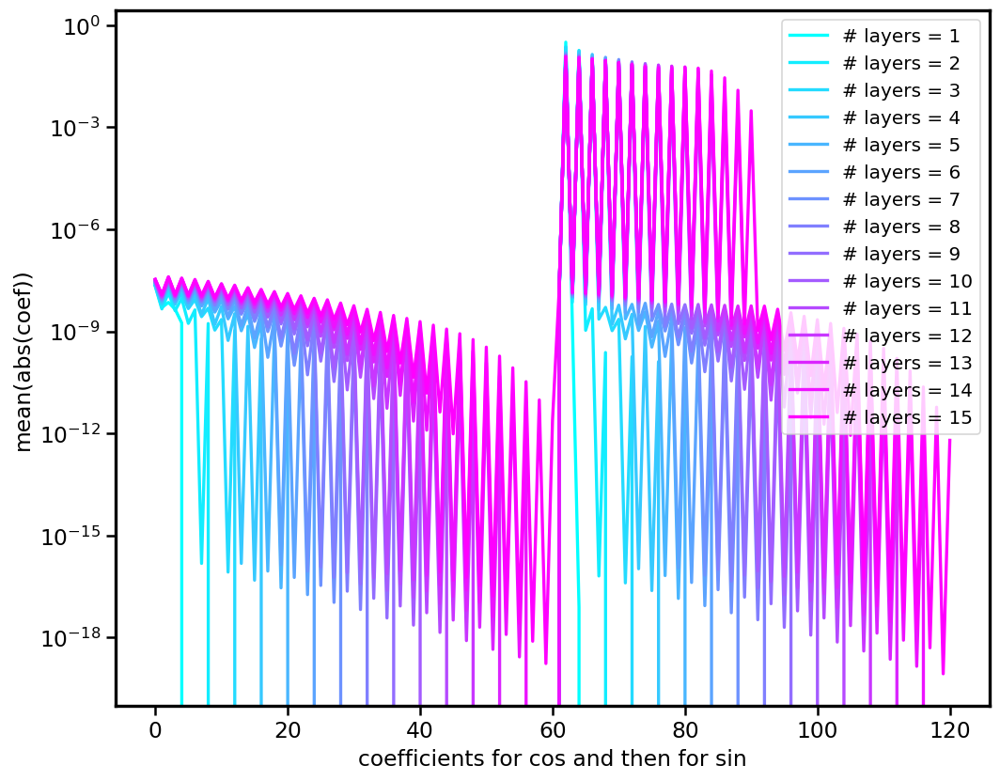

In [43]:
for k in range(numlayers):
    plt.semilogy(np.mean(np.abs(ocs[:,k,:]),axis=0).T,c=cmap(k/(numlayers-1)),label=f"# layers = {k+1}")
# plt.plot([0,out_fun.shape[2]],[1,1],'k')
plt.xlabel('coefficients for cos and then for sin')
plt.ylabel('mean(abs(coef))')
plt.legend()

In [44]:
np.where(np.mean(np.abs(ocs[:,-1,:]),axis=0)>1e-1)

(array([62, 64, 66]),)

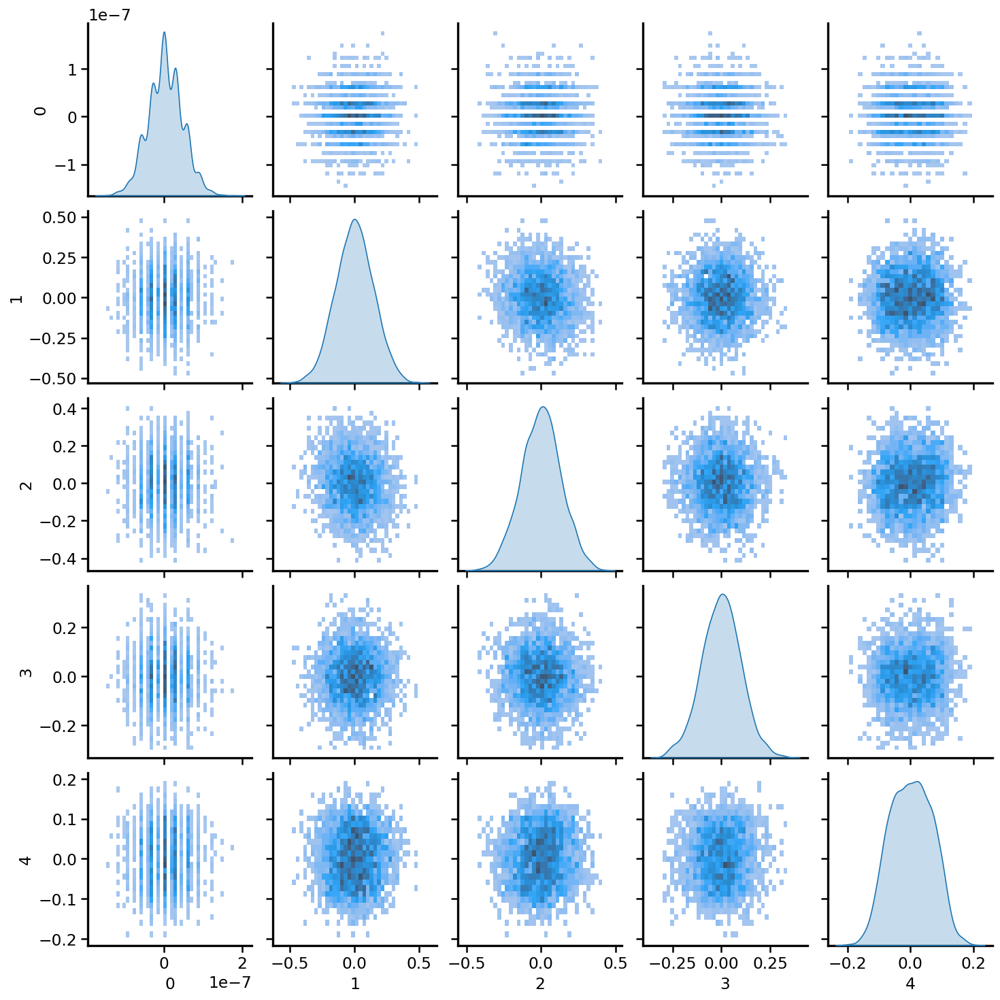

In [45]:
inds = [0,62,64,70,82]
data = ocs[:,-1,inds].squeeze()
df = pd.DataFrame(data)
g = sns.pairplot(df, diag_kind="kde", kind="hist")

## Experiment 2
* A = XIII + IXII + IIXI + IIIXX
* B1 = YIII + IYII + IIYI + IIIY
* B2 = XIII + IXII + IIXI + IIIXX
* B3 = ZZII + IZZI + IIZZ + ZIIZ + ZIZI + IZIZ
* M = A

### Experiment definition

In [46]:
I,X,Y,Z = Paulis()
A = (np.kron(np.kron(np.kron(X,I),I),I) + np.kron(np.kron(np.kron(I,X),I),I) + np.kron(np.kron(np.kron(I,I),X),I) + np.kron(np.kron(np.kron(I,I),I),X))/2
B1 = np.kron(np.kron(np.kron(X,I),I),I) + np.kron(np.kron(np.kron(I,X),I),I) + np.kron(np.kron(np.kron(I,I),X),I) + np.kron(np.kron(np.kron(I,I),I),X)
B2 = np.kron(np.kron(np.kron(Y,I),I),I) + np.kron(np.kron(np.kron(I,Y),I),I) + np.kron(np.kron(np.kron(I,I),Y),I) + np.kron(np.kron(np.kron(I,I),I),Y)
B3 = np.kron(np.kron(np.kron(Z,Z),I),I) + np.kron(np.kron(np.kron(I,I),Z),Z) + np.kron(np.kron(np.kron(I,Z),Z),I) + np.kron(np.kron(np.kron(Z,I),I),Z) + np.kron(np.kron(np.kron(Z,I),Z),I) + np.kron(np.kron(np.kron(I,Z),I),Z)

Bs = [B1,B2,B3]
# Bs = [B1,B2,B3,B1,B2,B3]
M = A/2
N = A.shape[0]

numlayers = 50
numthes = 2000
np.random.seed(0)
thes = (np.random.rand(numthes,numlayers*len(Bs))-0.5)*np.pi

### Check State Amplitude in the $e^{ix\pi}$ basis

In [47]:
fun_states = jit(vmap(lambda thes : thes_state(A,Bs,numlayers,thes)),device=dev)

In [48]:
states = fun_states(thes)
print(f"The {states.shape[2]} complex amplitudes of the state vector for the {states.shape[3]} frequencies at the end of each of the {states.shape[1]} layers was sampled for {states.shape[0]} instances of the circuit parameters")

The 16 complex amplitudes of the state vector for the 201 frequencies at the end of each of the 50 layers was sampled for 2000 instances of the circuit parameters


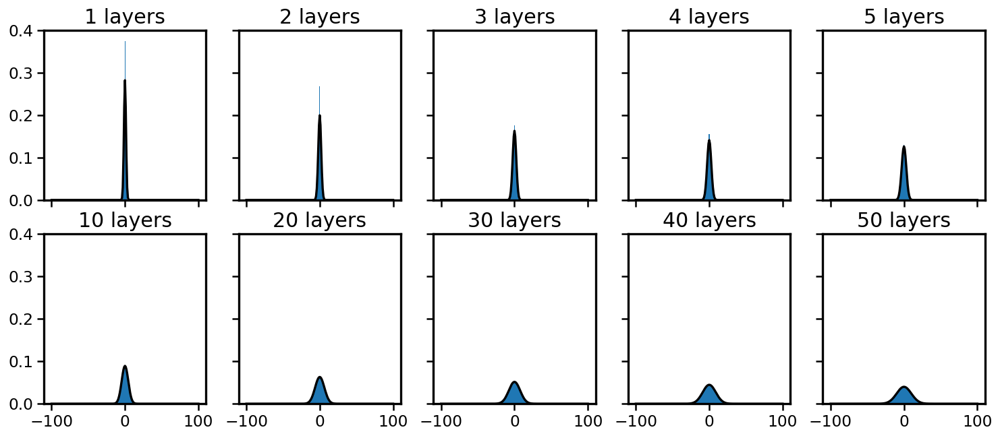

In [49]:
L = 100
x = np.arange(-L,L+1)
states_norm = np.sum(np.abs(states)**2,axis=2)

inds = [0,1,2,3,4,9,19,29,39,49]
fig,axs = plt.subplots(2,5,figsize=(15,6), sharex=True, sharey=True)
for k,ax in enumerate(axs.flat):
    ax.bar(x,np.mean(states_norm[:,inds[k],:],axis=0), color = 'C0',width =1.1)
    ax.plot(x,1/np.sqrt(4*(inds[k]+1)*np.pi)*np.exp(-x**2/(inds[k]+1)/4),'k')
    ax.set_title(f"{inds[k]+1} layers",fontsize = 18)
    ax.set_ylim([0,0.4])

# fig.savefig('layered_ansatzes.pdf')

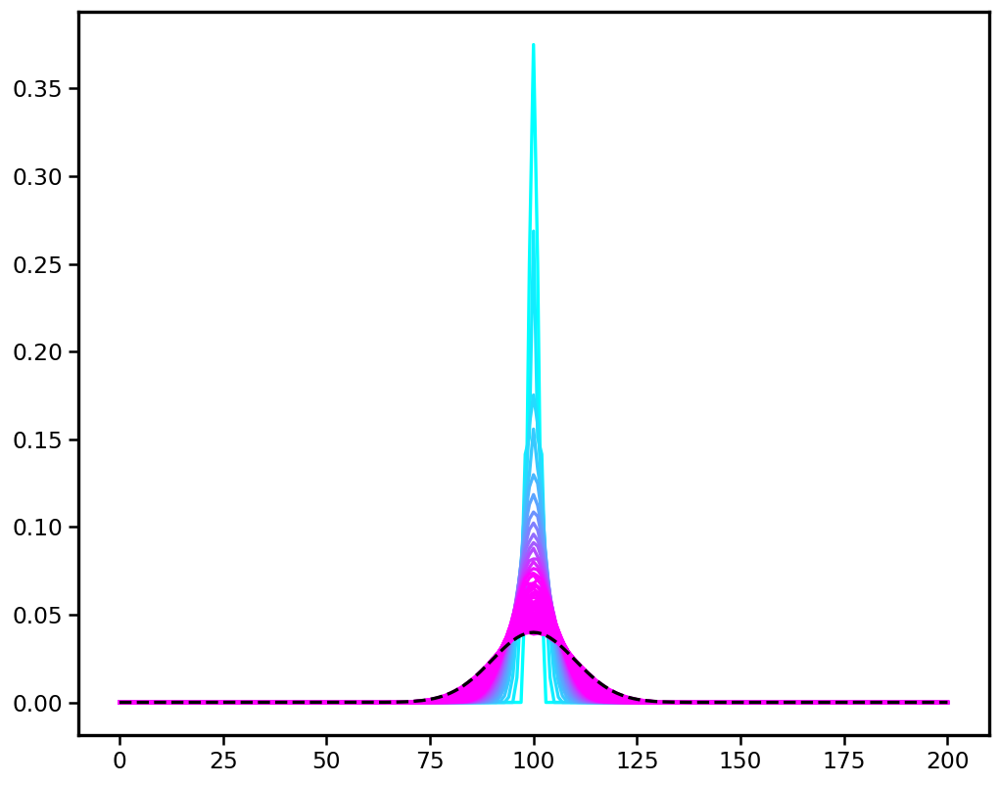

In [50]:
mean_ab = np.mean(np.abs(states_norm),axis=0)
mean_ab.shape
for k in range(50):
    plt.plot(mean_ab[k,:],c=cmap(k/14));
plt.plot(1/np.sqrt(4*(k+1)*np.pi)*np.exp(-x**2/(k+1)/4),'k--')

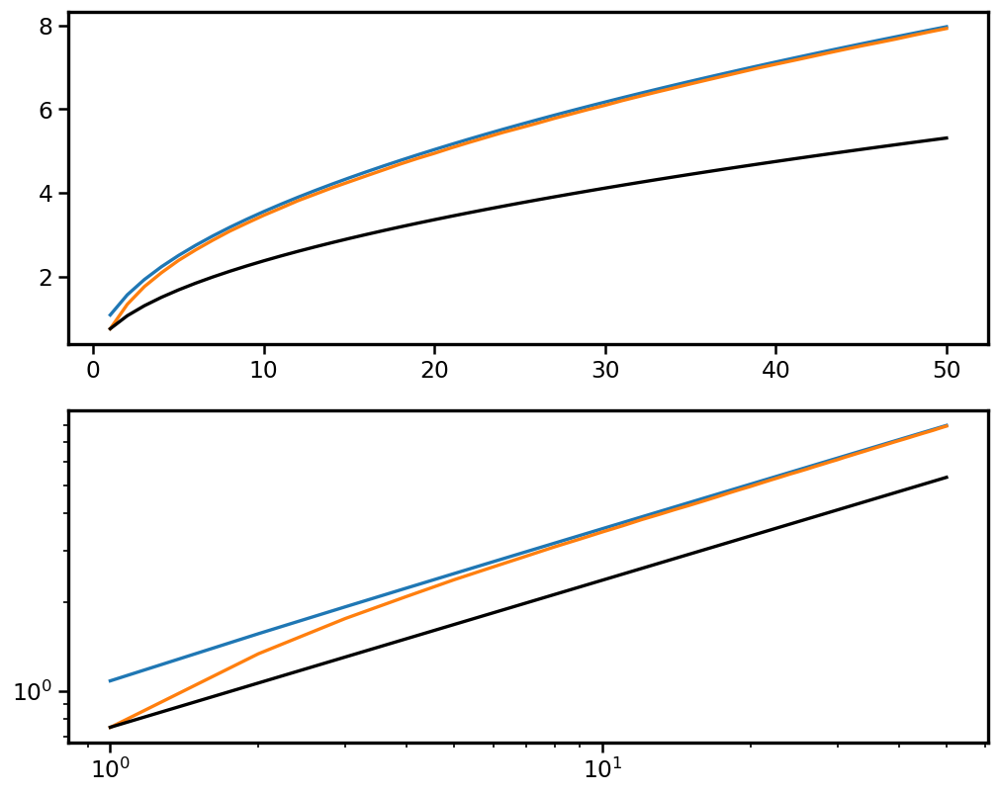

In [51]:
ma = []
mb = []
ks = np.arange(0,50)
x = np.arange(-L,L+1)

for k in ks:
    a = 1/np.sqrt(4*(k+1)*np.pi)*np.exp(-x**2/(k+1)/4)
    b = mean_ab[k,:]
    ma.append(np.sum(a*np.abs(x)))
    mb.append(np.sum(b*np.abs(x)))

plt.subplot(211)
plt.plot(ks+1,ma)
plt.plot(ks+1,mb)
plt.plot(ks+1,np.sqrt(ks+1)/np.pi**(1/4),'k')
# plt.plot(ks+1,np.sqrt(ks+1)*1.1,'k')

plt.subplot(212)
plt.loglog(ks+1,ma)
plt.loglog(ks+1,mb)
plt.loglog(ks+1,np.sqrt(ks+1)/np.pi**(1/4),'k')
# plt.loglog(ks+1,np.sqrt(ks+1)*1.1,'k')

In [52]:
obs = jit(lambda states : measurement(states,M),device=dev)(states[:2500,:,:,:])

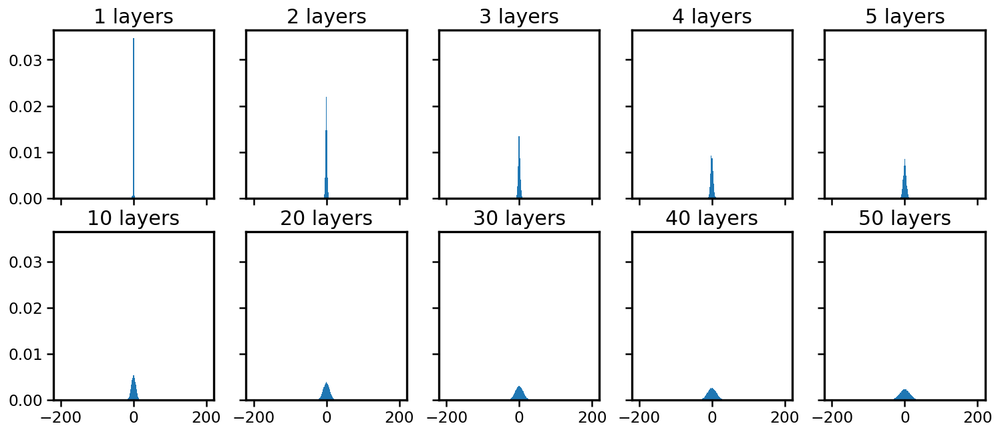

In [53]:
L = 200
x = np.arange(-L,L+1)
obs_norm = np.abs(obs)**2

inds = [0,1,2,3,4,9,19,29,39,49]
fig,axs = plt.subplots(2,5,figsize=(15,6), sharex=True, sharey=True)
for k,ax in enumerate(axs.flat):
    ax.bar(x,np.mean(obs_norm[:,inds[k],:],axis=0), color = 'C0',width =1.1)
    ax.set_title(f"{inds[k]+1} layers",fontsize = 18)
    # ax.set_ylim([0,0.6])

# fig.savefig('layered_ansatzes.pdf')

### Check output function in the $\cos(x\pi)$ and $\sin(x\pi)$ basis

In [54]:
one,cos,sin = trig_to_sc(obs)
ocs = np.concatenate([one,cos,sin],axis=2)
print(f"The output functions as cos sin decomposition represented by {ocs.shape[2]} coefficient at the end of each of the {ocs.shape[1]} layers was sampled for {ocs.shape[0]} instances of the circuit parameters")
ocs.shape

The output functions as cos sin decomposition represented by 401 coefficient at the end of each of the 50 layers was sampled for 2000 instances of the circuit parameters


(2000, 50, 401)

In [55]:
Y = []
for k in range(ocs.shape[1]):
    ys_max, P_L1, dys_max, dP_L1 = max_lip(ocs[:,k,:].T)
    Y.append([ys_max, P_L1, dys_max, dP_L1])
Y = np.array(Y)
Y.shape

(50, 4, 2000)

0
0


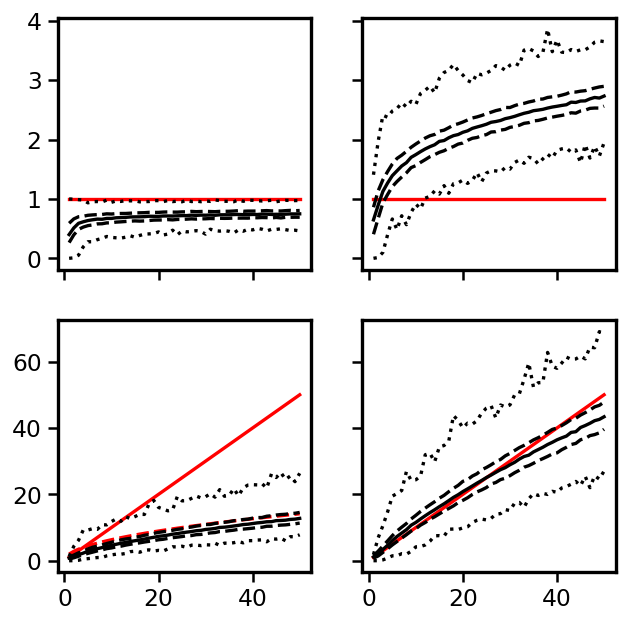

In [57]:
fig, axs = plt.subplots(2,2,figsize=(6,6),sharex=True,sharey='row')
ks = np.arange(1,51)

axs[0,0].plot(ks,0*ks+1,'r')
axs[0,1].plot(ks,0*ks+1,'r')
axs[1,0].plot(ks,ks,'r')
axs[1,0].plot(ks,2*np.sqrt(ks),'r--')
axs[1,1].plot(ks,ks,'r')

for (k,ax) in enumerate(axs.flat):
    a = Y[:,k,:]
    mina = np.min(a,axis=1)
    maxa = np.max(a,axis=1)

    ax.plot(ks,np.percentile(a, 50,axis=1),'k')
    ax.plot(ks,np.percentile(a, 25,axis=1),'k--')
    ax.plot(ks,np.percentile(a, 75,axis=1),'k--')
    ax.plot(ks,mina,'k:')
    ax.plot(ks,maxa,'k:')

print(np.sum(Y[:,0]>Y[:,1]))
print(np.sum(Y[:,2]>Y[:,3]))

Text(0, 0.5, 'mean(abs(coef))')

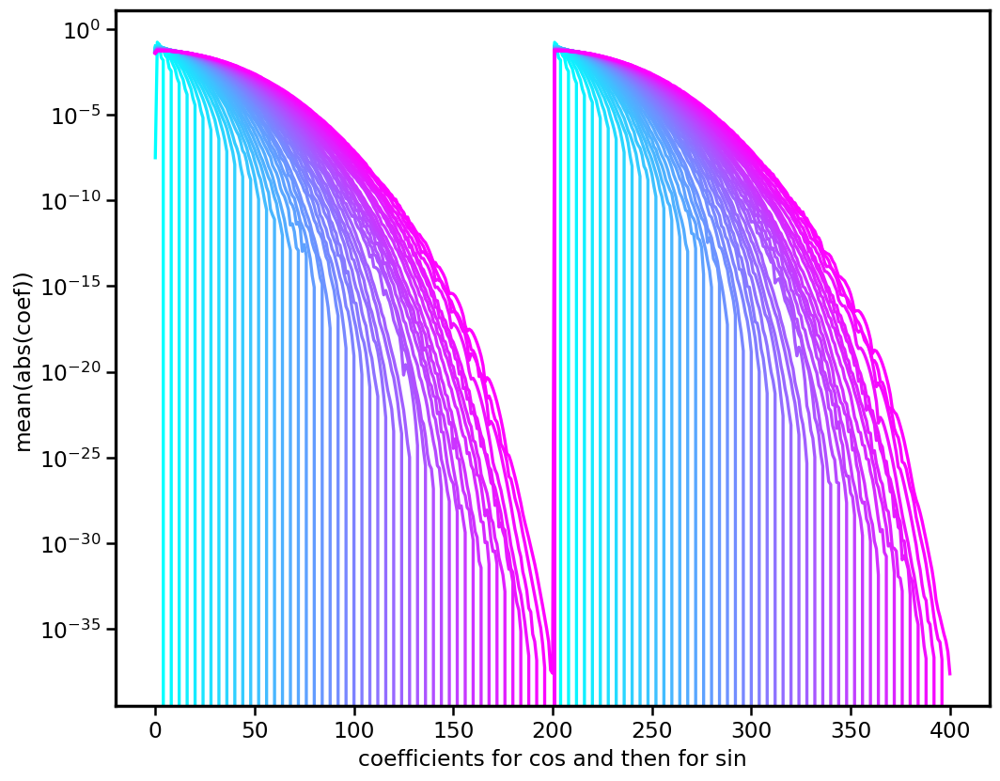

In [58]:
for k in range(numlayers):
    plt.semilogy(np.mean(np.abs(ocs[:,k,:]),axis=0).T,c=cmap(k/(numlayers-1)),label=f"# layers = {k+1}")
# plt.plot([0,out_fun.shape[2]],[1,1],'k')
plt.xlabel('coefficients for cos and then for sin')
plt.ylabel('mean(abs(coef))')
# plt.legend()

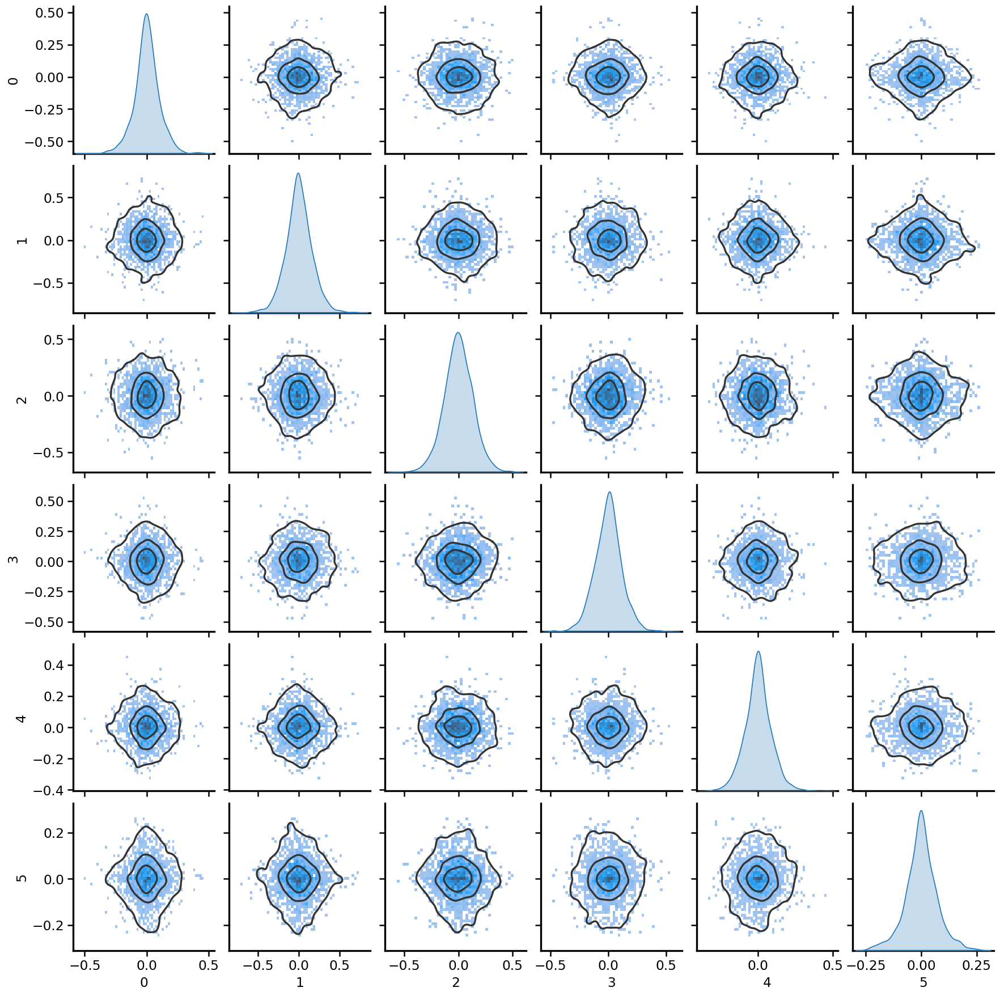

In [59]:
inds = [0,1,2,3,4,5]
data = ocs[:,2,inds].squeeze()
df = pd.DataFrame(data)
g = sns.pairplot(df, diag_kind="kde", kind="hist")
g.map_offdiag(sns.kdeplot, levels=4, color=".2")

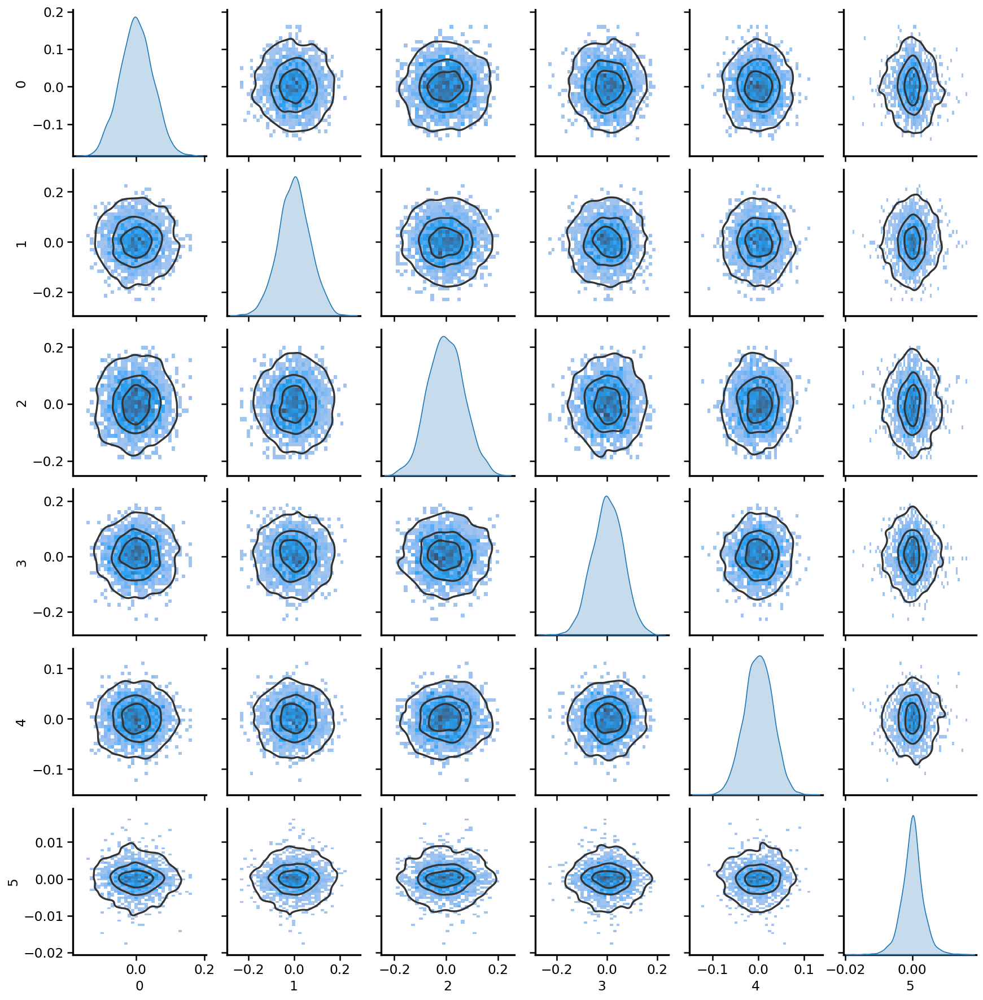

In [60]:
inds = [0,1,2,10,25,50]
data = ocs[:,-1,inds].squeeze()
df = pd.DataFrame(data)
g = sns.pairplot(df, diag_kind="kde", kind="hist")
g.map_offdiag(sns.kdeplot, levels=4, color=".2")

## Experiment 3
* A = XIII + IXII + IIXI + IIIX
* Bs : Haar random integer spectrum
* M = A

### Experiment definition

In [64]:
I,X,Y,Z = Paulis()
A = (np.kron(np.kron(np.kron(X,I),I),I) + np.kron(np.kron(np.kron(I,X),I),I) + np.kron(np.kron(np.kron(I,I),X),I) + np.kron(np.kron(np.kron(I,I),I),X))/2
Bs = []
for k in range(5):
    U = unitary_group.rvs(16,random_state=k)
    D = np.diag([-1]*8 + [1]*8)
    B = U @ D @ U.T.conj()
    Bs.append(B)

M = A/2
N = A.shape[0]

numlayers = 50
numthes=1000
np.random.seed(0)
thes = (np.random.rand(numthes,numlayers*len(Bs))-0.5)*np.pi

### Check State Amplitude in the $e^{ix\pi}$ basis

In [65]:
fun_states = jit(vmap(lambda thes : thes_state(A,Bs,numlayers,thes)),device=dev)

In [66]:
states = fun_states(thes)
print(f"The {states.shape[2]} complex amplitudes of the state vector for the {states.shape[3]} frequencies at the end of each of the {states.shape[1]} layers was sampled for {states.shape[0]} instances of the circuit parameters")

The 16 complex amplitudes of the state vector for the 201 frequencies at the end of each of the 50 layers was sampled for 1000 instances of the circuit parameters


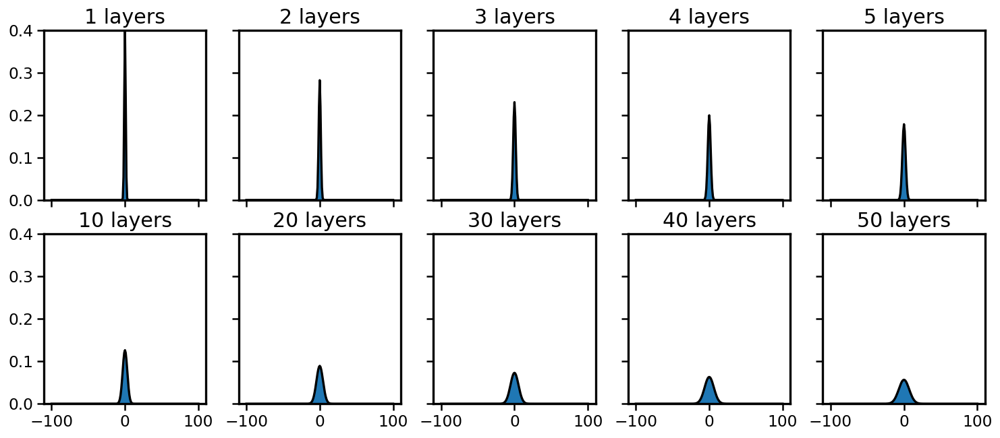

In [68]:
L = 100
x = np.arange(-L,L+1)
states_norm = np.sum(np.abs(states)**2,axis=2)

inds = [0,1,2,3,4,9,19,29,39,49]
fig,axs = plt.subplots(2,5,figsize=(15,6), sharex=True, sharey=True)
for k,ax in enumerate(axs.flat):
    ax.bar(x,np.mean(states_norm[:,inds[k],:],axis=0), color = 'C0',width =1.1)
    ax.plot(x,1/np.sqrt(2*(inds[k]+1)*np.pi)*np.exp(-x**2/(inds[k]+1)/2),'k')
    ax.set_title(f"{inds[k]+1} layers",fontsize = 18)
    ax.set_ylim([0,0.4])

# fig.savefig('layered_ansatzes.pdf')

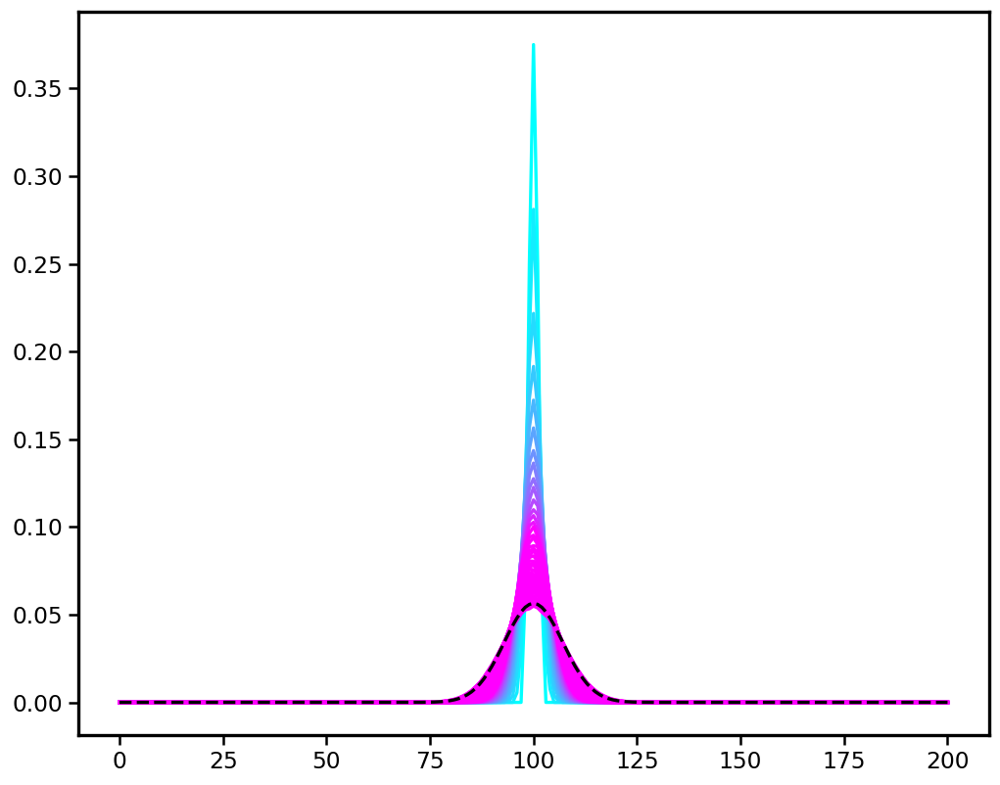

In [69]:
mean_ab = np.mean(np.abs(states_norm),axis=0)
mean_ab.shape
for k in range(50):
    plt.plot(mean_ab[k,:],c=cmap(k/14));
plt.plot(1/np.sqrt(2*(k+1)*np.pi)*np.exp(-x**2/(k+1)/2),'k--')

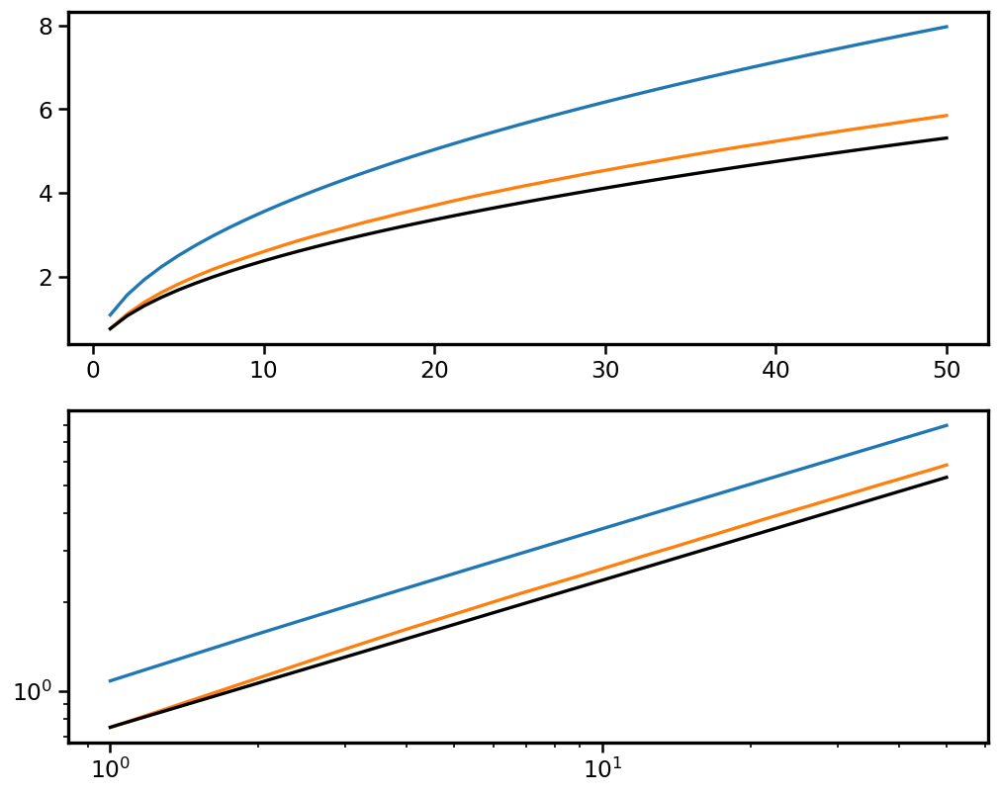

In [70]:
ma = []
mb = []
ks = np.arange(0,50)
x = np.arange(-L,L+1)

for k in ks:
    a = 1/np.sqrt(4*(k+1)*np.pi)*np.exp(-x**2/(k+1)/4)
    b = mean_ab[k,:]
    ma.append(np.sum(a*np.abs(x)))
    mb.append(np.sum(b*np.abs(x)))

plt.subplot(211)
plt.plot(ks+1,ma)
plt.plot(ks+1,mb)
plt.plot(ks+1,np.sqrt(ks+1)/np.pi**(1/4),'k')
# plt.plot(ks+1,np.sqrt(ks+1)*1.1,'k')

plt.subplot(212)
plt.loglog(ks+1,ma)
plt.loglog(ks+1,mb)
plt.loglog(ks+1,np.sqrt(ks+1)/np.pi**(1/4),'k')
# plt.loglog(ks+1,np.sqrt(ks+1)*1.1,'k')

In [71]:
obs = jit(lambda states : measurement(states,M),device=dev)(states[:2500,:,:,:])

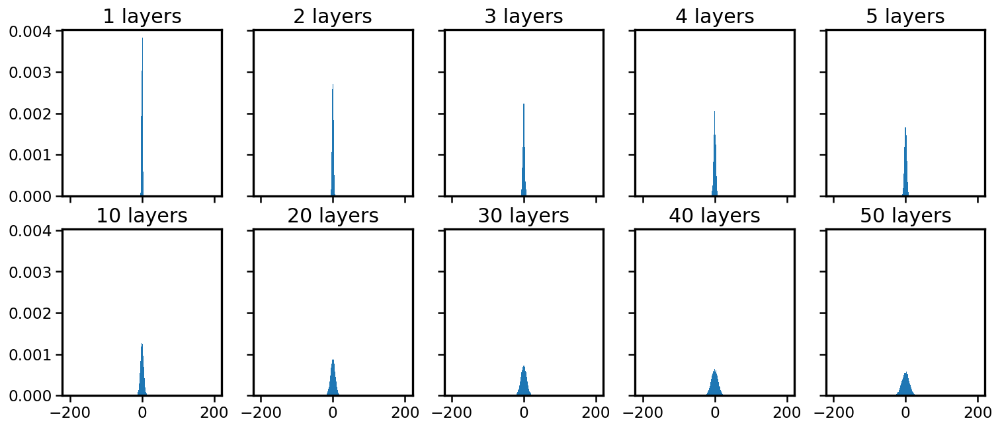

In [72]:
L = 200
x = np.arange(-L,L+1)
obs_norm = np.abs(obs)**2

inds = [0,1,2,3,4,9,19,29,39,49]
fig,axs = plt.subplots(2,5,figsize=(15,6), sharex=True, sharey=True)
for k,ax in enumerate(axs.flat):
    ax.bar(x,np.mean(obs_norm[:,inds[k],:],axis=0), color = 'C0',width =1.1)
    ax.set_title(f"{inds[k]+1} layers",fontsize = 18)
    # ax.set_ylim([0,0.6])

# fig.savefig('layered_ansatzes.pdf')

### Check output function in the $\cos(x\pi)$ and $\sin(x\pi)$ basis

In [73]:
one,cos,sin = trig_to_sc(obs)
ocs = np.concatenate([one,cos,sin],axis=2)
print(f"The output functions as cos sin decomposition represented by {ocs.shape[2]} coefficient at the end of each of the {ocs.shape[1]} layers was sampled for {ocs.shape[0]} instances of the circuit parameters")
ocs.shape

The output functions as cos sin decomposition represented by 401 coefficient at the end of each of the 50 layers was sampled for 1000 instances of the circuit parameters


(1000, 50, 401)

In [74]:
Y = []
for k in range(ocs.shape[1]):
    ys_max, P_L1, dys_max, dP_L1 = max_lip(ocs[:,k,:].T)
    Y.append([ys_max, P_L1, dys_max, dP_L1])
Y = np.array(Y)
Y.shape

(50, 4, 1000)

0
0


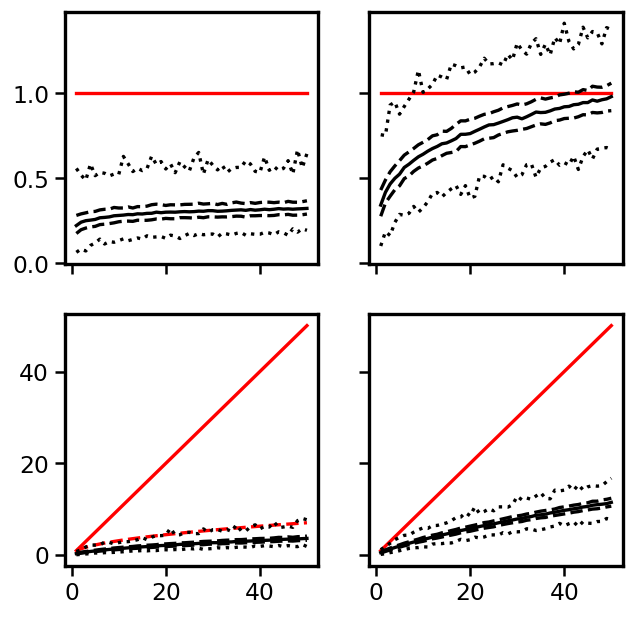

In [79]:
fig, axs = plt.subplots(2,2,figsize=(6,6),sharex=True,sharey='row')
ks = np.arange(1,51)

axs[0,0].plot(ks,0*ks+1,'r')
axs[0,1].plot(ks,0*ks+1,'r')
axs[1,0].plot(ks,ks,'r')
axs[1,0].plot(ks,np.sqrt(ks),'r--')
axs[1,1].plot(ks,ks,'r')

for (k,ax) in enumerate(axs.flat):
    a = Y[:,k,:]
    mina = np.min(a,axis=1)
    maxa = np.max(a,axis=1)

    ax.plot(ks,np.percentile(a, 50,axis=1),'k')
    ax.plot(ks,np.percentile(a, 25,axis=1),'k--')
    ax.plot(ks,np.percentile(a, 75,axis=1),'k--')
    ax.plot(ks,mina,'k:')
    ax.plot(ks,maxa,'k:')

print(np.sum(Y[:,0]>Y[:,1]))
print(np.sum(Y[:,2]>Y[:,3]))

Text(0, 0.5, 'mean(abs(coef))')

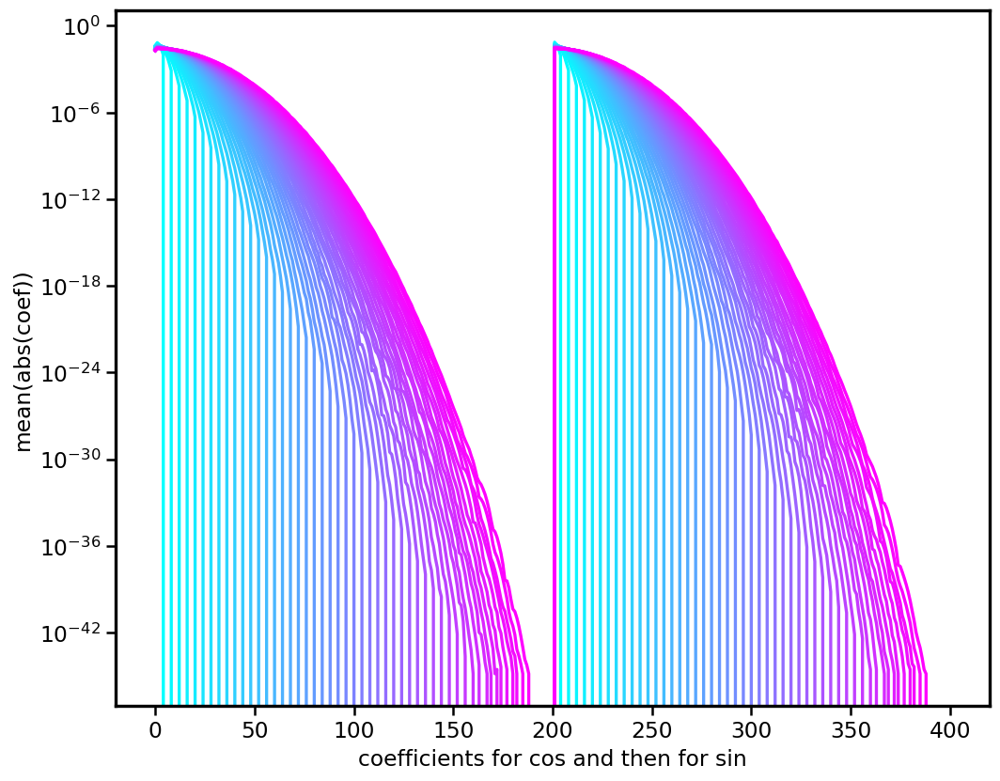

In [76]:
for k in range(numlayers):
    plt.semilogy(np.mean(np.abs(ocs[:,k,:]),axis=0).T,c=cmap(k/(numlayers-1)),label=f"# layers = {k+1}")
# plt.plot([0,out_fun.shape[2]],[1,1],'k')
plt.xlabel('coefficients for cos and then for sin')
plt.ylabel('mean(abs(coef))')
# plt.legend()

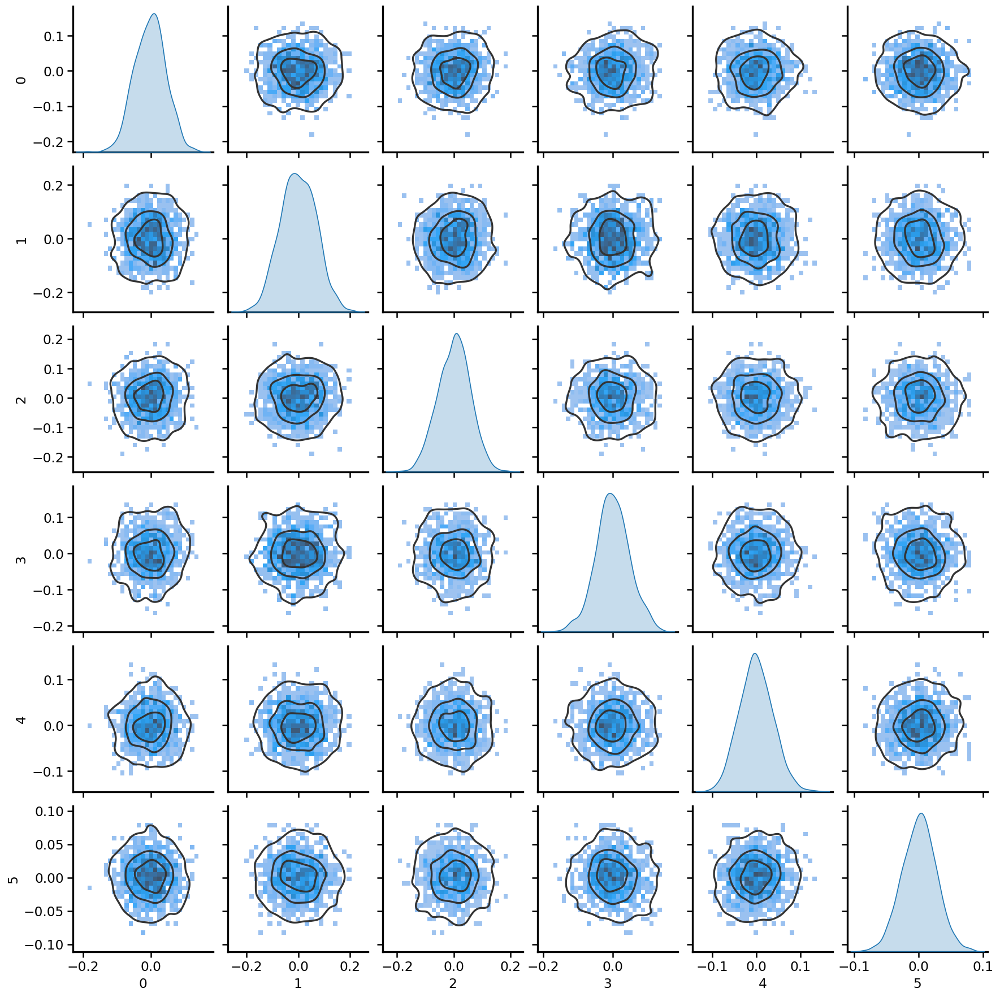

In [77]:
inds = [0,1,2,3,4,5]
data = ocs[:,2,inds].squeeze()
df = pd.DataFrame(data)
g = sns.pairplot(df, diag_kind="kde", kind="hist")
g.map_offdiag(sns.kdeplot, levels=4, color=".2")

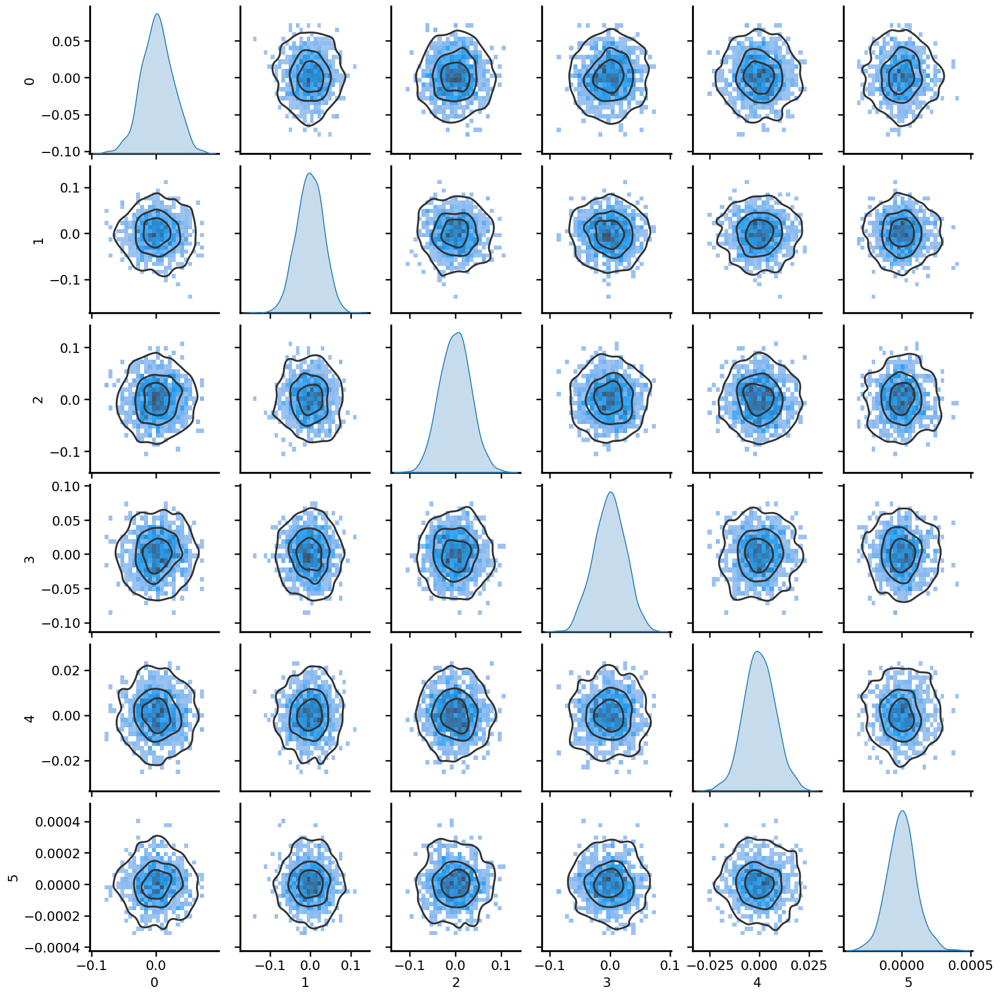

In [78]:
inds = [0,1,2,10,25,50]
data = ocs[:,-1,inds].squeeze()
df = pd.DataFrame(data)
g = sns.pairplot(df, diag_kind="kde", kind="hist")
g.map_offdiag(sns.kdeplot, levels=4, color=".2")

# Old

## Experiment 4 (predictible)
* A = (XIII + IXII + IIXI + IIIX + 4 IIII)/2
* Bs : Haar random integer spectrum
* M = A

### Experiment definition

In [84]:
I,X,Y,Z = Paulis()
A = (np.kron(np.kron(np.kron(X,I),I),I) + np.kron(np.kron(np.kron(I,X),I),I) + np.kron(np.kron(np.kron(I,I),X),I) + np.kron(np.kron(np.kron(I,I),I),X))/2 + 2*np.kron(np.kron(np.kron(I,I),I),I)
print(np.linalg.eigvalsh(A))
Bs = []
for k in range(5):
    U = unitary_group.rvs(16,random_state=k)
    D = np.diag([-1]*8 + [1]*8)
    B = U @ D @ U.T.conj()
    Bs.append(B)

M = A/4
N = A.shape[0]

numlayers = 50
numthes=1000
np.random.seed(0)
thes = (np.random.rand(numthes,numlayers*len(Bs))-0.5)*np.pi

[-5.55111512e-17  1.00000000e+00  1.00000000e+00  1.00000000e+00
  1.00000000e+00  2.00000000e+00  2.00000000e+00  2.00000000e+00
  2.00000000e+00  2.00000000e+00  2.00000000e+00  3.00000000e+00
  3.00000000e+00  3.00000000e+00  3.00000000e+00  4.00000000e+00]


### Check State Amplitude in the $e^{ix\pi}$ basis

In [88]:
fun_states = jit(vmap(lambda thes : thes_state(A,Bs,numlayers,thes)),device=dev)

In [89]:
states = fun_states(thes)
print(f"The {states.shape[2]} complex amplitudes of the state vector for the {states.shape[3]} frequencies at the end of each of the {states.shape[1]} layers was sampled for {states.shape[0]} instances of the circuit parameters")

The 16 complex amplitudes of the state vector for the 401 frequencies at the end of each of the 50 layers was sampled for 1000 instances of the circuit parameters


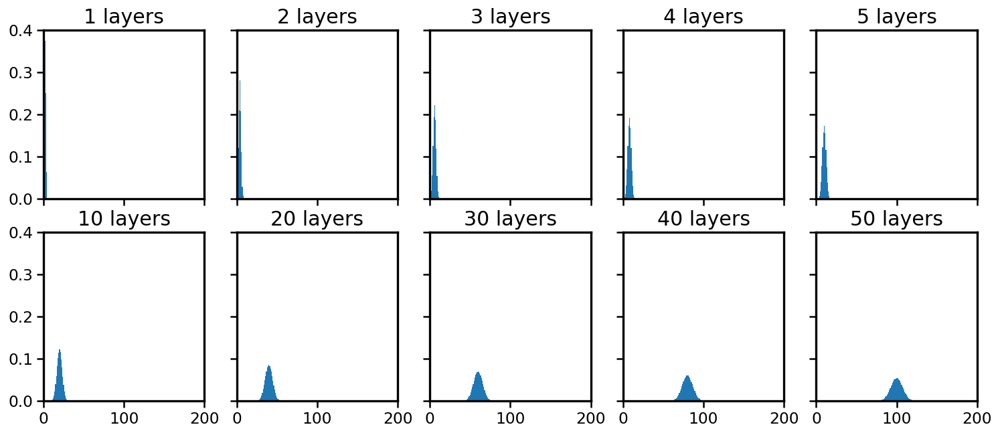

In [92]:
L = 200
x = np.arange(-L,L+1)
states_norm = np.sum(np.abs(states)**2,axis=2)

inds = [0,1,2,3,4,9,19,29,39,49]
fig,axs = plt.subplots(2,5,figsize=(15,6), sharex=True, sharey=True)
for k,ax in enumerate(axs.flat):
    ax.bar(x,np.mean(states_norm[:,inds[k],:],axis=0), color = 'C0',width =1.1)
    # ax.plot(x,1/np.sqrt(2*(inds[k]+1)*np.pi)*np.exp(-x**2/(inds[k]+1)/2),'k')
    ax.set_title(f"{inds[k]+1} layers",fontsize = 18)
    ax.set_ylim([0,0.4])
    ax.set_xlim([0,L])

# fig.savefig('layered_ansatzes.pdf')

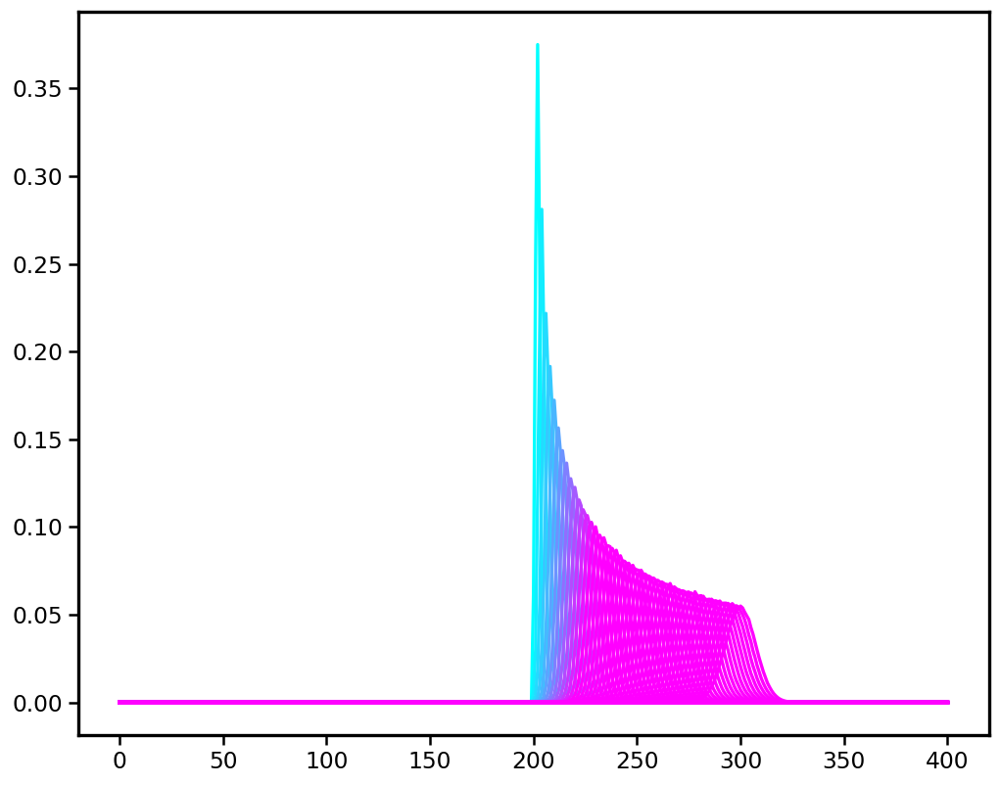

In [93]:
mean_ab = np.mean(np.abs(states_norm),axis=0)
mean_ab.shape
for k in range(50):
    plt.plot(mean_ab[k,:],c=cmap(k/14));
# plt.plot(1/np.sqrt(2*(k+1)*np.pi)*np.exp(-x**2/(k+1)/2),'k--')

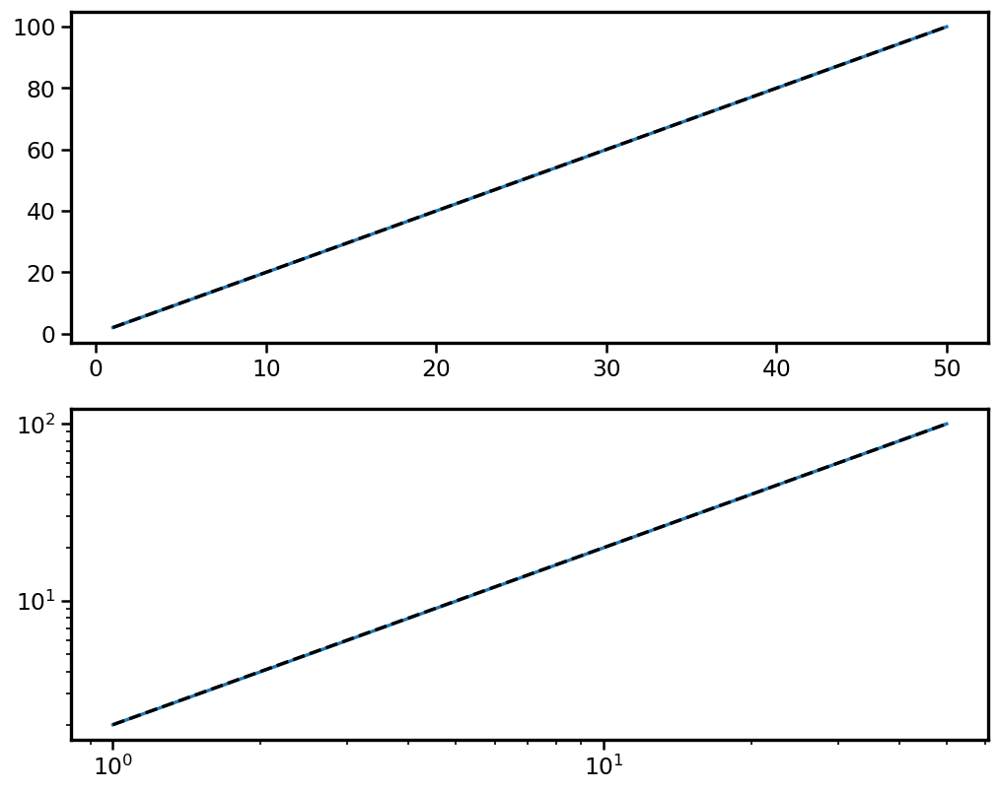

In [98]:
ma = []
mb = []
ks = np.arange(0,50)
x = np.arange(-L,L+1)

for k in ks:
    # a = 1/np.sqrt(4*(k+1)*np.pi)*np.exp(-x**2/(k+1)/4)
    b = mean_ab[k,:]
    # ma.append(np.sum(a*np.abs(x)))
    mb.append(np.sum(b*np.abs(x)))

plt.subplot(211)
# plt.plot(ks+1,ma)
plt.plot(ks+1,mb)
plt.plot(ks+1,2*(ks+1),'k--')
# plt.plot(ks+1,np.sqrt(ks+1)*1.1,'k')

plt.subplot(212)
# plt.loglog(ks+1,ma)
plt.loglog(ks+1,mb)
plt.loglog(ks+1,(ks+1)*2,'k--')
# plt.loglog(ks+1,np.sqrt(ks+1)*1.1,'k')

In [99]:
obs = jit(lambda states : measurement(states,M),device=dev)(states)

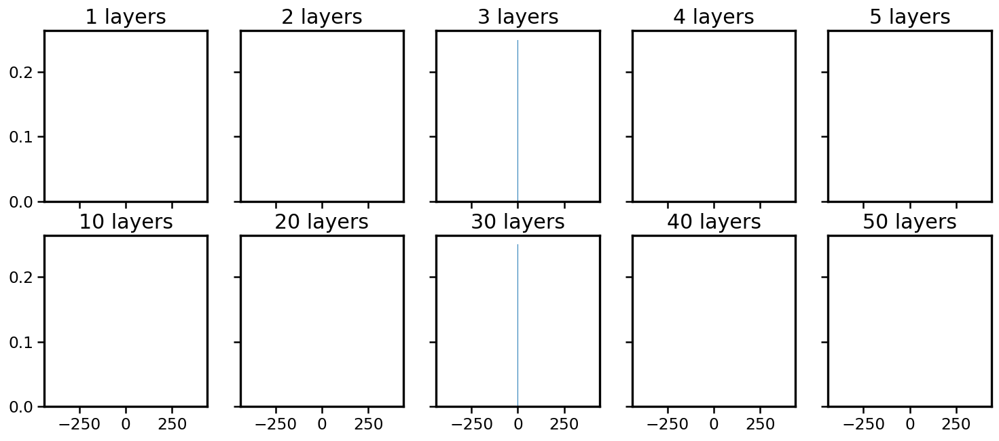

In [101]:
L = 400
x = np.arange(-L,L+1)
obs_norm = np.abs(obs)**2

inds = [0,1,2,3,4,9,19,29,39,49]
fig,axs = plt.subplots(2,5,figsize=(15,6), sharex=True, sharey=True)
for k,ax in enumerate(axs.flat):
    ax.bar(x,np.mean(obs_norm[:,inds[k],:],axis=0), color = 'C0',width =1.1)
    ax.set_title(f"{inds[k]+1} layers",fontsize = 18)
    # ax.set_ylim([0,0.6])

# fig.savefig('layered_ansatzes.pdf')

### Check output function in the $\cos(x\pi)$ and $\sin(x\pi)$ basis

In [102]:
one,cos,sin = trig_to_sc(obs)
ocs = np.concatenate([one,cos,sin],axis=2)
print(f"The output functions as cos sin decomposition represented by {ocs.shape[2]} coefficient at the end of each of the {ocs.shape[1]} layers was sampled for {ocs.shape[0]} instances of the circuit parameters")
ocs.shape

The output functions as cos sin decomposition represented by 801 coefficient at the end of each of the 50 layers was sampled for 1000 instances of the circuit parameters


(1000, 50, 801)

In [103]:
Y = []
for k in range(ocs.shape[1]):
    ys_max, P_L1, dys_max, dP_L1 = max_lip(ocs[:,k,:].T)
    Y.append([ys_max, P_L1, dys_max, dP_L1])
Y = np.array(Y)
Y.shape

(50, 4, 1000)

0
0


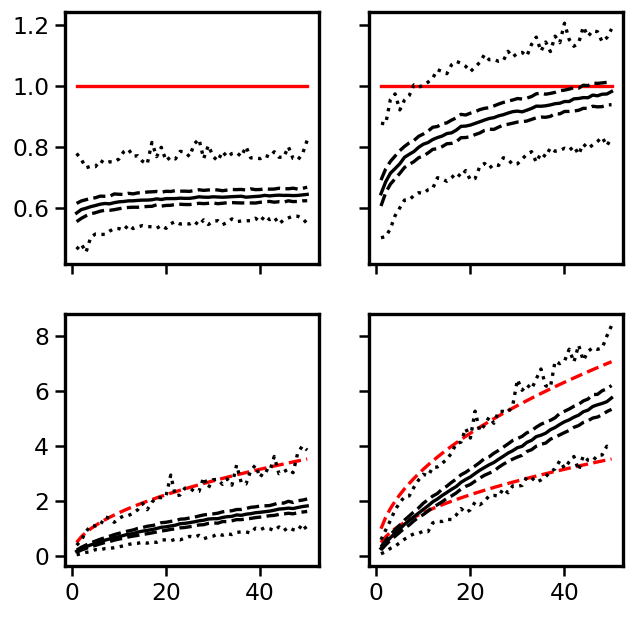

In [107]:
fig, axs = plt.subplots(2,2,figsize=(6,6),sharex=True,sharey='row')
ks = np.arange(1,51)

axs[0,0].plot(ks,0*ks+1,'r')
axs[0,1].plot(ks,0*ks+1,'r')
# axs[1,0].plot(ks,ks,'r')
axs[1,0].plot(ks,np.sqrt(ks)/2,'r--')
# axs[1,1].plot(ks,ks,'r')
axs[1,1].plot(ks,np.sqrt(ks)/2,'r--')
axs[1,1].plot(ks,np.sqrt(ks),'r--')

for (k,ax) in enumerate(axs.flat):
    a = Y[:,k,:]
    mina = np.min(a,axis=1)
    maxa = np.max(a,axis=1)

    ax.plot(ks,np.percentile(a, 50,axis=1),'k')
    ax.plot(ks,np.percentile(a, 25,axis=1),'k--')
    ax.plot(ks,np.percentile(a, 75,axis=1),'k--')
    ax.plot(ks,mina,'k:')
    ax.plot(ks,maxa,'k:')

print(np.sum(Y[:,0]>Y[:,1]))
print(np.sum(Y[:,2]>Y[:,3]))

Text(0, 0.5, 'mean(abs(coef))')

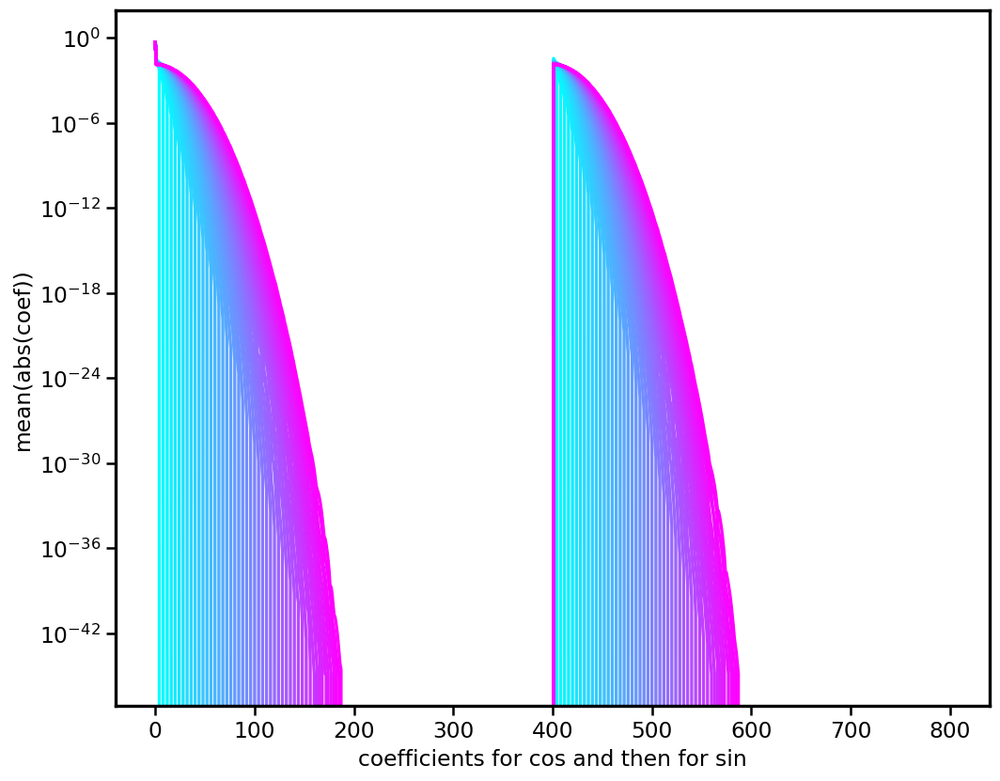

In [108]:
for k in range(numlayers):
    plt.semilogy(np.mean(np.abs(ocs[:,k,:]),axis=0).T,c=cmap(k/(numlayers-1)),label=f"# layers = {k+1}")
# plt.plot([0,out_fun.shape[2]],[1,1],'k')
plt.xlabel('coefficients for cos and then for sin')
plt.ylabel('mean(abs(coef))')
# plt.legend()

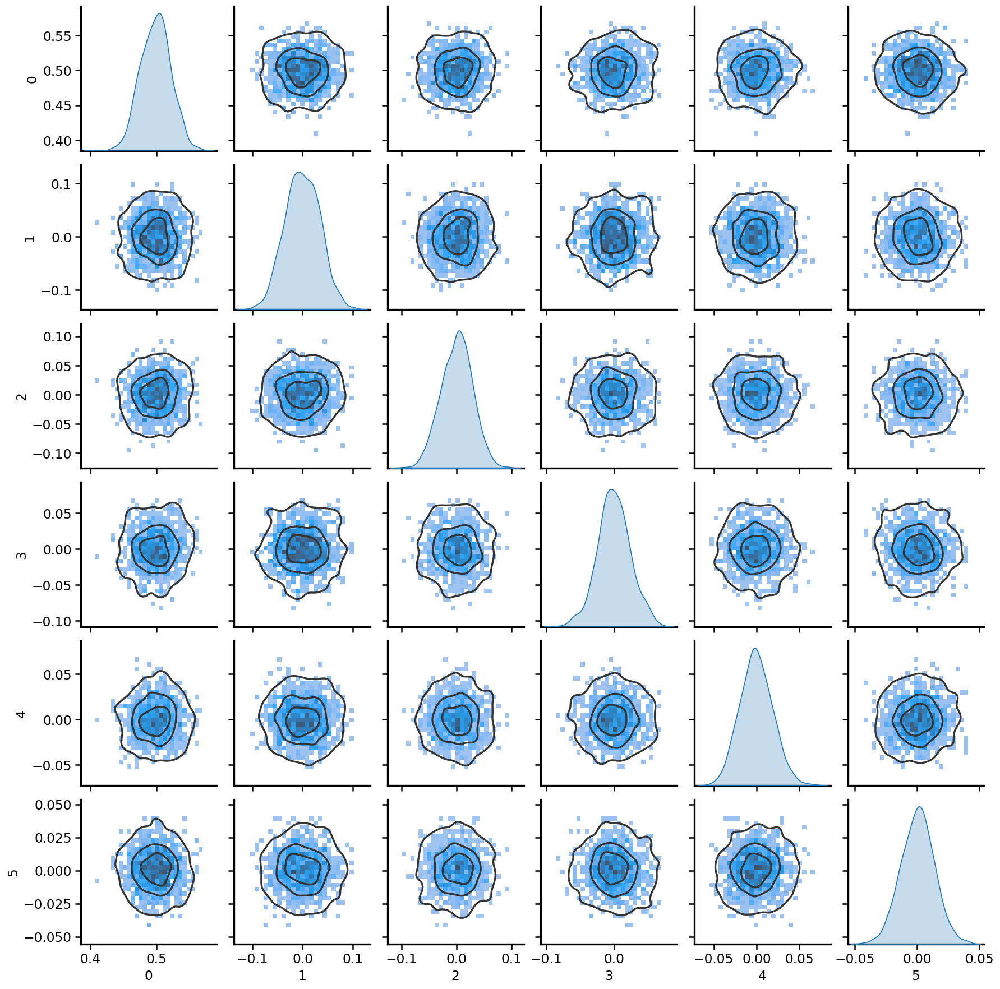

In [109]:
inds = [0,1,2,3,4,5]
data = ocs[:,2,inds].squeeze()
df = pd.DataFrame(data)
g = sns.pairplot(df, diag_kind="kde", kind="hist")
g.map_offdiag(sns.kdeplot, levels=4, color=".2")

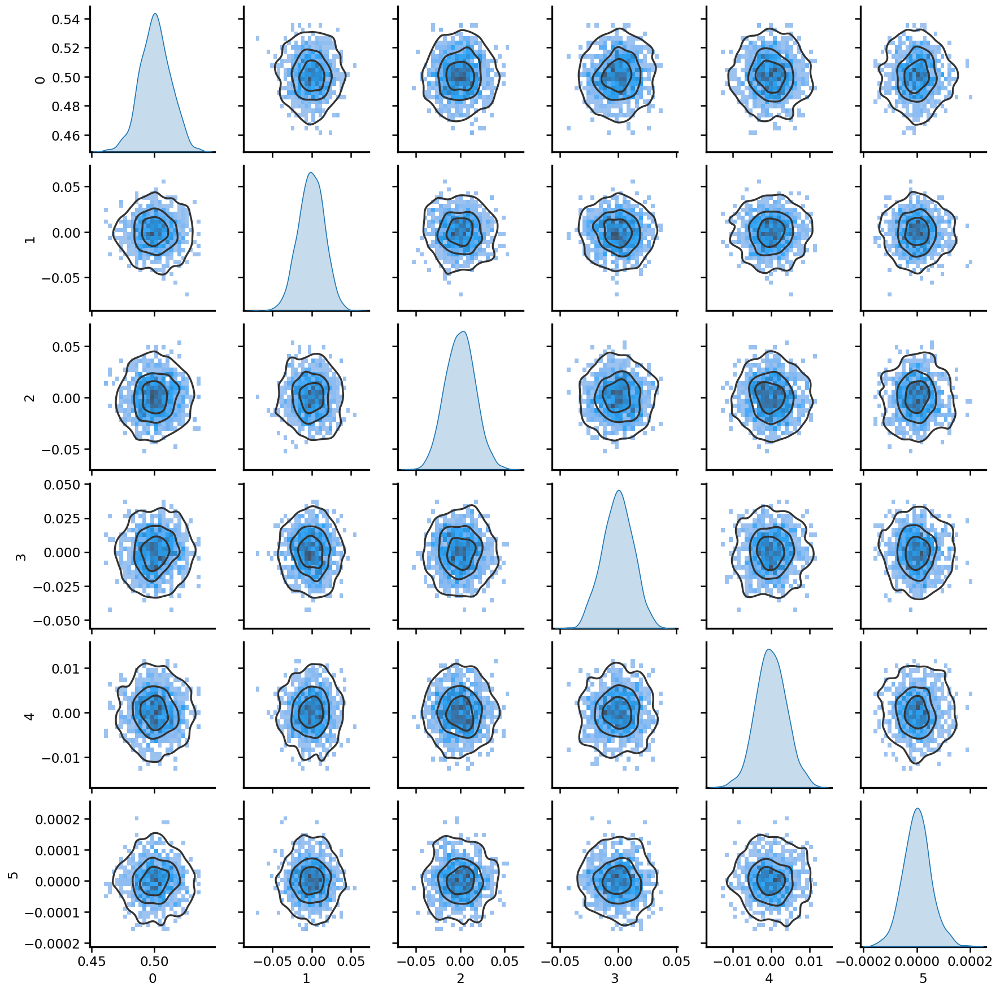

In [110]:
inds = [0,1,2,10,25,50]
data = ocs[:,-1,inds].squeeze()
df = pd.DataFrame(data)
g = sns.pairplot(df, diag_kind="kde", kind="hist")
g.map_offdiag(sns.kdeplot, levels=4, color=".2")

## norm max 1 sin and cos

In [201]:
N = 4
Ps = np.random.uniform(size=(2*N+1,300000))*2-1

In [224]:
xs = np.linspace(0,np.pi,201)
dx = xs[1] - xs[0]
r = eval_several_scpoly(Ps,xs)
r.shape

(300000, 201)

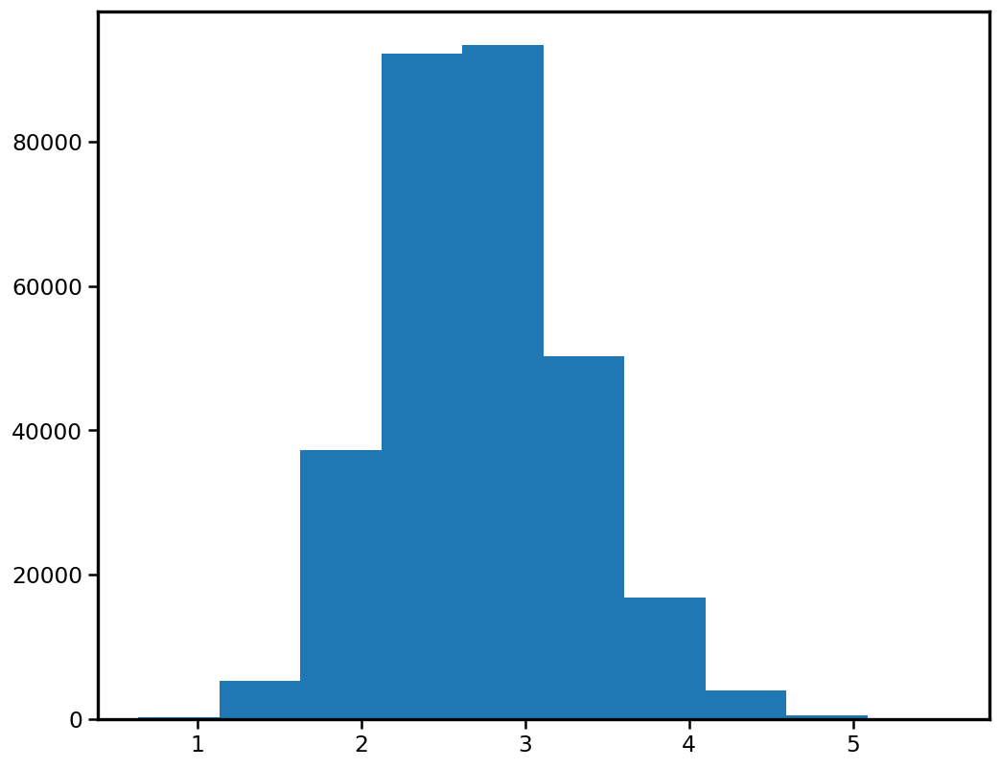

In [203]:
r_max = np.max(np.abs(r),axis=1,keepdims=True)
plt.hist(r_max);
r = r/r_max
Ps = Ps/r_max.T

(array([1.7920e+03, 3.0853e+04, 6.8496e+04, 7.7049e+04, 6.3463e+04,
        3.7801e+04, 1.5847e+04, 4.0670e+03, 5.8800e+02, 4.4000e+01]),
 array([1.04825591, 1.21595798, 1.38366005, 1.55136211, 1.71906418,
        1.88676625, 2.05446832, 2.22217038, 2.38987245, 2.55757452,
        2.72527659]),
 <BarContainer object of 10 artists>)

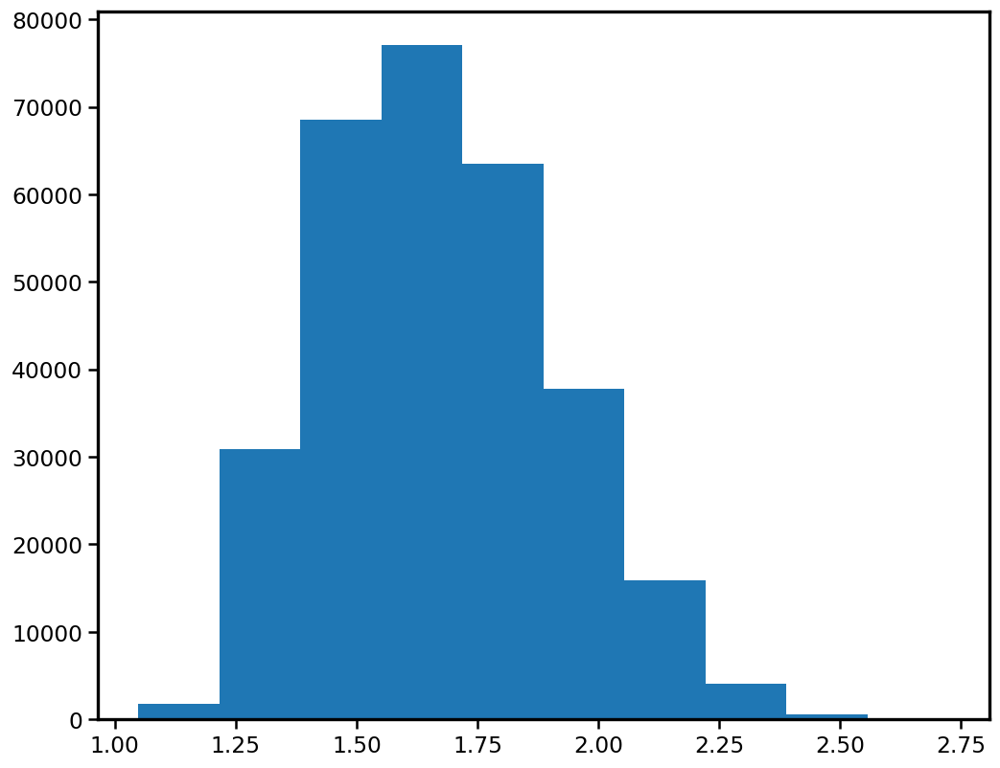

In [210]:
plt.hist(np.sum(np.abs(Ps),axis=0))

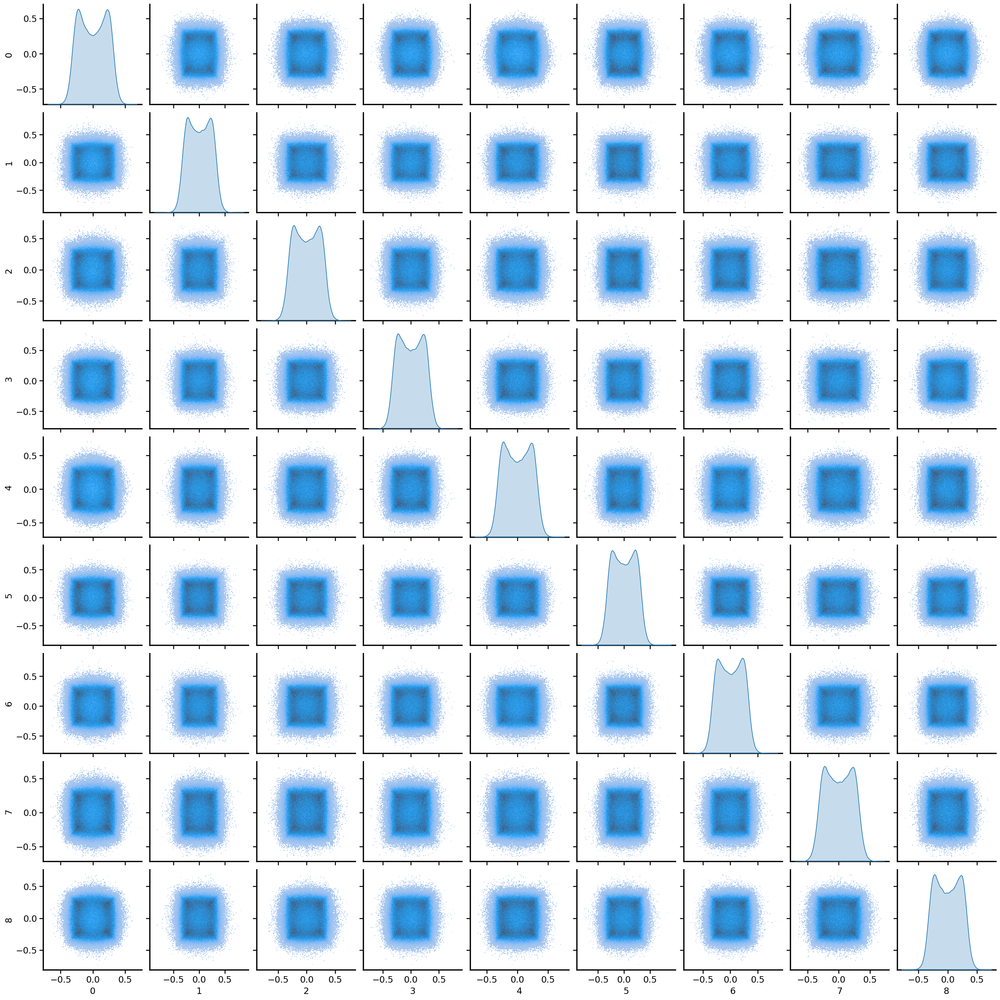

In [207]:
data = Ps.T
scale = np.max(data,axis=0)
# data = data/scale
df = pd.DataFrame(data)

g = sns.pairplot(df, diag_kind="kde", kind="hist")
# g = sns.pairplot(df,plot_kws={'alpha':0.1}, diag_kind="kde")
# g.sns.(kdeplot, levels=4, color=".2")
# g.axes[0,2].set_xlim((0,40))
# g.axes[1,2].set_xlim((-20,20))

In [228]:
s = np.max(np.abs(r[:,1:]-r[:,:-1]),axis=1)/dx

(array([4.0000e+01, 1.0630e+03, 8.8670e+03, 3.3310e+04, 6.5751e+04,
        7.6493e+04, 6.3548e+04, 3.9140e+04, 1.1311e+04, 4.7700e+02]),
 array([1.35124037, 1.97122793, 2.59121548, 3.21120303, 3.83119059,
        4.45117814, 5.07116569, 5.69115325, 6.3111408 , 6.93112835,
        7.55111591]),
 <BarContainer object of 10 artists>)

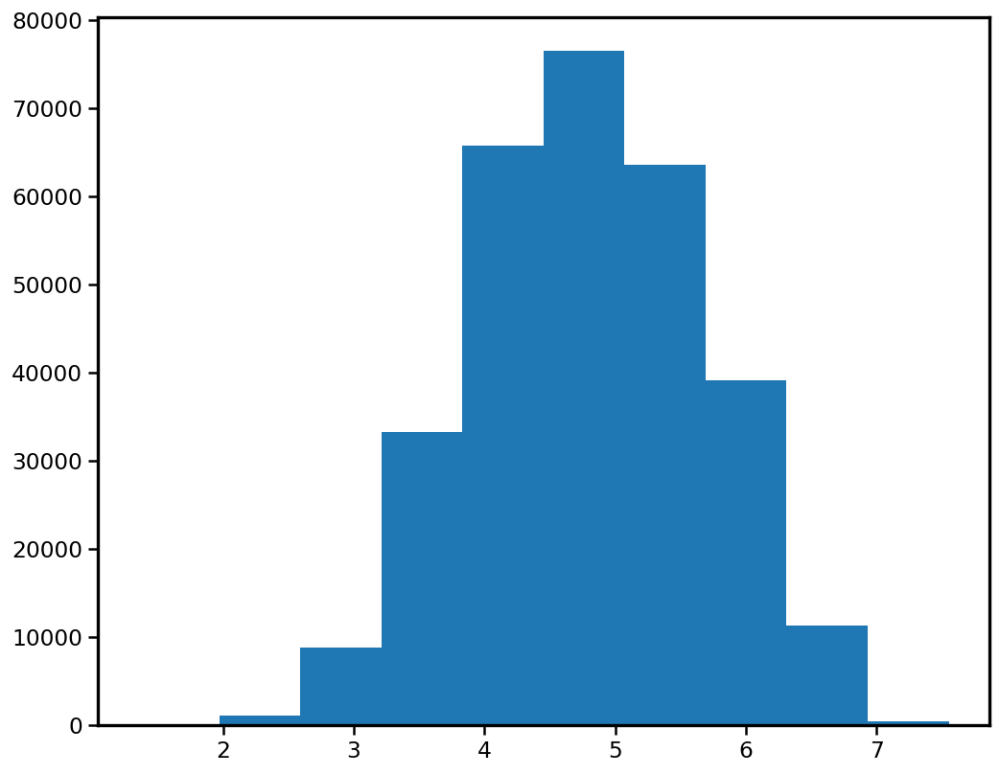

In [229]:
plt.hist(s)

In [230]:
Ps.shape
ks = np.concatenate([np.arange(5),np.arange(1,5)])
ks

array([0, 1, 2, 3, 4, 1, 2, 3, 4])

(array([  157.,  4203., 29537., 71373., 87699., 66578., 30703.,  8405.,
         1241.,   104.]),
 array([1.23810182, 1.78449248, 2.33088314, 2.8772738 , 3.42366446,
        3.97005513, 4.51644579, 5.06283645, 5.60922711, 6.15561778,
        6.70200844]),
 <BarContainer object of 10 artists>)

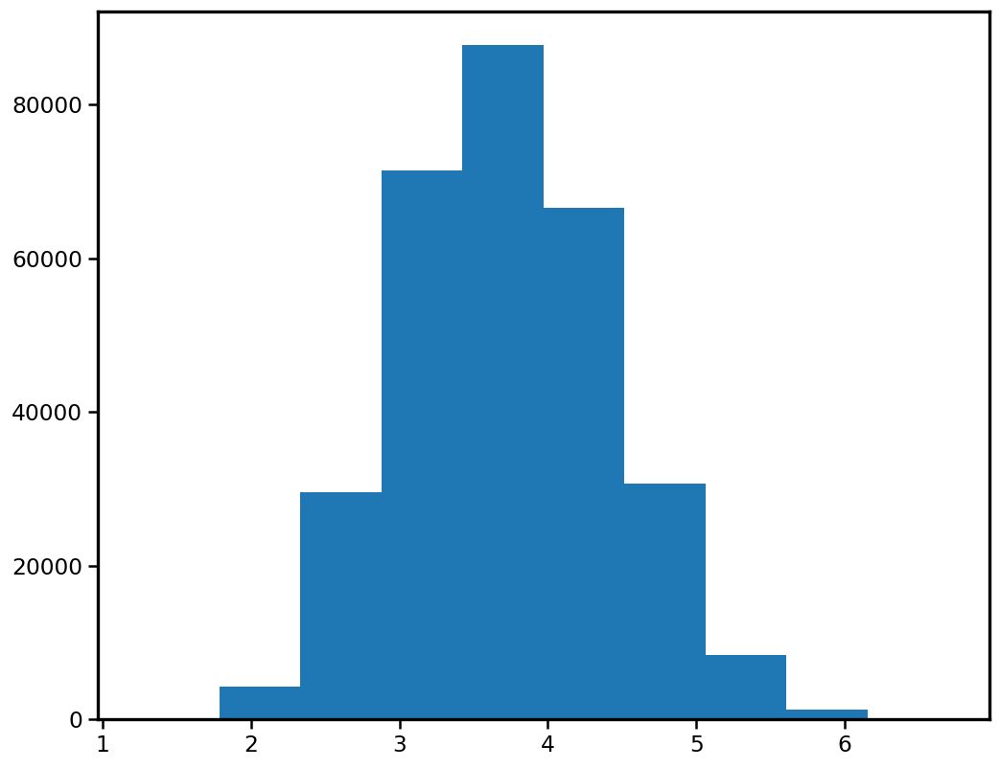

In [232]:
t = np.sum(np.abs(Ps)*np.expand_dims(ks,axis=1),axis=0)
plt.hist(t)

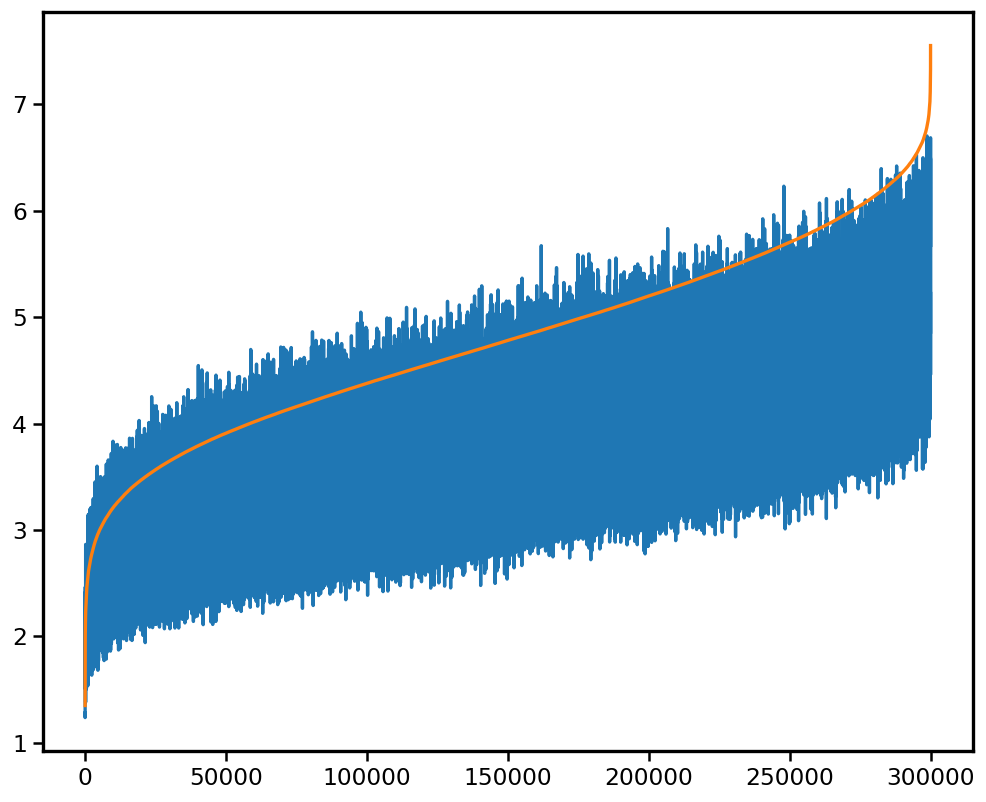

In [234]:
ids = np.argsort(s)
plt.plot(t[ids])
plt.plot(s[ids])


## norm max 1 just cos

In [254]:
Ps.shape
Ps_cos = Ps.copy()
Ps_cos[5:,:]=0

In [255]:
xs = np.linspace(0,np.pi,201)
dx = xs[1] - xs[0]
r = eval_several_scpoly(Ps_cos,xs)
r.shape

(300000, 201)

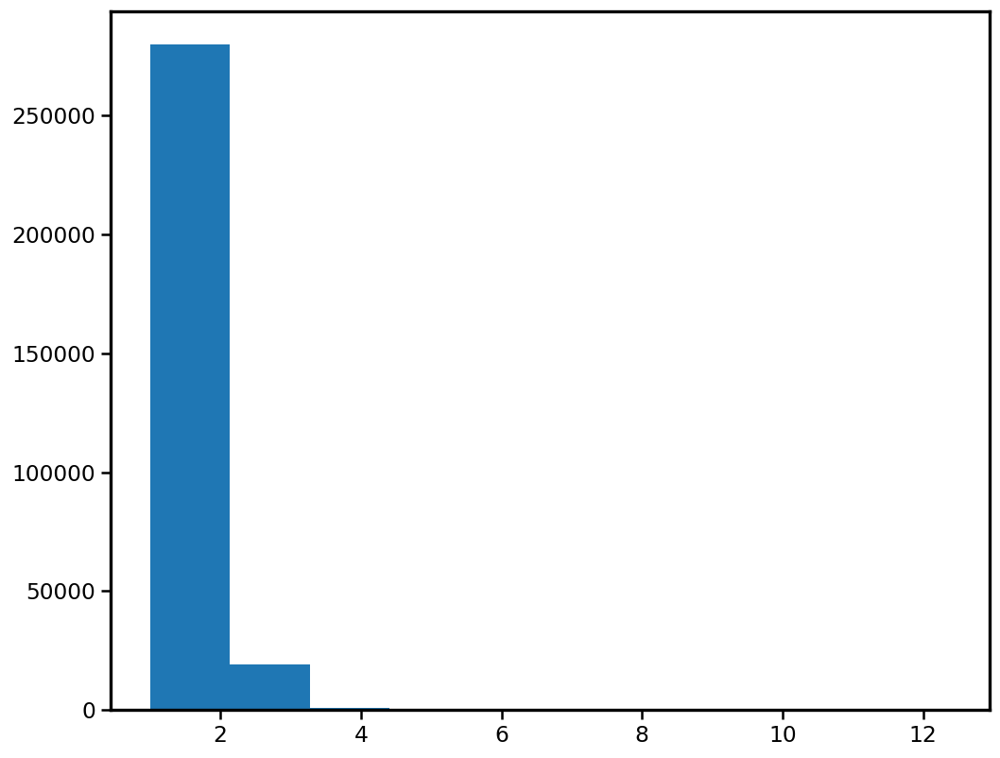

In [256]:
r_max = np.max(np.abs(r),axis=1,keepdims=True)
plt.hist(r_max);
r = r/r_max
Ps_cos = Ps_cos/r_max.T

(array([63549., 44534., 59408., 56961., 40347., 21881.,  9631.,  2938.,
          676.,    75.]),
 array([1.        , 1.12252085, 1.24504171, 1.36756256, 1.49008342,
        1.61260427, 1.73512513, 1.85764598, 1.98016684, 2.10268769,
        2.22520855]),
 <BarContainer object of 10 artists>)

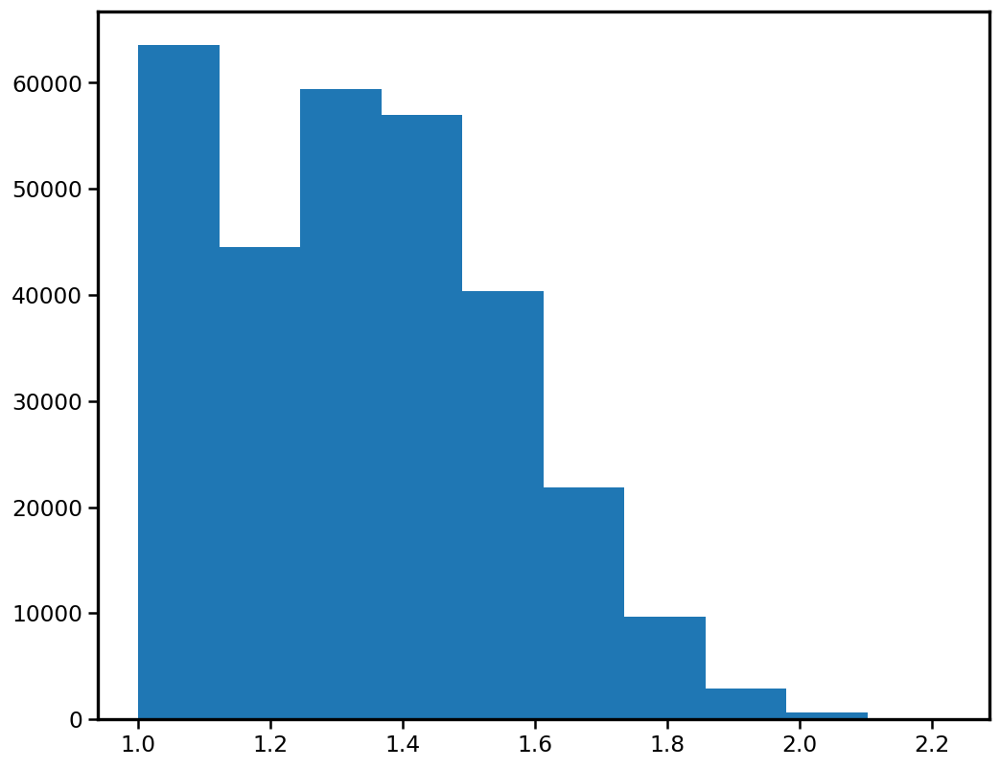

In [257]:
plt.hist(np.sum(np.abs(Ps_cos),axis=0))

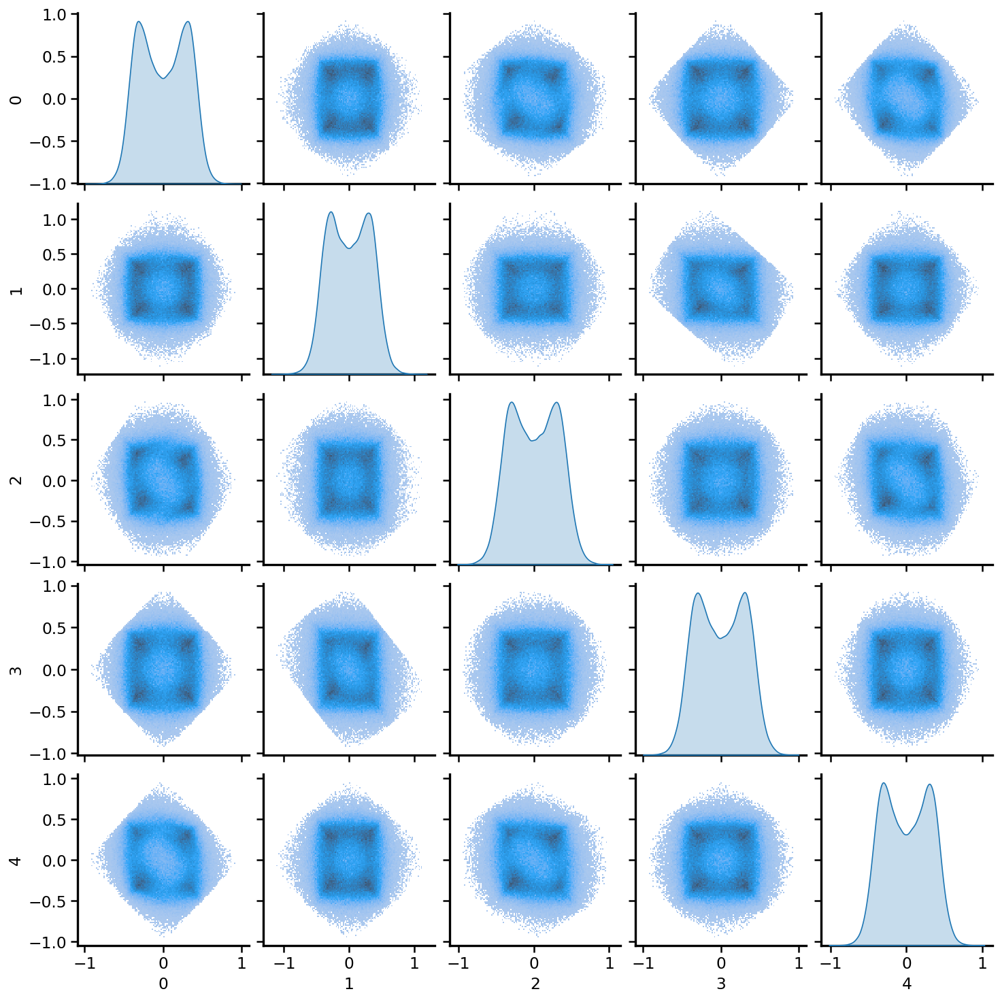

In [259]:
data = Ps_cos[:5,:].T
scale = np.max(data,axis=0)
# data = data/scale
df = pd.DataFrame(data)

g = sns.pairplot(df, diag_kind="kde", kind="hist")
# g = sns.pairplot(df,plot_kws={'alpha':0.1}, diag_kind="kde")
# g.sns.(kdeplot, levels=4, color=".2")
# g.axes[0,2].set_xlim((0,40))
# g.axes[1,2].set_xlim((-20,20))

In [260]:
s = np.max(np.abs(r[:,1:]-r[:,:-1]),axis=1)/dx

(array([  112.,  2960., 16320., 44478., 69824., 71114., 52185., 31131.,
        11104.,   772.]),
 array([0.33777203, 1.09281826, 1.84786449, 2.60291072, 3.35795695,
        4.11300318, 4.86804941, 5.62309564, 6.37814187, 7.1331881 ,
        7.88823433]),
 <BarContainer object of 10 artists>)

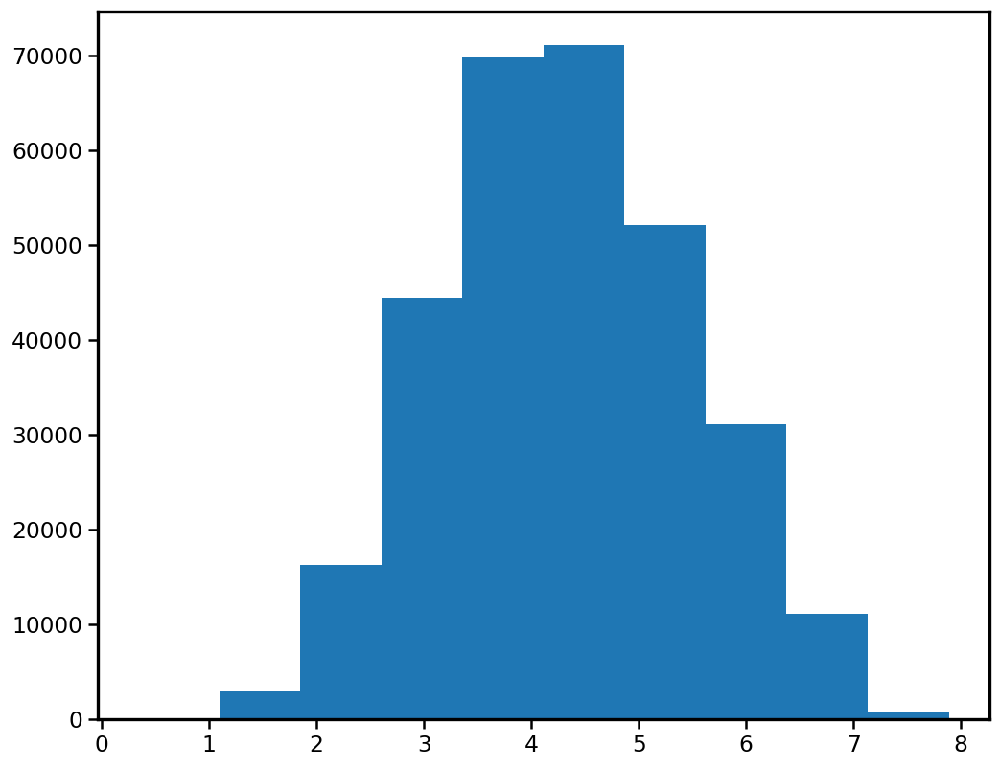

In [261]:
plt.hist(s)

(array([  242.,  4985., 28309., 66338., 82257., 66216., 37000., 12101.,
         2253.,   299.]),
 array([0.29012518, 0.80138924, 1.3126533 , 1.82391737, 2.33518143,
        2.84644549, 3.35770955, 3.86897361, 4.38023768, 4.89150174,
        5.4027658 ]),
 <BarContainer object of 10 artists>)

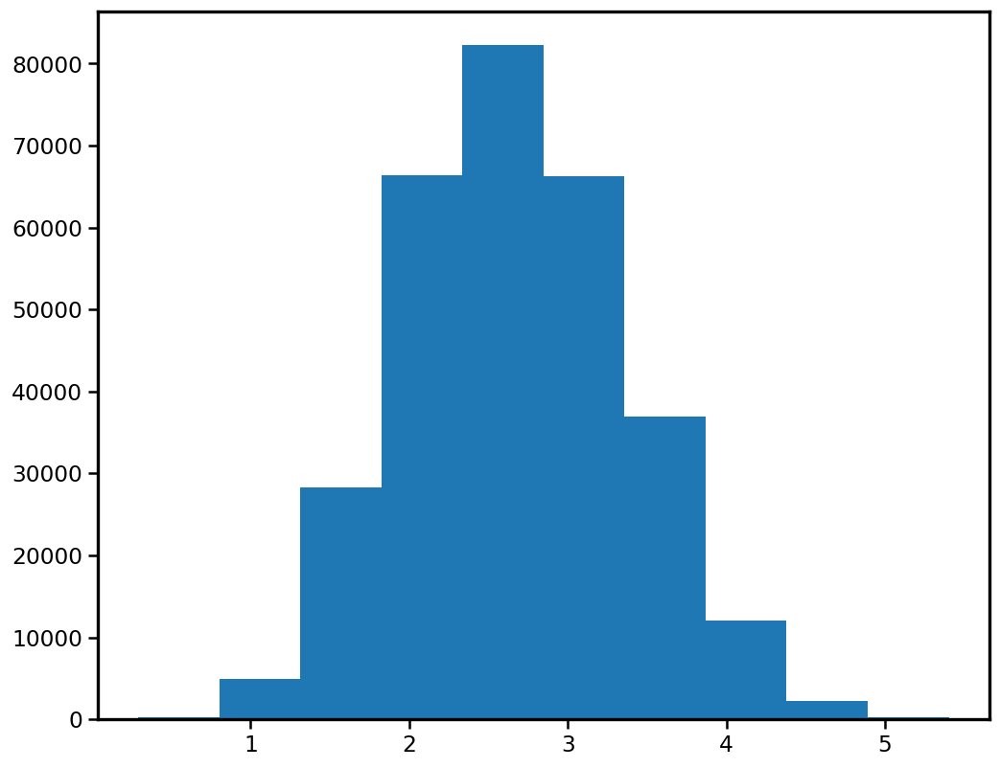

In [262]:
t = np.sum(np.abs(Ps_cos)*np.expand_dims(ks,axis=1),axis=0)
plt.hist(t)

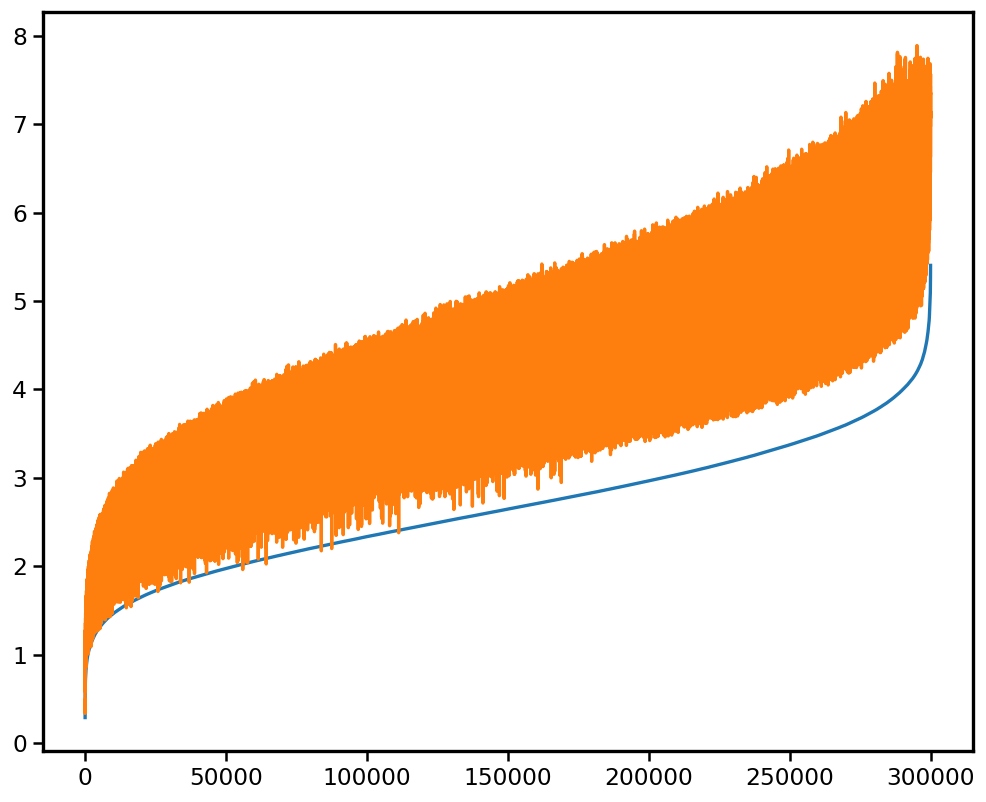

In [264]:
ids = np.argsort(t)
plt.plot(t[ids])
plt.plot(s[ids])


## dirichlet : just positive cosinus

In [281]:
Ps = np.concatenate([np.random.dirichlet(np.ones(5)/5, size=300000),np.zeros((300000,4))],axis=1).T
Ps.shape

(9, 300000)

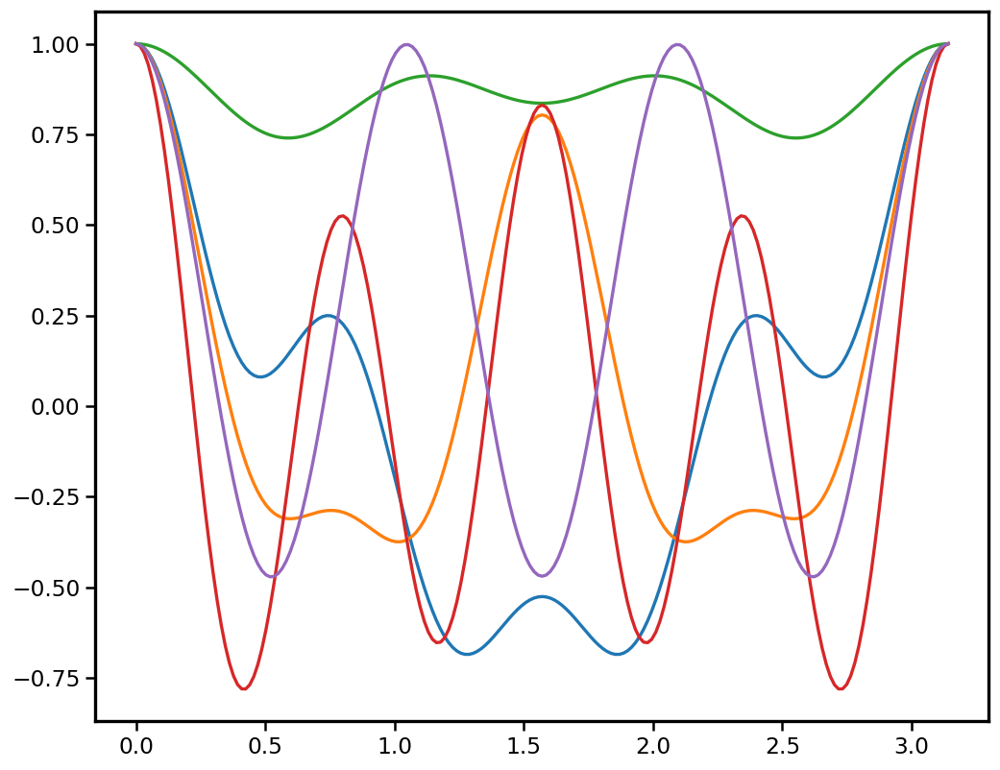

In [282]:
xs = np.linspace(0,np.pi,201)
dx = xs[1] - xs[0]
r = eval_several_scpoly(Ps,xs)
r.shape
plt.plot(xs,r[:5,:].T)

In [284]:
r_max = np.max(np.abs(r),axis=1,keepdims=True)
np.allclose(r_max,1)
# plt.hist(r_max);
# r = r/r_max
# Ps = Ps/r_max.T

True

In [286]:
np.allclose(np.sum(np.abs(Ps),axis=0),1)

True

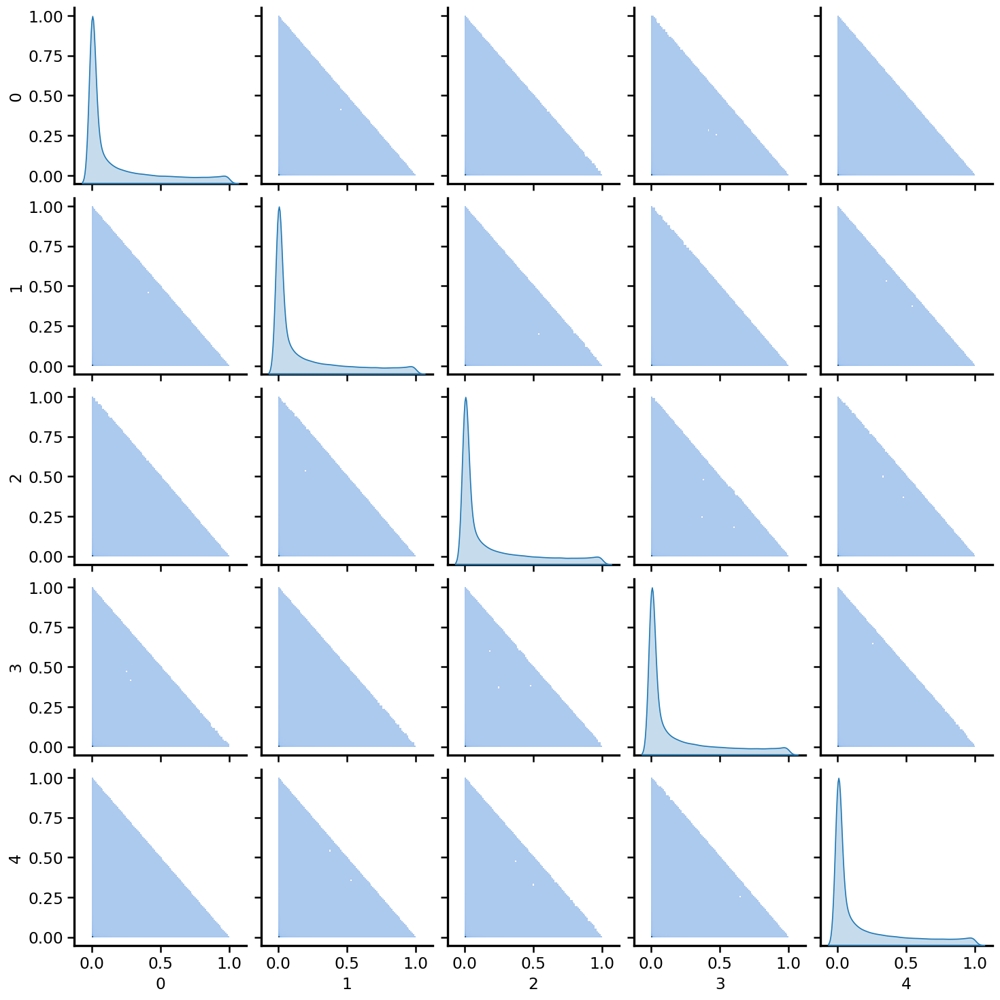

In [289]:
data = Ps[:5,:].T
scale = np.max(data,axis=0)
# data = data/scale
df = pd.DataFrame(data)

g = sns.pairplot(df, diag_kind="kde", kind="hist")
# g = sns.pairplot(df,plot_kws={'alpha':0.1}, diag_kind="kde")
# g.sns.(kdeplot, levels=4, color=".2")
# g.axes[0,2].set_xlim((0,40))
# g.axes[1,2].set_xlim((-20,20))

In [290]:
s = np.max(np.abs(r[:,1:]-r[:,:-1]),axis=1)/dx

(array([21374., 22694., 45735., 32712., 47916., 34211., 30344., 32234.,
        15815., 16965.]),
 array([2.51830149e-06, 7.99475823e-01, 1.59894913e+00, 2.39842243e+00,
        3.19789574e+00, 3.99736904e+00, 4.79684235e+00, 5.59631565e+00,
        6.39578895e+00, 7.19526226e+00, 7.99473556e+00]),
 <BarContainer object of 10 artists>)

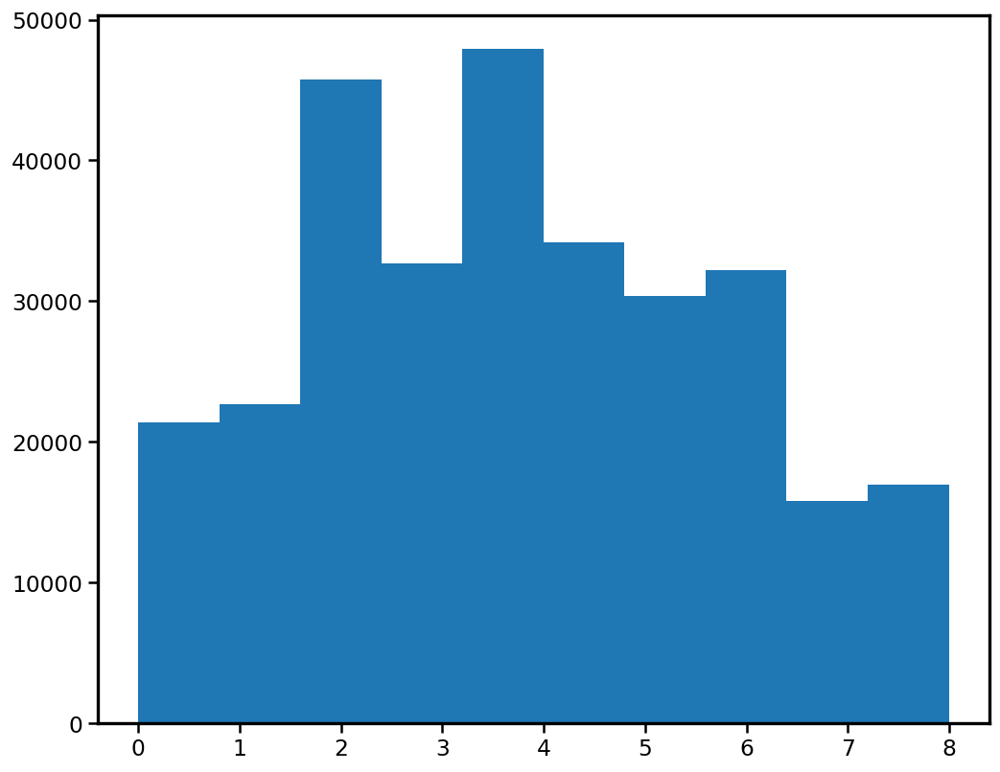

In [291]:
plt.hist(s)

(array([19511., 18763., 35789., 34361., 41814., 41995., 34242., 35629.,
        18443., 19453.]),
 array([2.61340284e-06, 8.00002193e-01, 1.60000177e+00, 2.40000135e+00,
        3.20000093e+00, 4.00000051e+00, 4.80000009e+00, 5.59999967e+00,
        6.39999925e+00, 7.19999883e+00, 7.99999841e+00]),
 <BarContainer object of 10 artists>)

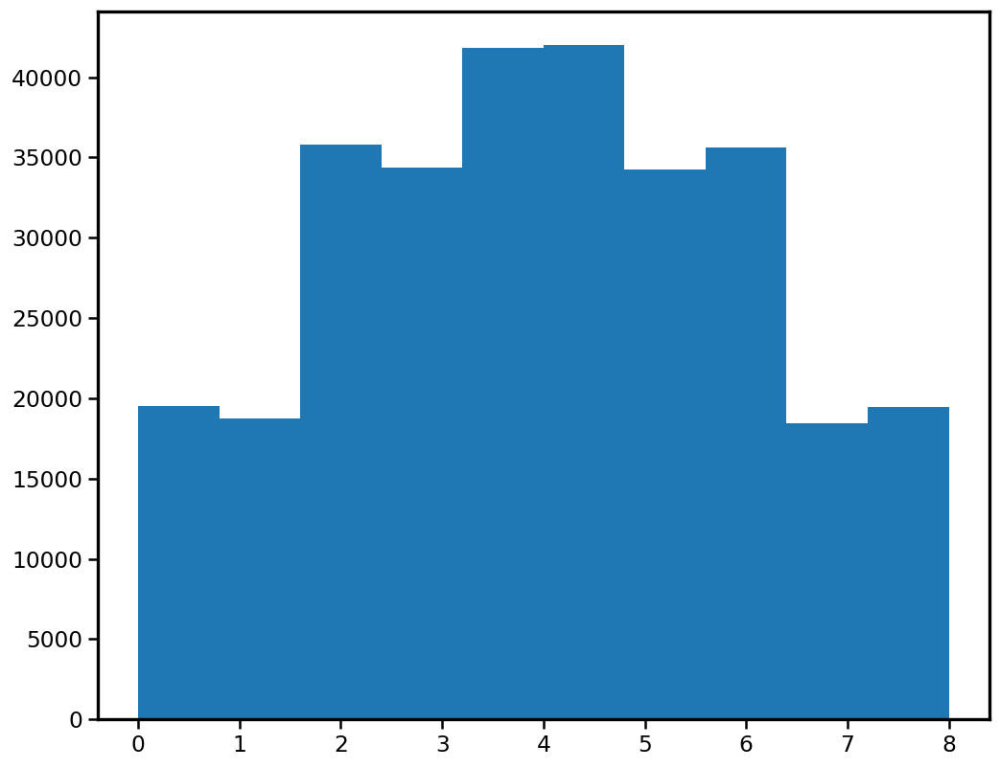

In [297]:
t = np.sum(np.abs(Ps)*2*np.expand_dims(ks,axis=1),axis=0)
plt.hist(t)

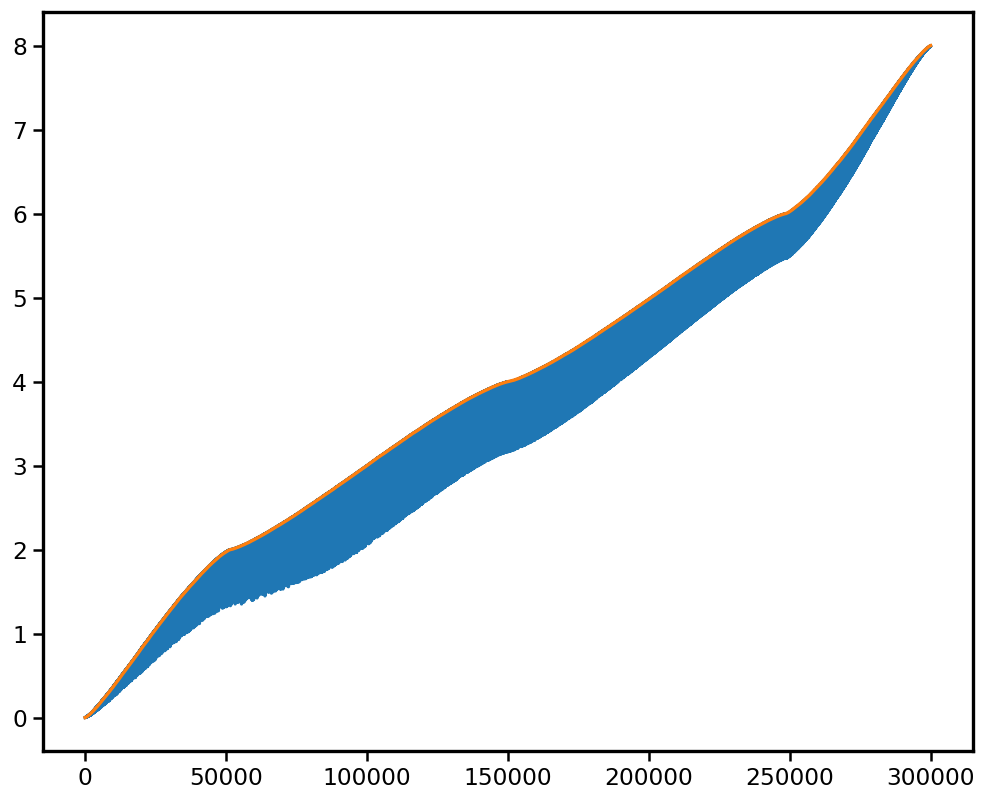

In [298]:
ids = np.argsort(t)
plt.plot(s[ids])
plt.plot(t[ids])

## dirichlet : signed cosinus

## Experiment 2
* A = XIII + IXII + IIXI + IIIXX
* B1 = YIII + IYII + IIYI + IIIY
* B2 = XIII + IXII + IIXI + IIIXX
* B3 = ZZII + IZZI + IIZZ + ZIIZ + ZIZI + IZIZ
* M = A

### Experiment definition

In [54]:
I,X,Y,Z = Paulis()
A = (np.kron(np.kron(np.kron(X,I),I),I) + np.kron(np.kron(np.kron(I,X),I),I) + np.kron(np.kron(np.kron(I,I),X),I) + np.kron(np.kron(np.kron(I,I),I),X))/2
B1 = np.kron(np.kron(np.kron(X,I),I),I) + np.kron(np.kron(np.kron(I,X),I),I) + np.kron(np.kron(np.kron(I,I),X),I) + np.kron(np.kron(np.kron(I,I),I),X)
B2 = np.kron(np.kron(np.kron(Y,I),I),I) + np.kron(np.kron(np.kron(I,Y),I),I) + np.kron(np.kron(np.kron(I,I),Y),I) + np.kron(np.kron(np.kron(I,I),I),Y)
B3 = np.kron(np.kron(np.kron(Z,Z),I),I) + np.kron(np.kron(np.kron(I,I),Z),Z) + np.kron(np.kron(np.kron(I,Z),Z),I) + np.kron(np.kron(np.kron(Z,I),I),Z) + np.kron(np.kron(np.kron(Z,I),Z),I) + np.kron(np.kron(np.kron(I,Z),I),Z)

Bs = [B1,B2,B3]
# Bs = [B1,B2,B3,B1,B2,B3]
M = A/2
N = A.shape[0]

numlayers = 15
numthes=10000
np.random.seed(0)
thes = (np.random.rand(numthes,numlayers*len(Bs))-0.5)*np.pi

### Check State Amplitude in the $e^{ix\pi}$ basis

In [55]:
fun_states = jit(vmap(lambda thes : thes_state(A,Bs,numlayers,thes)),device=dev)

In [56]:
states = fun_states(thes)
print(f"The {states.shape[2]} complex amplitudes of the state vector for the {states.shape[3]} frequencies at the end of each of the {states.shape[1]} layers was sampled for {states.shape[0]} instances of the circuit parameters")

The 16 complex amplitudes of the state vector for the 61 frequencies at the end of each of the 15 layers was sampled for 10000 instances of the circuit parameters


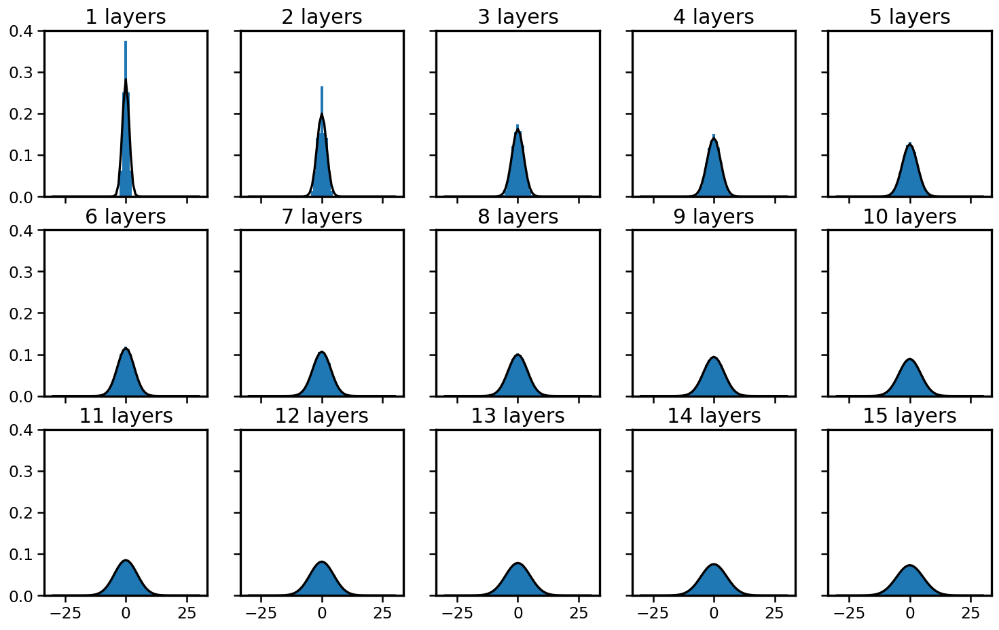

In [57]:
L = 30
x = np.arange(-L,L+1)
states_norm = np.sum(np.abs(states)**2,axis=2)

fig,axs = plt.subplots(3,5,figsize=(15,9), sharex=True, sharey=True)
for k,ax in enumerate(axs.flat):
    ax.bar(x,np.mean(states_norm[:,k,:],axis=0), color = 'C0',width =1.1)
    ax.plot(x,1/np.sqrt(4*(k+1)*np.pi)*np.exp(-x**2/(k+1)/4),'k')
    ax.set_title(f"{k+1} layers",fontsize = 18)
    ax.set_ylim([0,0.4])

# fig.savefig('layered_ansatzes.pdf')

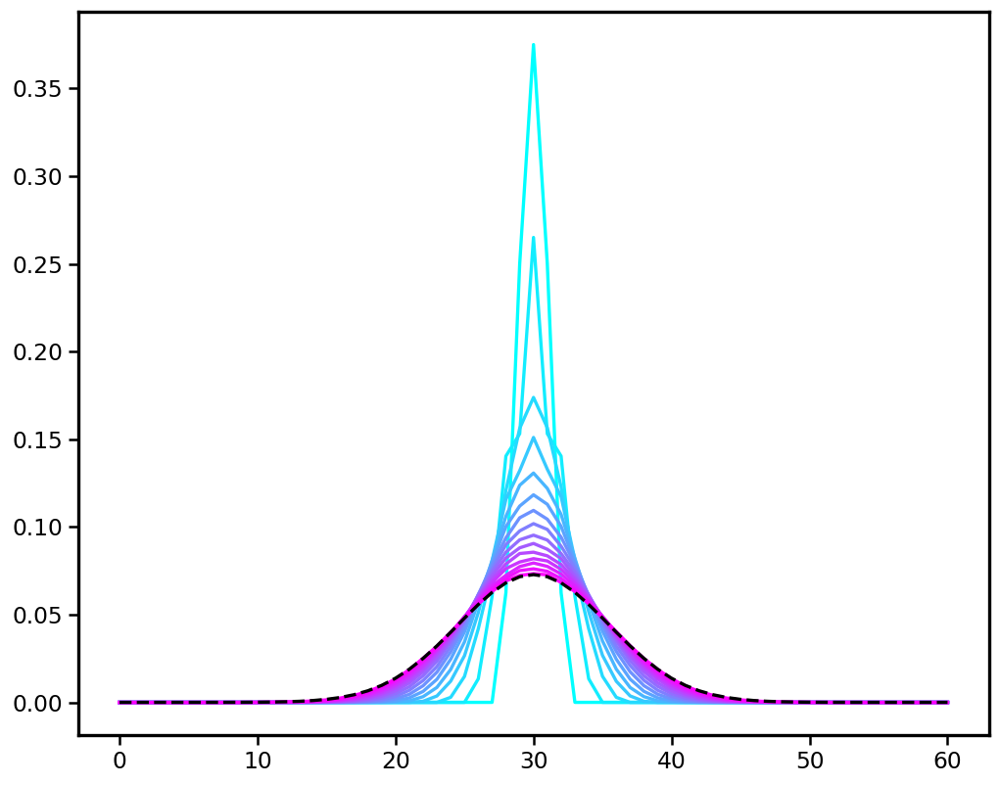

In [58]:
mean_ab = np.mean(np.abs(states_norm),axis=0)
mean_ab.shape
for k in range(15):
    plt.plot(mean_ab[k,:],c=cmap(k/14));
plt.plot(1/np.sqrt(4*(k+1)*np.pi)*np.exp(-x**2/(k+1)/4),'k--')

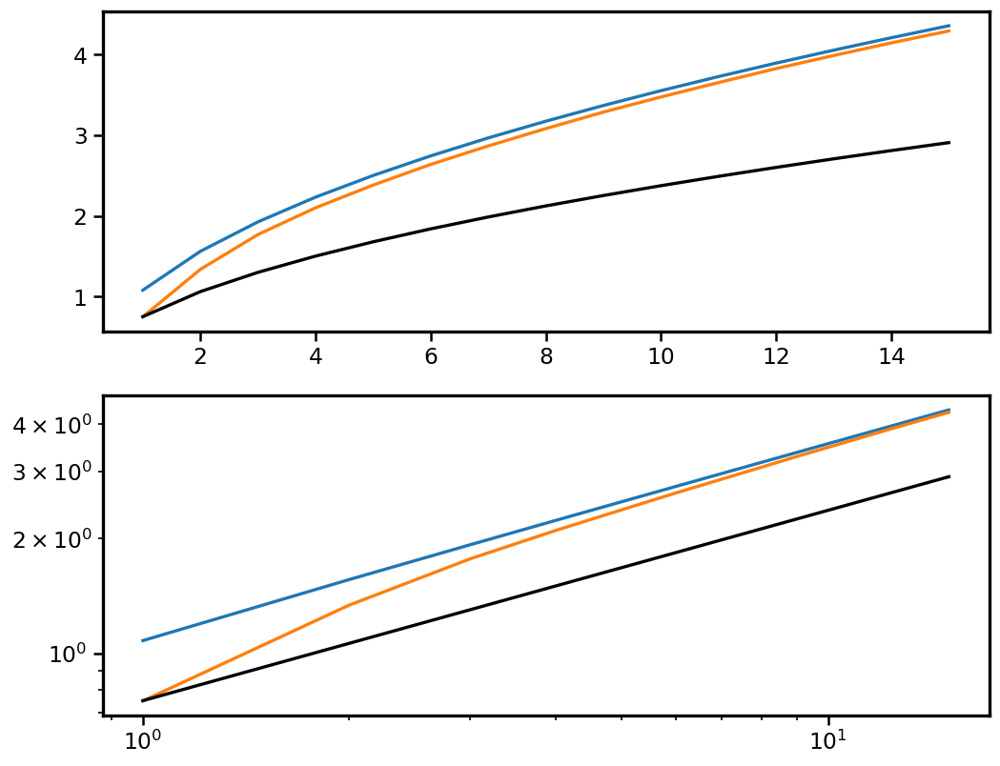

In [59]:
ma = []
mb = []
ks = np.arange(0,15)
x = np.arange(-30,31)

for k in ks:
    a = 1/np.sqrt(4*(k+1)*np.pi)*np.exp(-x**2/(k+1)/4)
    b = mean_ab[k,:]
    ma.append(np.sum(a*np.abs(x)))
    mb.append(np.sum(b*np.abs(x)))

plt.subplot(211)
plt.plot(ks+1,ma)
plt.plot(ks+1,mb)
plt.plot(ks+1,np.sqrt(ks+1)/np.pi**(1/4),'k')
# plt.plot(ks+1,np.sqrt(ks+1)*1.1,'k')

plt.subplot(212)
plt.loglog(ks+1,ma)
plt.loglog(ks+1,mb)
plt.loglog(ks+1,np.sqrt(ks+1)/np.pi**(1/4),'k')
# plt.loglog(ks+1,np.sqrt(ks+1)*1.1,'k')

In [60]:
obs = jit(lambda states : measurement(states,A),device=dev)(states[:2500,:,:,:])

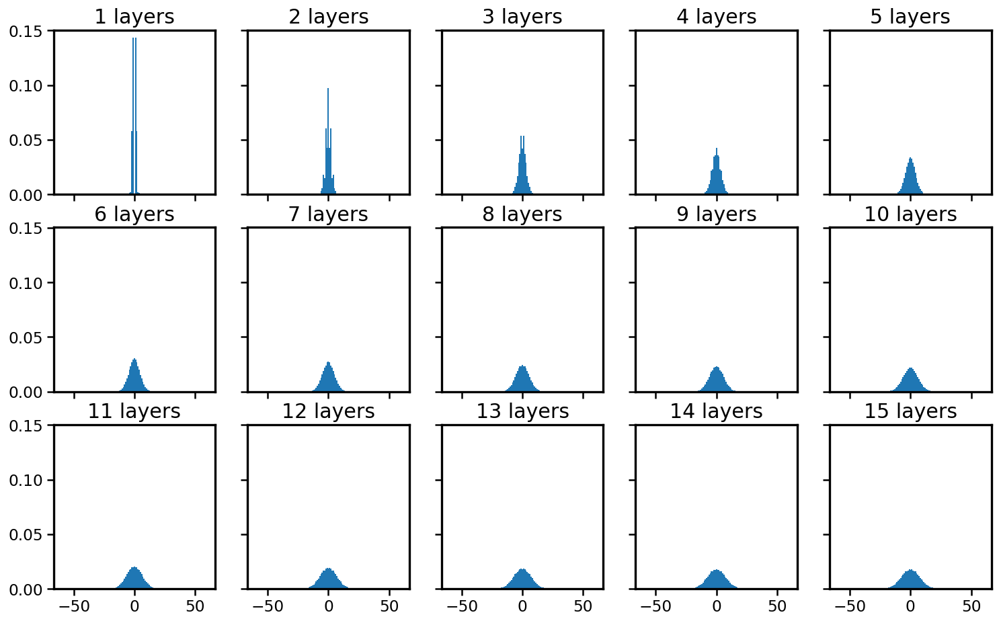

In [61]:
L = 60
x = np.arange(-L,L+1)
obs_norm = np.abs(obs)**2

fig,axs = plt.subplots(3,5,figsize=(15,9), sharex=True, sharey=True)
for k,ax in enumerate(axs.flat):
    ax.bar(x,np.mean(obs_norm[:,k,:],axis=0), color = 'C0',width =1.1)
    ax.set_title(f"{k+1} layers",fontsize = 18)
    # ax.set_ylim([0,0.6])

# fig.savefig('layered_ansatzes.pdf')

### Check output function in the $\cos(x\pi)$ and $\sin(x\pi)$ basis

In [62]:
one,cos,sin = trig_to_sc(obs)

In [63]:
ocs = np.concatenate([one,cos,sin],axis=2)

In [71]:
print(f"The output functions as cos sin decomposition represented by {ocs.shape[2]} coefficient at the end of each of the {ocs.shape[1]} layers was sampled for {ocs.shape[0]} instances of the circuit parameters")

The output functions as cos sin decomposition represented by 121 coefficient at the end of each of the 15 layers was sampled for 2500 instances of the circuit parameters


In [66]:
ocs_avg = np.mean(np.abs(ocs),axis=0)
ocs_std = np.std(ocs,axis=0)

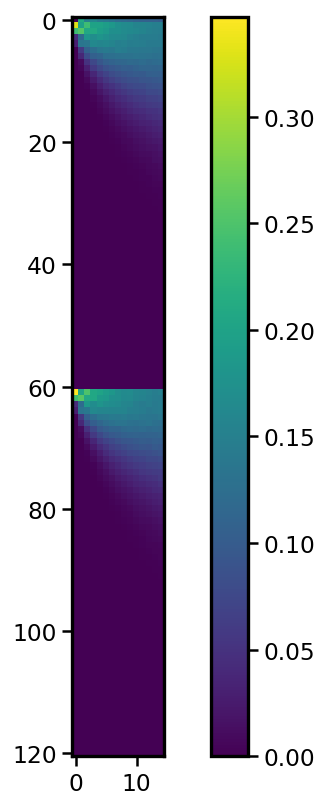

In [67]:
plt.imshow(ocs_avg.T)
plt.colorbar()

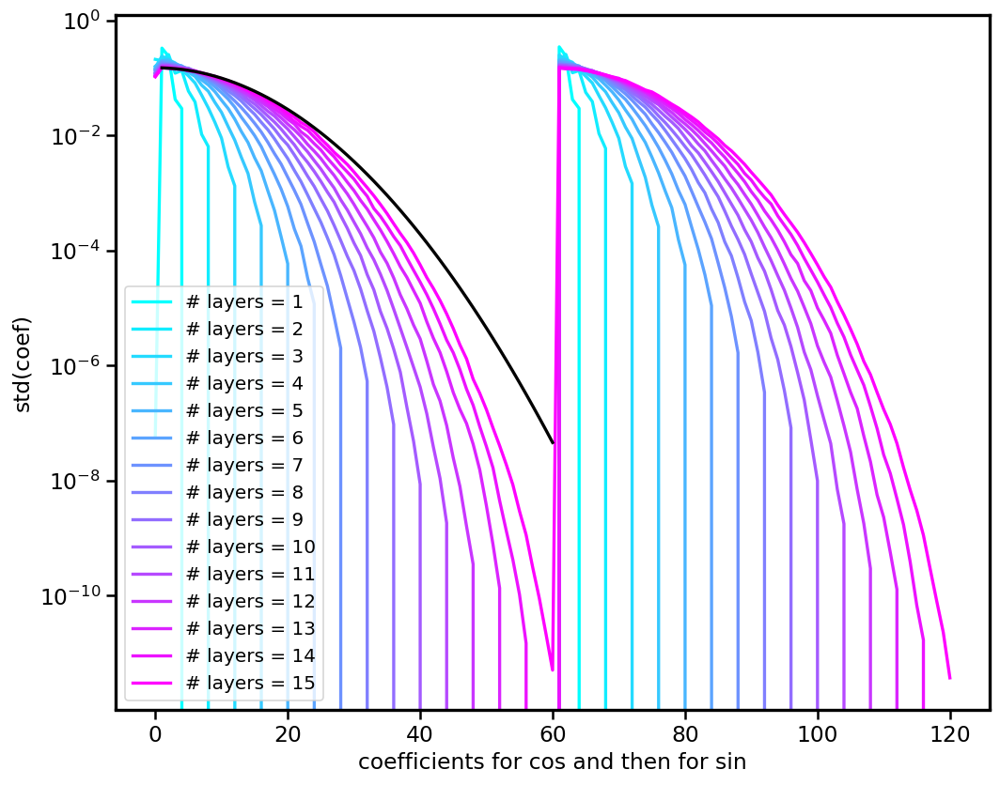

In [84]:
for k in range(numlayers):
    plt.semilogy(ocs_avg[k,:].T,c=cmap(k/(numlayers-1)),label=f"# layers = {k+1}")
scale = 16
# plt.semilogy(np.arange(1,61),1/np.sqrt(scale*(k+1)*np.pi)*np.exp(-np.arange(1,61)**2/(k+1)/scale),'k')
plt.semilogy(np.arange(1,61),ocs_avg[-1,1]*np.exp(-np.arange(1,61)**2/(k+1)/scale),'k')

# plt.plot([0,out_fun.shape[2]],[1,1],'k')
plt.xlabel('coefficients for cos and then for sin')
plt.ylabel('std(coef)')
plt.legend()

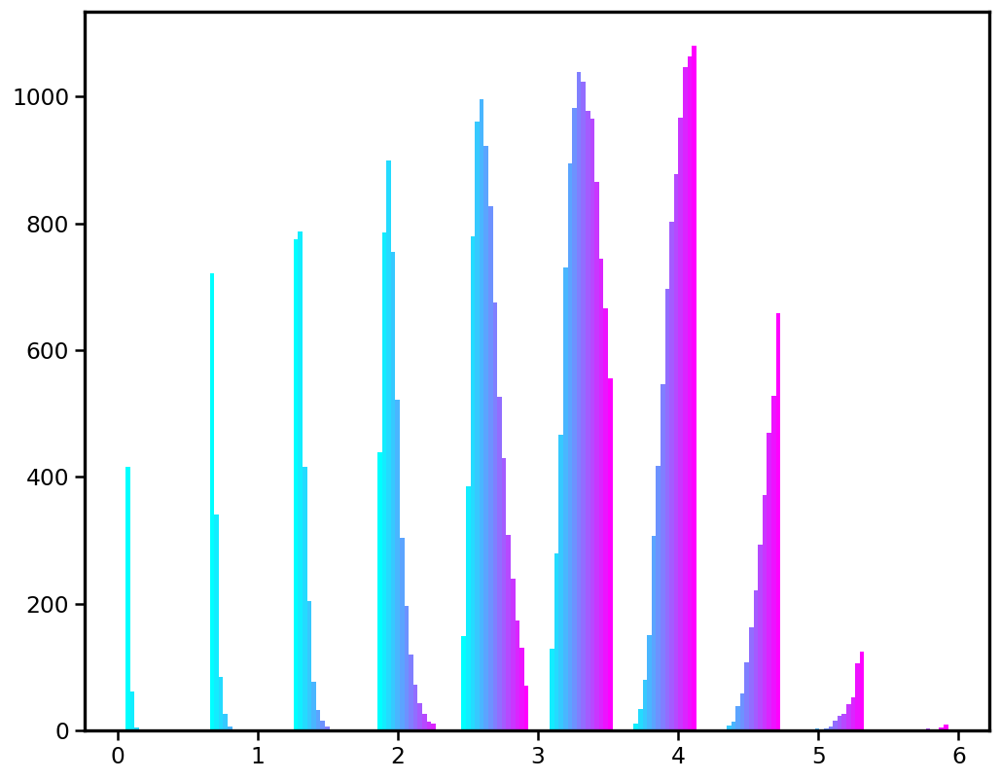

In [95]:
plt.hist(np.sum(np.abs(ocs),axis=2),color=cmap(np.linspace(0,1,15)));

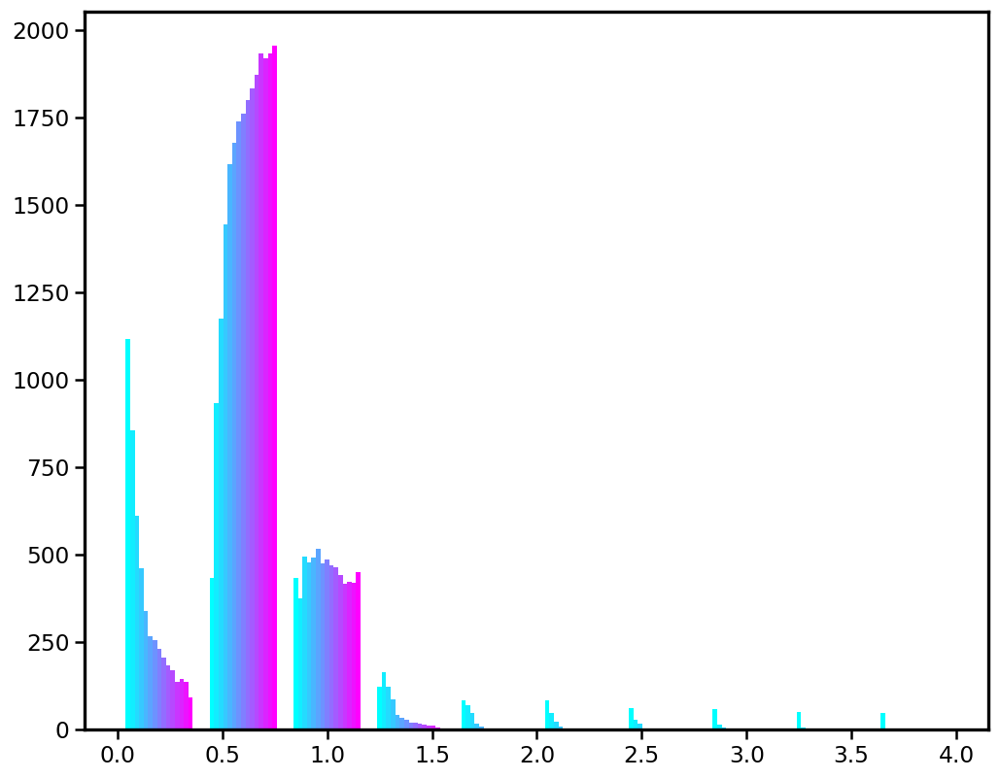

In [96]:
plt.hist(np.sum(np.abs(ocs)**2,axis=2),color=cmap(np.linspace(0,1,15)));

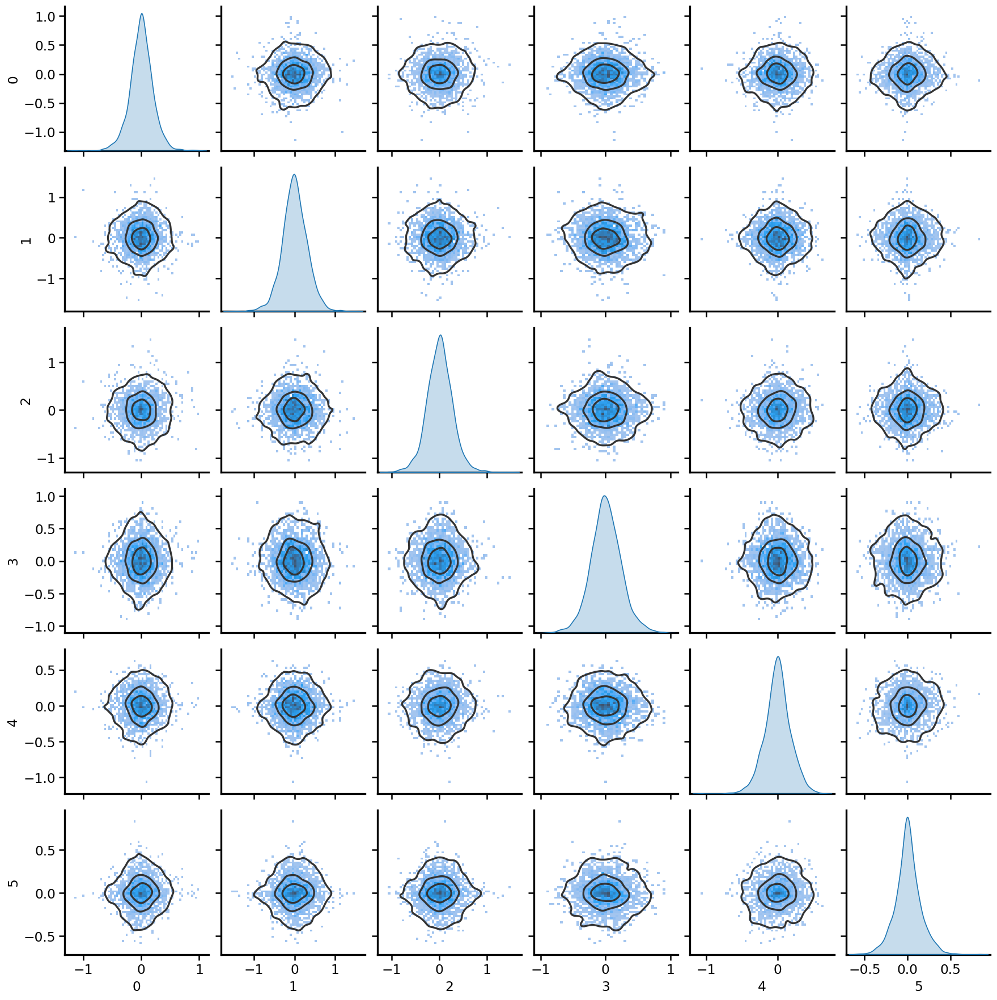

In [98]:
inds = [0,1,2,3,4,5]
data = ocs[:,2,inds].squeeze()
df = pd.DataFrame(data)
g = sns.pairplot(df, diag_kind="kde", kind="hist")
g.map_offdiag(sns.kdeplot, levels=4, color=".2")

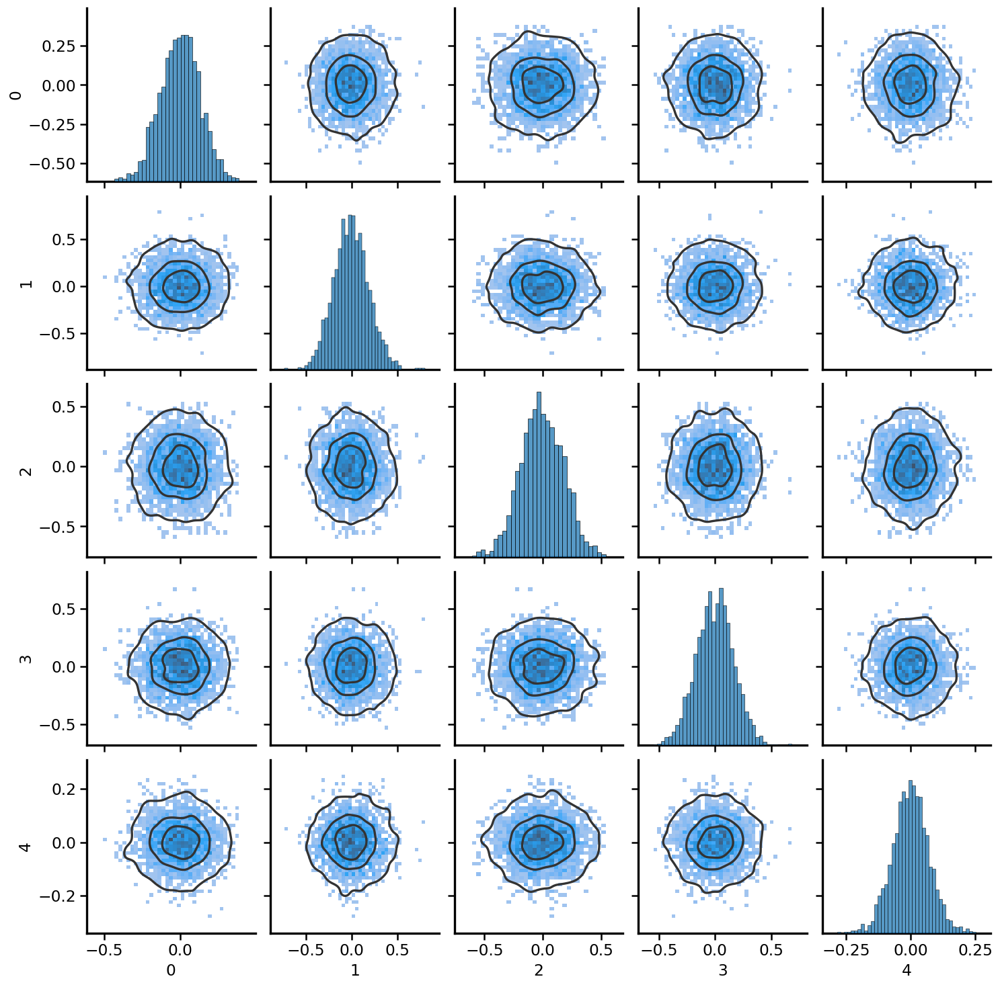

In [100]:
# inds = [0,1,2,5,15,30]
inds = [0,1,2,5,15]
data = ocs[:,-1,inds].squeeze()
df = pd.DataFrame(data)
g = sns.pairplot(df, kind="hist")
g.map_offdiag(sns.kdeplot, levels=4, color=".2")
# g = sns.pairplot(df, kind="hist", plot_kws = {"binwidth" : (0.01, 0.01)})

### Lipschitz

In [113]:
xs = np.linspace(0,np.pi*2,103)
dx = xs[1]-xs[0] 
lips = []
for k in range(ocs.shape[1]):
    a = eval_several_scpoly(ocs[:,k,:].T,xs)
    deriv = np.abs(a[:,1:]-a[:,:-1])/dx
    lips.append(np.max(deriv,axis=1))
lips = np.array(lips)
lips.shape

(15, 2500)

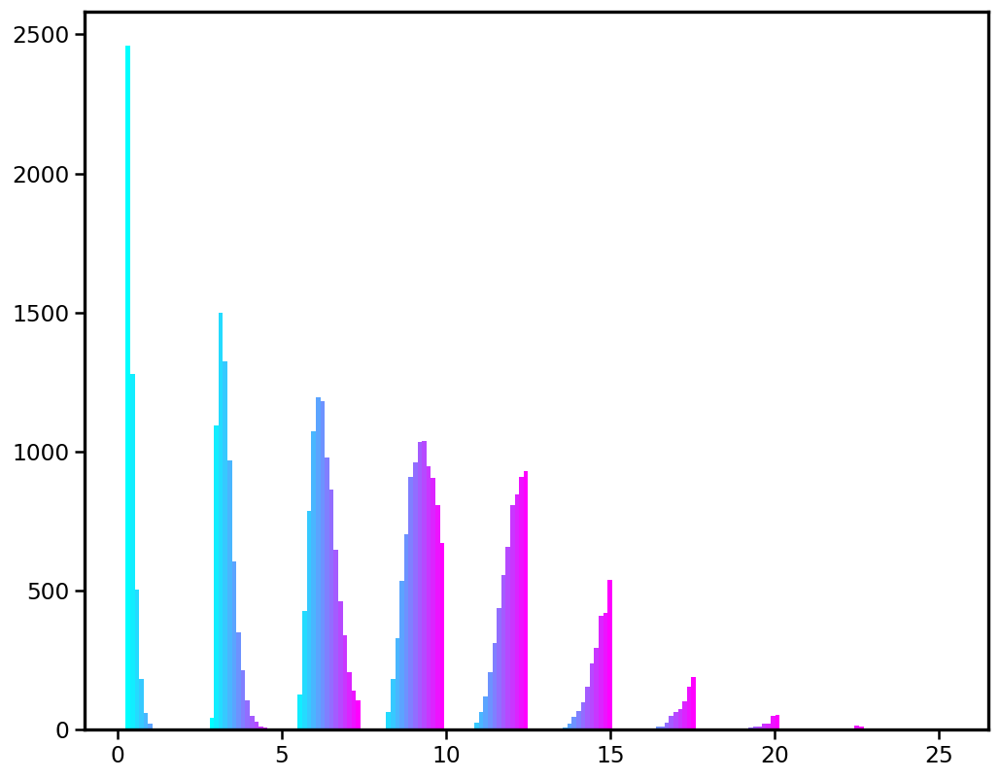

In [115]:
plt.hist(lips.T,color=cmap(np.linspace(0,1,15)));

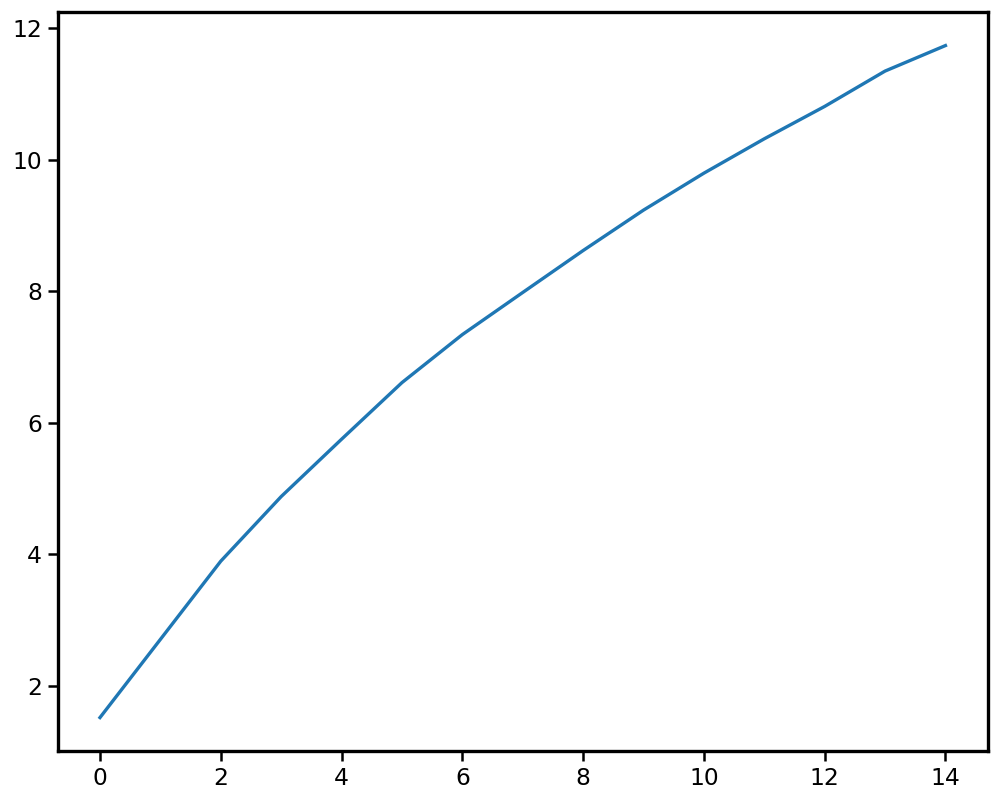

In [118]:
plt.plot(np.mean(lips,axis=1))

In [123]:
Ls = np.concatenate([np.arange(0,61),np.arange(1,61)])
fu = np.sum(np.abs(ocs) * np.expand_dims(Ls,axis=(0,1)),axis=2)
fu.shape
# ocs

(2500, 15)

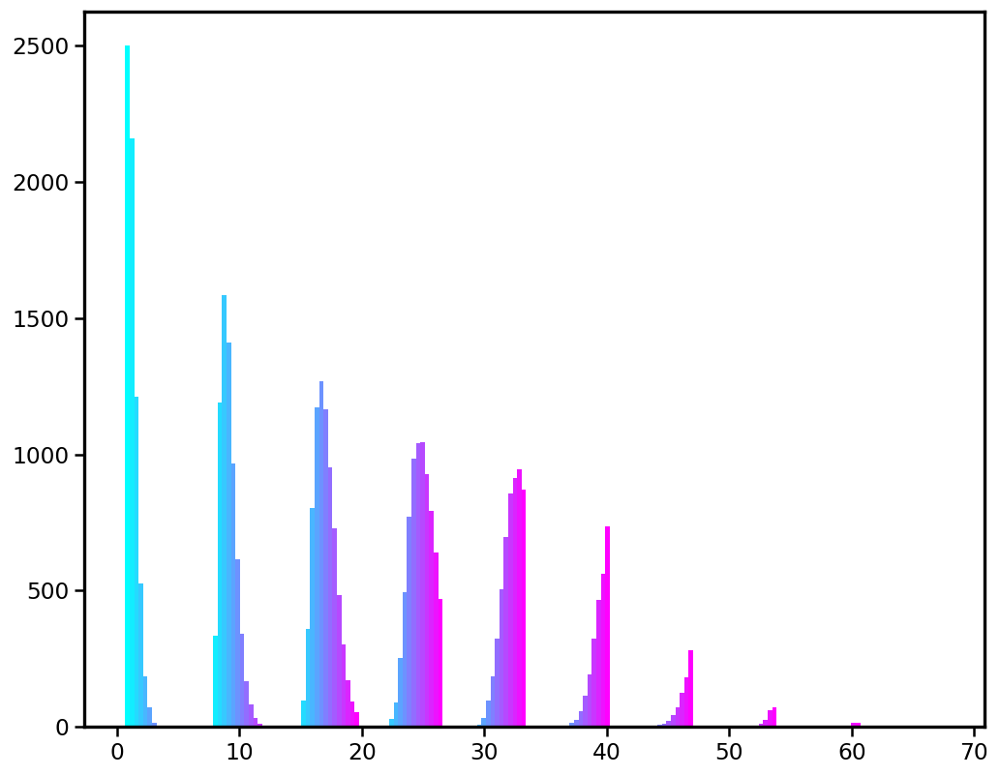

In [127]:
plt.hist(fu,color=cmap(np.linspace(0,1,15)));

In [129]:
v = fu - lips.T
np.sum(v<0)

0

1.2578800019073322
0.14532479145994115
0.9901675649567346


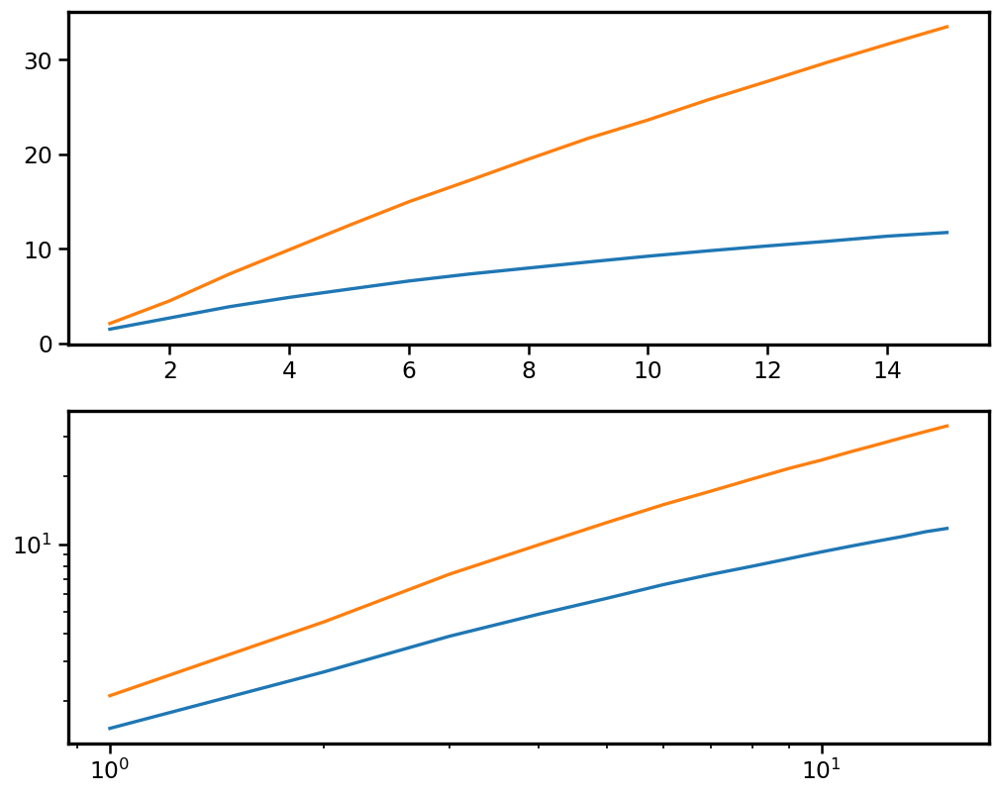

In [132]:
ma = np.mean(lips,axis=1)
mb = np.mean(fu,axis=0)
ks = np.arange(0,15)+1

plt.subplot(211)
plt.plot(ks,ma)
plt.plot(ks,mb)
# plt.plot(ks+1,np.sqrt(ks+1)/np.pi**(1/4),'k')
# plt.plot(ks+1,np.sqrt(ks+1)*1.1,'k')

plt.subplot(212)
plt.loglog(ks,ma)
plt.loglog(ks,mb)
# plt.loglog(ks+1,np.sqrt(ks+1)/np.pi**(1/4),'k')
# plt.loglog(ks+1,np.sqrt(ks+1)*1.1,'k')

x = np.log(ks+1)
y = np.log(np.array(mb))

slope, intercept, r, p, se = scipy.stats.linregress(x,y)
print(slope)
print(intercept)
print(r)

## Experiment 2 old
* A = XIII + IXII + IIXI + IIIXX
* B1 = YIII + IYII + IIYI + IIIY
* B2 = XIII + IXII + IIXI + IIIXX
* B3 = ZZII + IZZI + IIZZ + ZIIZ + ZIZI + IZIZ
* M = A

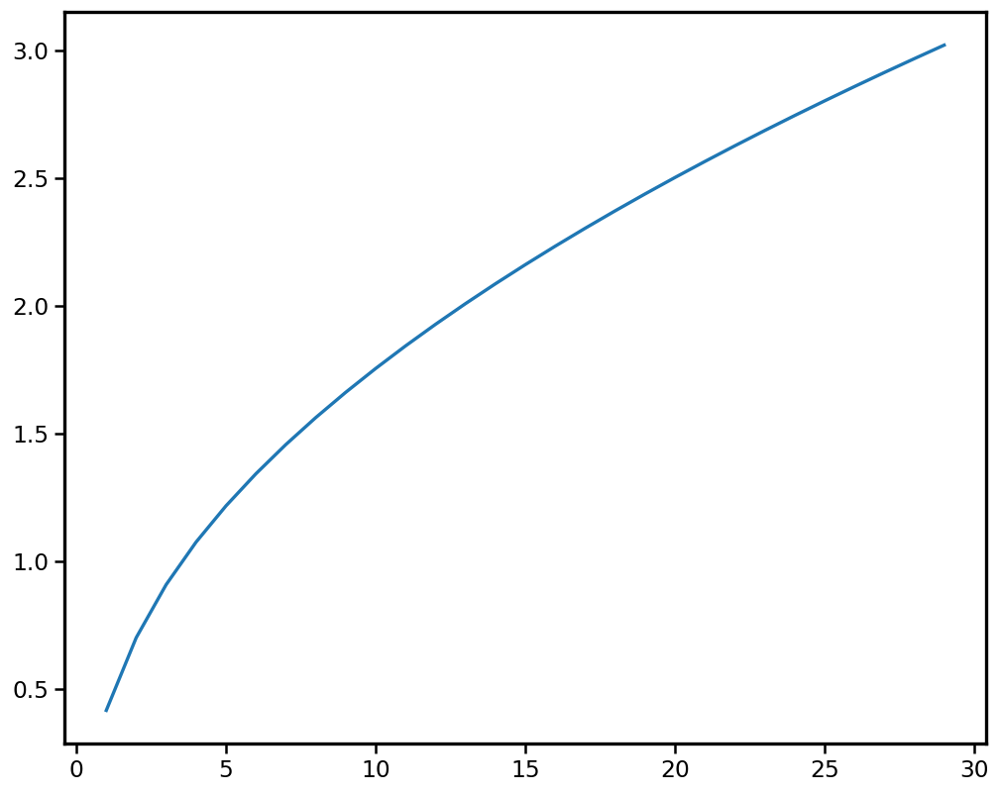

In [153]:
m = []
Ls = np.arange(1,30)
for L in Ls:
    x = np.arange(-L,L+1)
    a = 1/np.sqrt(np.pi*L)*np.exp(-x**2/L)
    # print(np.sum(a))
    m.append(np.sum(a*np.abs(np.arange(-L,L+1))))
plt.plot(Ls,m)
# plt.loglog(Ls,m)

0.9905712811964557
[[0.61567856]]
[-0.1670216]


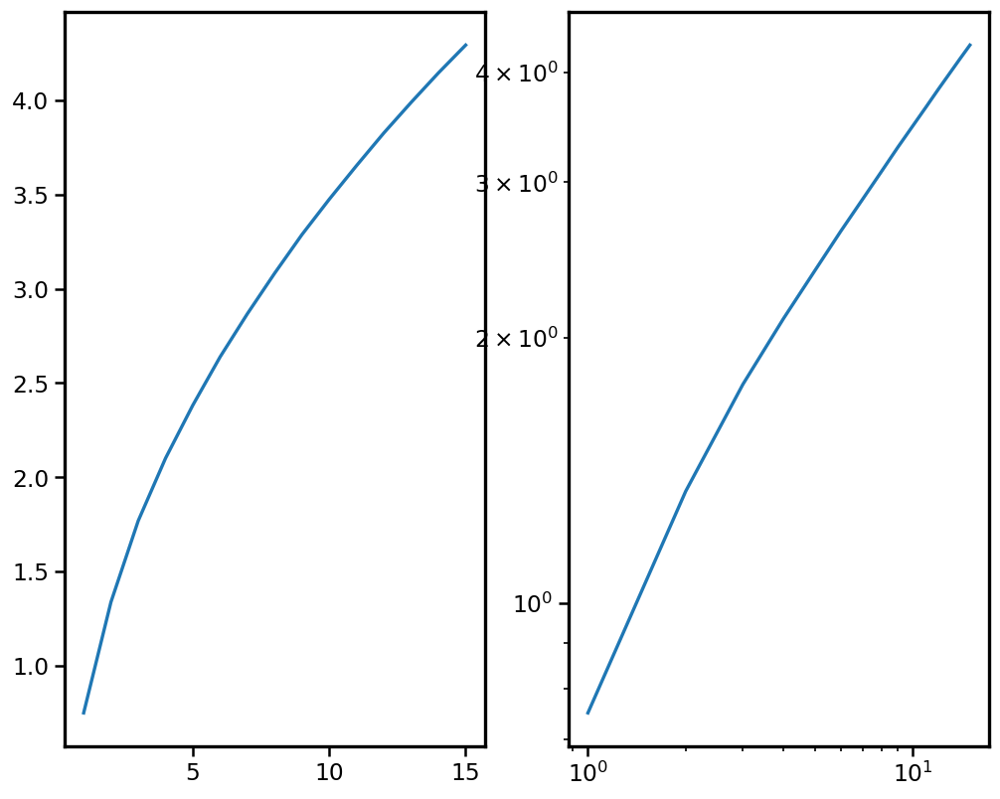

In [154]:
m = []
for k in range(15):
    a = mean_ab[k,:]
    m.append(np.sum(a*np.abs(np.arange(-30,31))))

plt.subplot(121)
plt.plot(np.arange(1,16),m)
plt.subplot(122)
plt.loglog(np.arange(1,16),m)


x = np.log(np.arange(1,16)).reshape(-1, 1)
y = np.log(m).reshape(-1, 1)
reg = LinearRegression().fit(x, y)

print(reg.score(x, y))
print(reg.coef_)
print(reg.intercept_)
# plt.loglog(Ls,m)

### Check output function in the $\cos(x\pi)$ and $\sin(x\pi)$ basis

In [110]:
def fun(thes):
    states =  thes_state(A,Bs,numlayers,thes)
    ms = measurement(states,M)
    return ms

fun_jnp = jit(vmap(fun),device=dev)

In [111]:
out_fun = fun_jnp(thes)
print(f"The output functions as cos sin decomposition represented by {out_fun.shape[2]} coefficient at the end of each of the {out_fun.shape[1]} layers was sampled for {out_fun.shape[0]} instances of the circuit parameters")

The output functions as cos sin decomposition represented by 61 coefficient at the end of each of the 15 layers was sampled for 10000 instances of the circuit parameters


In [146]:
mean_ab = np.mean(np.abs(out_fun),axis=0)
mean_sq = np.sqrt(np.mean(out_fun**2,axis=0))
std_abs = np.std(out_fun,axis=0)
max_abs = np.max(out_fun,axis=0)

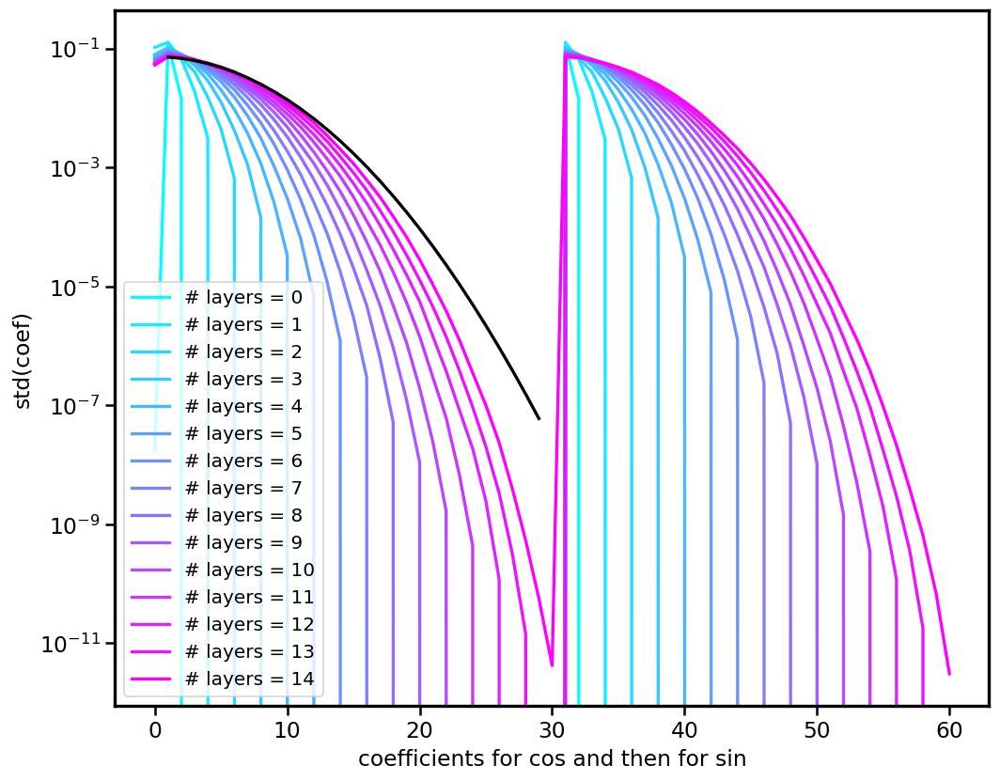

In [144]:
for k in range(numlayers):
    plt.semilogy(mean_ab[k,:].T,c=cmap(k/(numlayers-1)),label=f"# layers = {k}")
x = np.arange(1,30)
plt.plot(x,1/np.sqrt(4*(k+1)*np.pi)*np.exp(-x**2/(k+1)/4),'k')
plt.xlabel('coefficients for cos and then for sin')
plt.ylabel('std(coef)')
plt.legend()

0.9979839471260502
[[0.96388084]]
[-1.83327407]


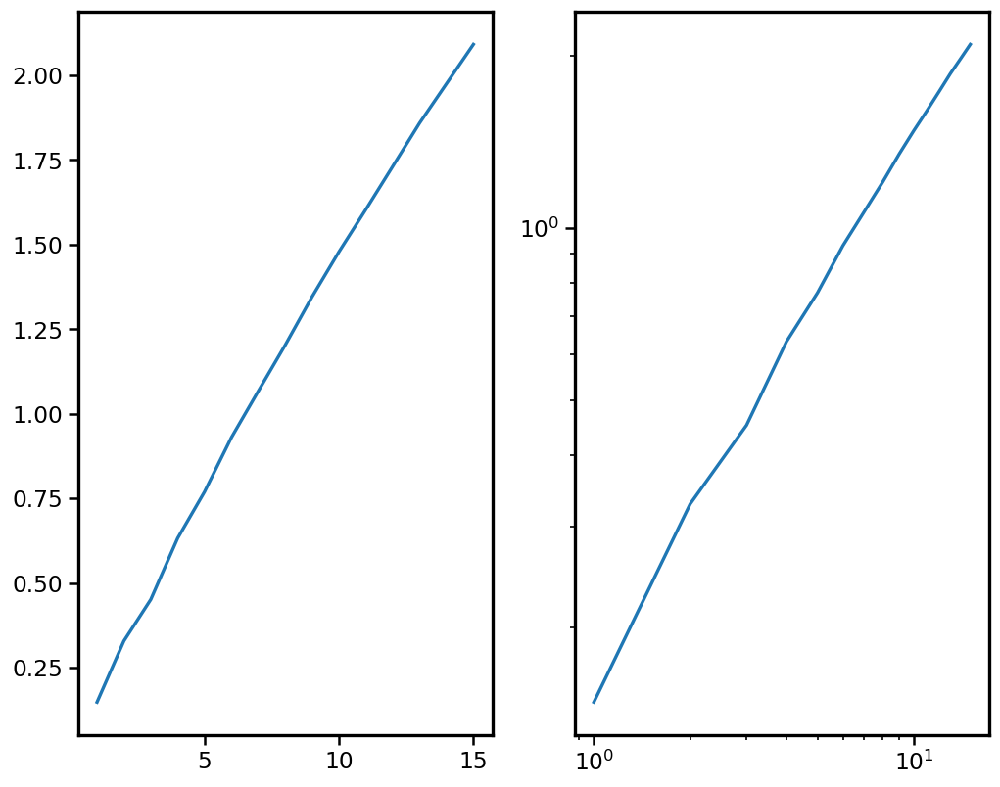

In [154]:
m = []
for k in range(15):
    a = mean_ab[k,:31]
    m.append(np.sum(a*np.arange(31)))

plt.subplot(121)
plt.plot(np.arange(1,16),m)
plt.subplot(122)
plt.loglog(np.arange(1,16),m)


x = np.log(np.arange(1,16)).reshape(-1, 1)
y = np.log(m).reshape(-1, 1)
reg = LinearRegression().fit(x, y)

print(reg.score(x, y))
print(reg.coef_)
print(reg.intercept_)
# plt.loglog(Ls,m)

In [ ]:
m = []
for k in range(15):
    a = mean_ab[k,:31]
    m.append(np.sum(a*np.arange(31)))

plt.subplot(121)
plt.plot(np.arange(1,16),m)
plt.subplot(122)
plt.loglog(np.arange(1,16),m)


x = np.log(np.arange(1,16)).reshape(-1, 1)
y = np.log(m).reshape(-1, 1)
reg = LinearRegression().fit(x, y)

print(reg.score(x, y))
print(reg.coef_)
print(reg.intercept_)
# plt.loglog(Ls,m)

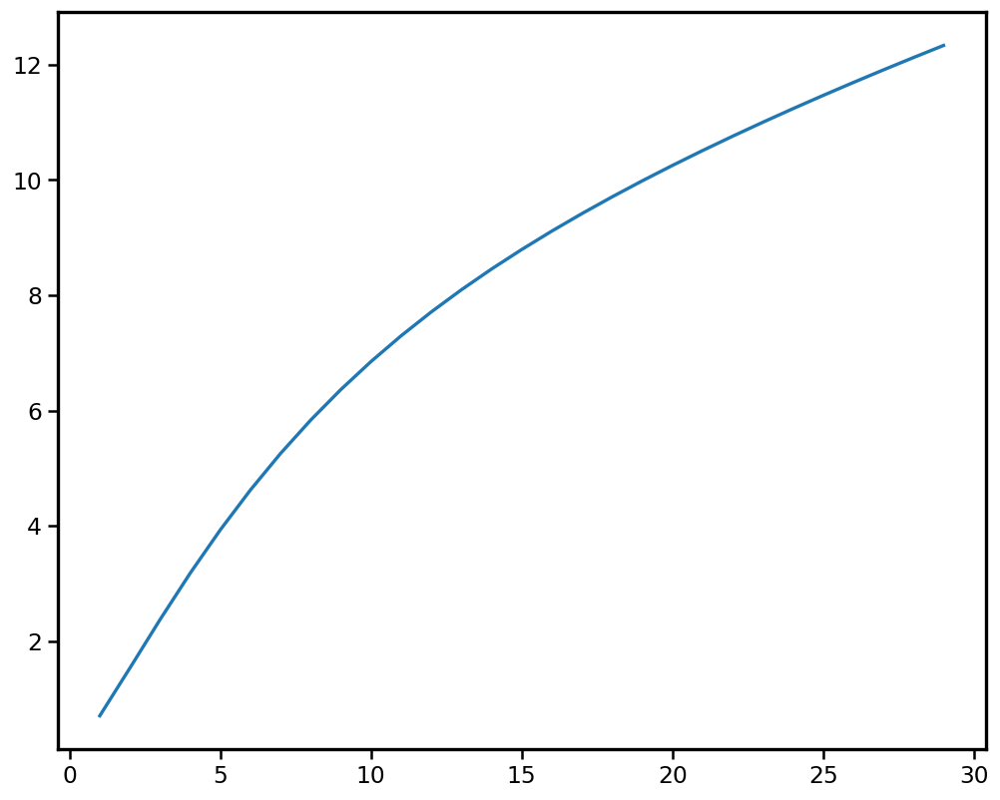

In [142]:
m = []
Ls = np.arange(1,30)
for L in Ls:
    x = np.arange(-L,L+1)
    a = 1/np.sqrt((L+1)*np.pi)*np.exp(-x**2/(L+1)/4)
    # print(np.sum(a))
    m.append(np.sum(a*np.abs(np.arange(-L,L+1))))
plt.plot(Ls,m)
# plt.loglog(Ls,m)

0.9979353419810181
[[0.96407846]]
[-1.8337451]


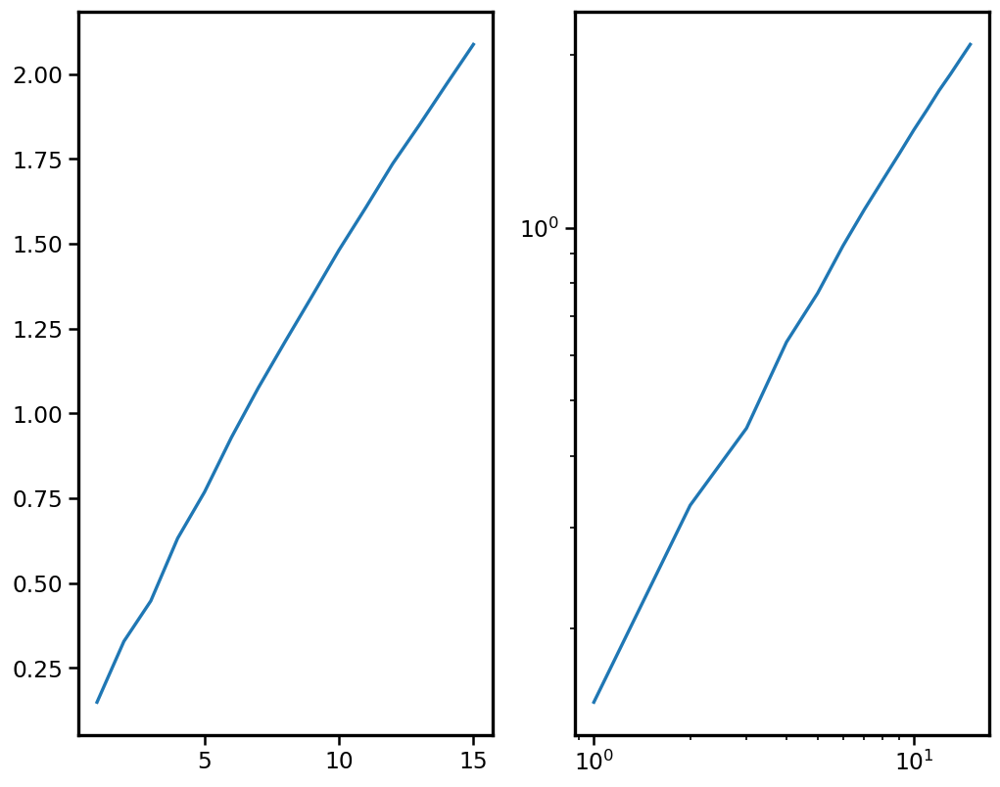

In [132]:
lip = np.sum(np.mean(np.abs(out_fun[:,:,31:]),axis=0) * np.expand_dims(np.arange(1,31),axis=(0)),axis=1)
plt.subplot(121)
plt.plot(np.arange(1,16),lip)
plt.subplot(122)
plt.loglog(np.arange(1,16),lip)

x = np.log(np.arange(1,16)).reshape(-1, 1)
y = np.log(lip).reshape(-1, 1)
reg = LinearRegression().fit(x, y)

print(reg.score(x, y))
print(reg.coef_)
print(reg.intercept_)
# print(np.log(lip_mean)/np.log(2*np.arange(1,16)))

0.9979355007391784
[[0.96407829]]
[-1.8337446]


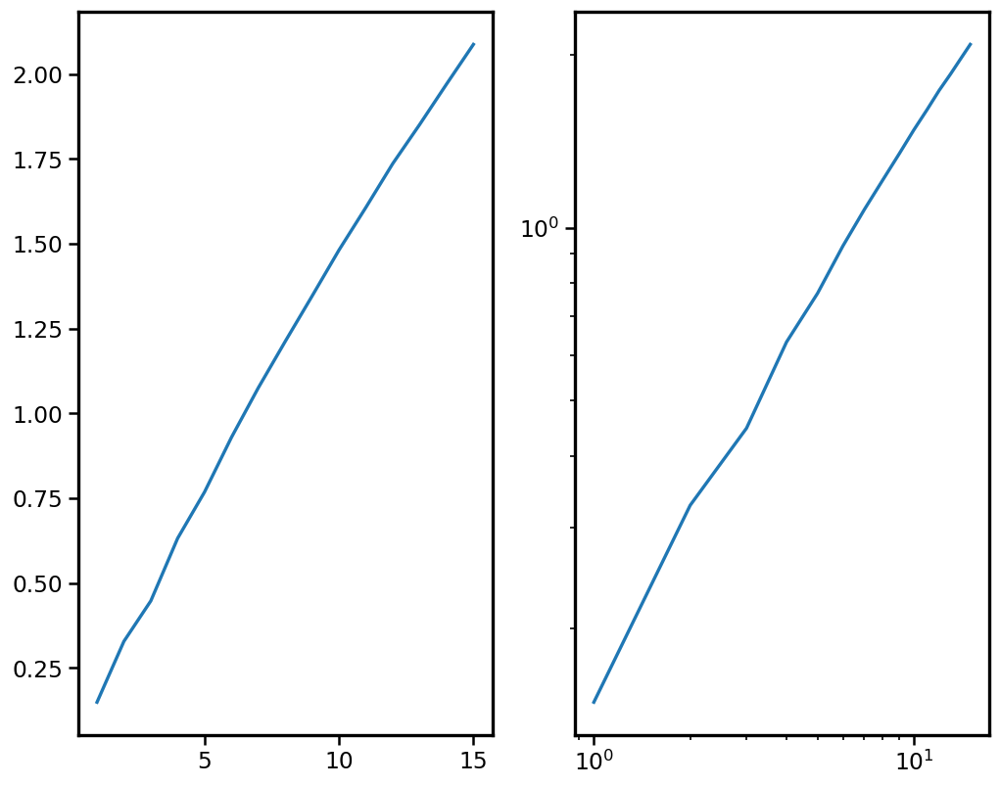

In [117]:
lip = np.sum(np.abs(out_fun[:,:,31:] * np.expand_dims(np.arange(1,31),axis=(0,1))),axis=(2))
lip_mean = np.mean(lip,axis=0)
plt.subplot(121)
plt.plot(np.arange(1,16),lip_mean)
plt.subplot(122)
plt.loglog(np.arange(1,16),lip_mean)

x = np.log(np.arange(1,16)).reshape(-1, 1)
y = np.log(lip_mean).reshape(-1, 1)
reg = LinearRegression().fit(x, y)

print(reg.score(x, y))
print(reg.coef_)
print(reg.intercept_)
# print(np.log(lip_mean)/np.log(2*np.arange(1,16)))

In [114]:
# for k in range(numlayers):
#     plt.semilogy(mean_ab[k,:].T,c=cmap(k/(numlayers-1)))
# x = np.arange(1,30)
# plt.plot(x,1/np.sqrt(4*(k+1)*np.pi)*np.exp(-x**2/(k+1)/4),'k')
# # plt.plot([0,out_fun.shape[2]],[1,1],'k')
# plt.xlabel('coefficients for cos and then for sin')
# plt.ylabel('std(coef)')

In [115]:
# for k in range(numlayers):
#     plt.semilogy(mean_sq[k,:].T,c=cmap(k/(numlayers-1)))
# x = np.arange(1,30)
# plt.plot(x,1/np.sqrt(4*(k+1)*np.pi)*np.exp(-x**2/(k+1)/4),'k')
# # plt.plot([0,out_fun.shape[2]],[1,1],'k')
# plt.xlabel('coefficients for cos and then for sin')
# plt.ylabel('std(coef)')

In [116]:
# for k in range(numlayers):
#     plt.semilogy(std_abs[k,:].T,c=cmap(k/(numlayers-1)))
# x = np.arange(1,30)
# plt.plot(x,1/np.sqrt(4*(k+1)*np.pi)*np.exp(-x**2/(k+1)/4),'k')
# # plt.plot([0,out_fun.shape[2]],[1,1],'k')
# plt.plot([0,30],[1,1],'k')
# plt.xlabel('coefficients for cos and then for sin')
# plt.ylabel('std(coef)')

In [123]:
# inds = list(range(0,5))
inds = [0,1,2,4,9,11]
# data = out_fun[:,10,inds].squeeze()
data = out_fun[:,-1,inds].squeeze()
scale = np.max(data,axis=0)
# data = data/scale
df = pd.DataFrame(data)
g = sns.pairplot(df, diag_kind="kde", kind="hist")
g.map_lower(sns.kdeplot, levels=4, color=".2")
g.map_upper(sns.kdeplot, levels=4, color=".2")
# g = sns.pairplot(df,plot_kws={'alpha':0.1}, diag_kind="kde")
# g.sns.(kdeplot, levels=4, color=".2")
# g.axes[0,2].set_xlim((0,40))
# g.axes[1,2].set_xlim((-20,20))

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7ff608193d30> (for post_execute):



KeyboardInterrupt



## Experiment 3
* A = XIII + IXII + IIXI + IIIX
* Bs : Haar random integer spectrum
* M = A

### Experiment definition

In [133]:
I,X,Y,Z = Paulis()
A = (np.kron(np.kron(np.kron(X,I),I),I) + np.kron(np.kron(np.kron(I,X),I),I) + np.kron(np.kron(np.kron(I,I),X),I) + np.kron(np.kron(np.kron(I,I),I),X))/2
Bs = []
for k in range(5):
    U = unitary_group.rvs(16,random_state=k)
    D = np.diag([-1]*8 + [1]*8)
    B = U @ D @ U.T.conj()
    Bs.append(B)

M = A/2
N = A.shape[0]

numlayers = 15
numthes=10000
np.random.seed(0)
thes = (np.random.rand(numthes,numlayers*len(Bs))-0.5)*np.pi

### Check State Amplitude in the $e^{ix\pi}$ basis

In [134]:
fun_states = jit(vmap(lambda thes : thes_state(A,Bs,numlayers,thes)),device=dev)

In [135]:
states = fun_states(thes)
print(f"The {states.shape[2]} complex amplitudes of the state vector for the {states.shape[3]} frequencies at the end of each of the {states.shape[1]} layers was sampled for {states.shape[0]} instances of the circuit parameters")

The 16 complex amplitudes of the state vector for the 61 frequencies at the end of each of the 15 layers was sampled for 10000 instances of the circuit parameters


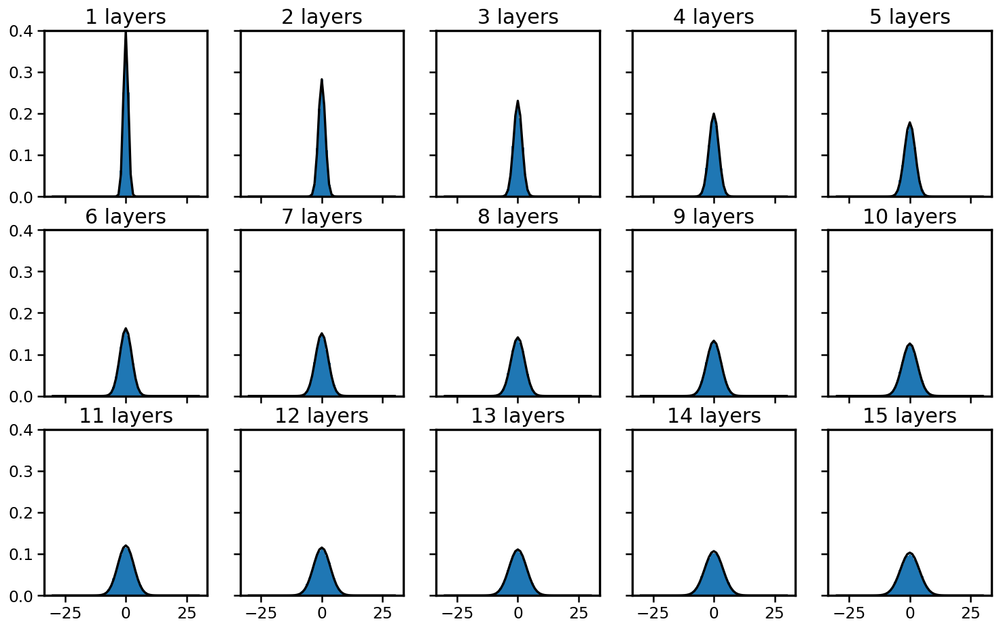

In [137]:
L = 30
x = np.arange(-L,L+1)
states_norm = np.sum(np.abs(states)**2,axis=2)

fig,axs = plt.subplots(3,5,figsize=(15,9), sharex=True, sharey=True)
for k,ax in enumerate(axs.flat):
    ax.bar(x,np.mean(states_norm[:,k,:],axis=0), color = 'C0',width =1.1)
    ax.plot(x,1/np.sqrt(2*(k+1)*np.pi)*np.exp(-x**2/(k+1)/2),'k')
    ax.set_title(f"{k+1} layers",fontsize = 18)
    ax.set_ylim([0,0.4])

# fig.savefig('layered_ansatzes.pdf')

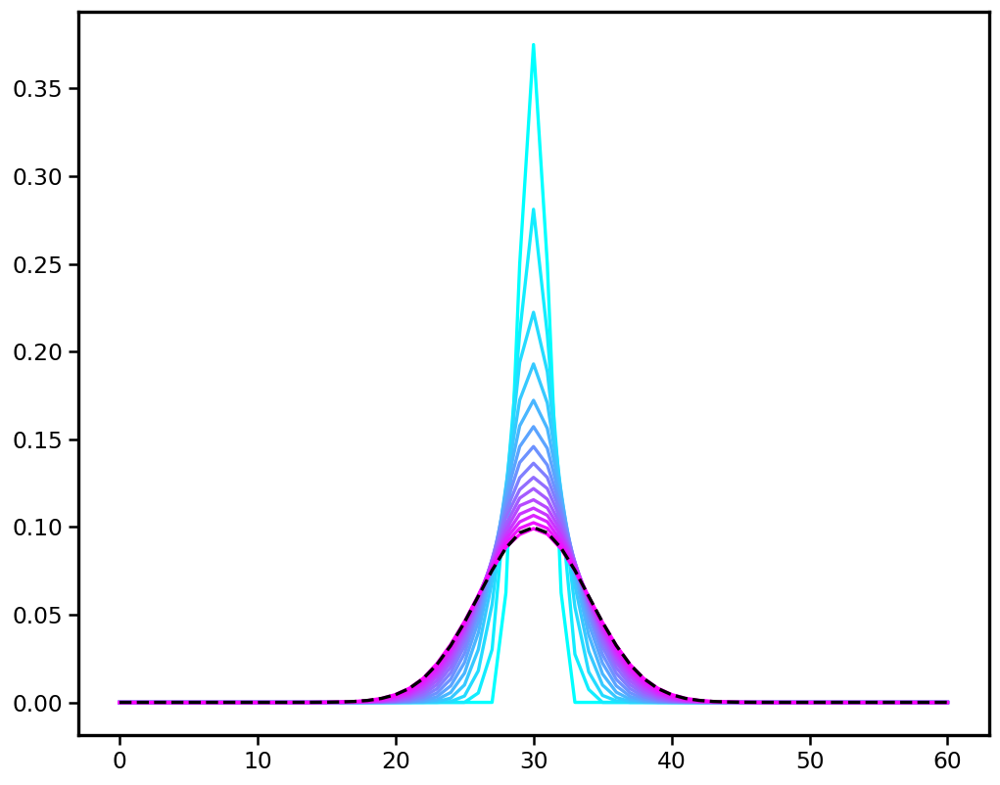

In [140]:
mean_ab = np.mean(np.abs(states_norm),axis=0)
mean_ab.shape
for k in range(15):
    plt.plot(mean_ab[k,:],c=cmap(k/14));
plt.plot(1/np.sqrt(2*(k+2)*np.pi)*np.exp(-x**2/(k+2)/2),'k--')

0.16443123620063235
0.8829385549216415
0.9860778495865441


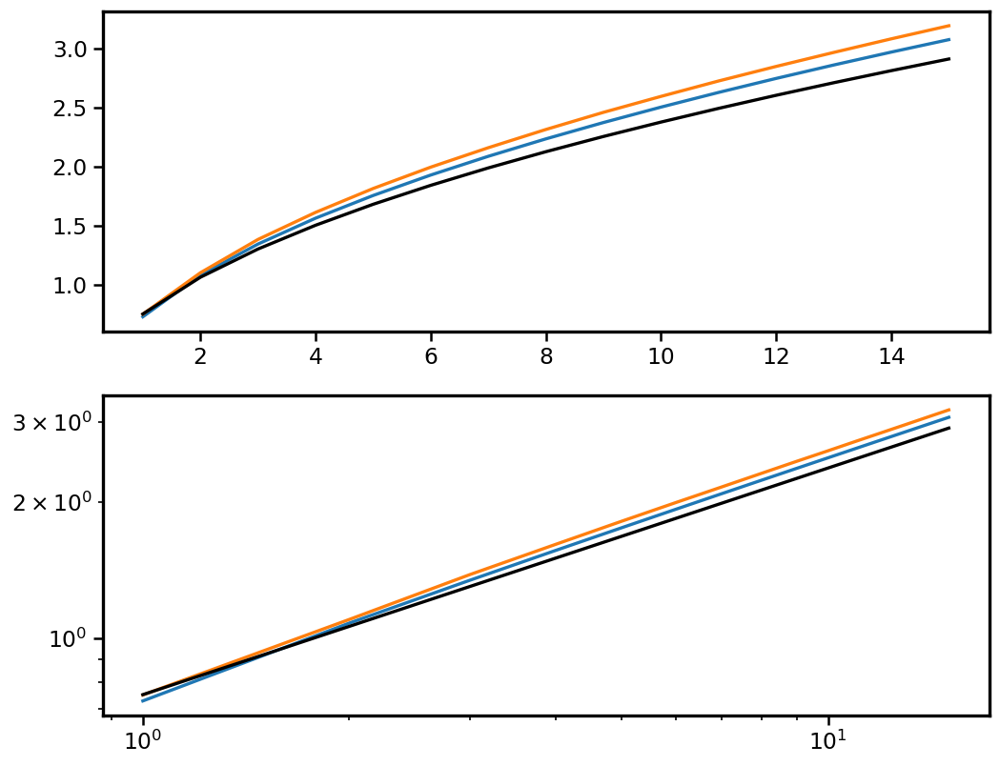

In [163]:
ma = []
mb = []
ks = np.arange(0,15)
x = np.arange(-30,31)

for k in ks:
    a = 1/np.sqrt(2*(k+1)*np.pi)*np.exp(-x**2/(k+1)/2)
    b = mean_ab[k,:]
    ma.append(np.sum(a*np.abs(x)))
    mb.append(np.sum(b*np.abs(x)))

plt.subplot(211)
plt.plot(ks+1,ma)
plt.plot(ks+1,mb)
plt.plot(ks+1,np.sqrt(ks+1)/np.pi**(1/4),'k')
# plt.plot(ks+1,np.sqrt(ks+1)*1.1,'k')

plt.subplot(212)
plt.loglog(ks+1,ma)
plt.loglog(ks+1,mb)
plt.loglog(ks+1,np.sqrt(ks+1)/np.pi**(1/4),'k')
# plt.loglog(ks+1,np.sqrt(ks+1)*1.1,'k')

x = ks+1 
y = mb

slope, intercept, r, p, se = scipy.stats.linregress(x,y)
print(slope)
print(intercept)
print(r)

In [143]:
obs = jit(lambda states : measurement(states,A),device=dev)(states[:2500,:,:,:])

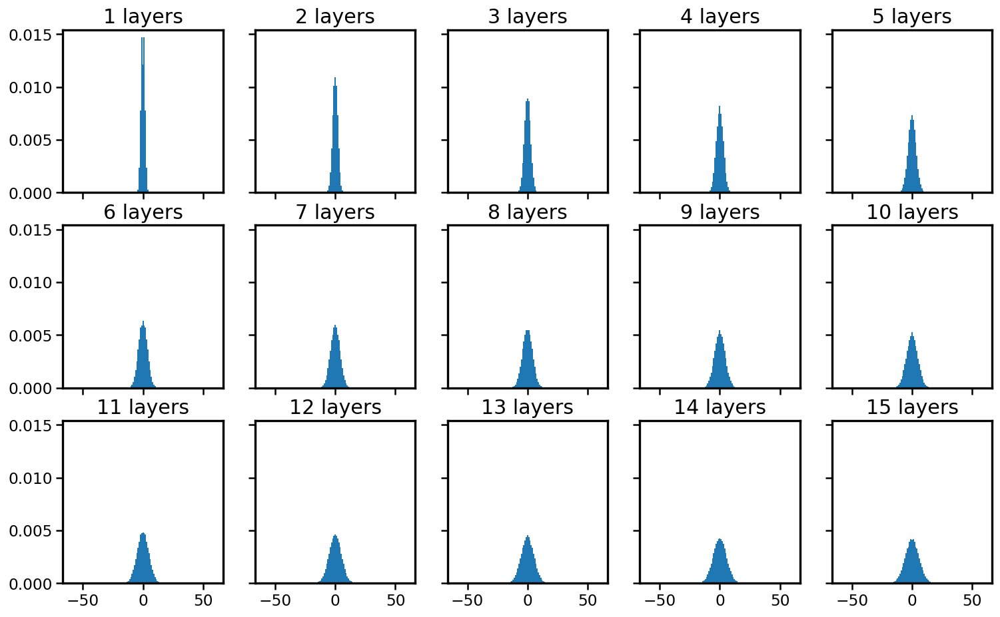

In [144]:
L = 60
x = np.arange(-L,L+1)
obs_norm = np.abs(obs)**2

fig,axs = plt.subplots(3,5,figsize=(15,9), sharex=True, sharey=True)
for k,ax in enumerate(axs.flat):
    ax.bar(x,np.mean(obs_norm[:,k,:],axis=0), color = 'C0',width =1.1)
    ax.set_title(f"{k+1} layers",fontsize = 18)
    # ax.set_ylim([0,0.6])

# fig.savefig('layered_ansatzes.pdf')

### Check output function in the $\cos(x\pi)$ and $\sin(x\pi)$ basis

In [145]:
one,cos,sin = trig_to_sc(obs)

In [146]:
ocs = np.concatenate([one,cos,sin],axis=2)

In [147]:
print(f"The output functions as cos sin decomposition represented by {ocs.shape[2]} coefficient at the end of each of the {ocs.shape[1]} layers was sampled for {ocs.shape[0]} instances of the circuit parameters")

The output functions as cos sin decomposition represented by 121 coefficient at the end of each of the 15 layers was sampled for 2500 instances of the circuit parameters


In [148]:
ocs_avg = np.mean(np.abs(ocs),axis=0)
ocs_std = np.std(ocs,axis=0)

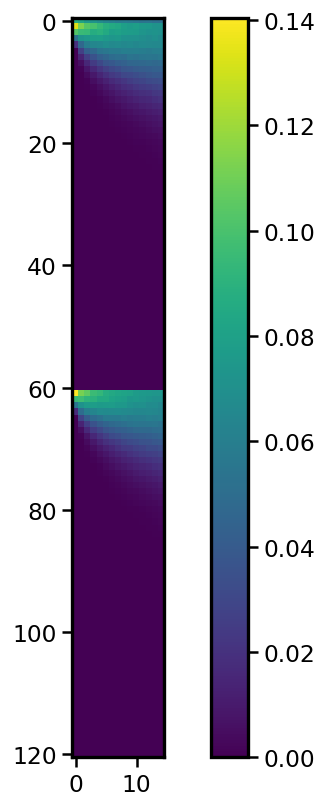

In [149]:
plt.imshow(ocs_avg.T)
plt.colorbar()

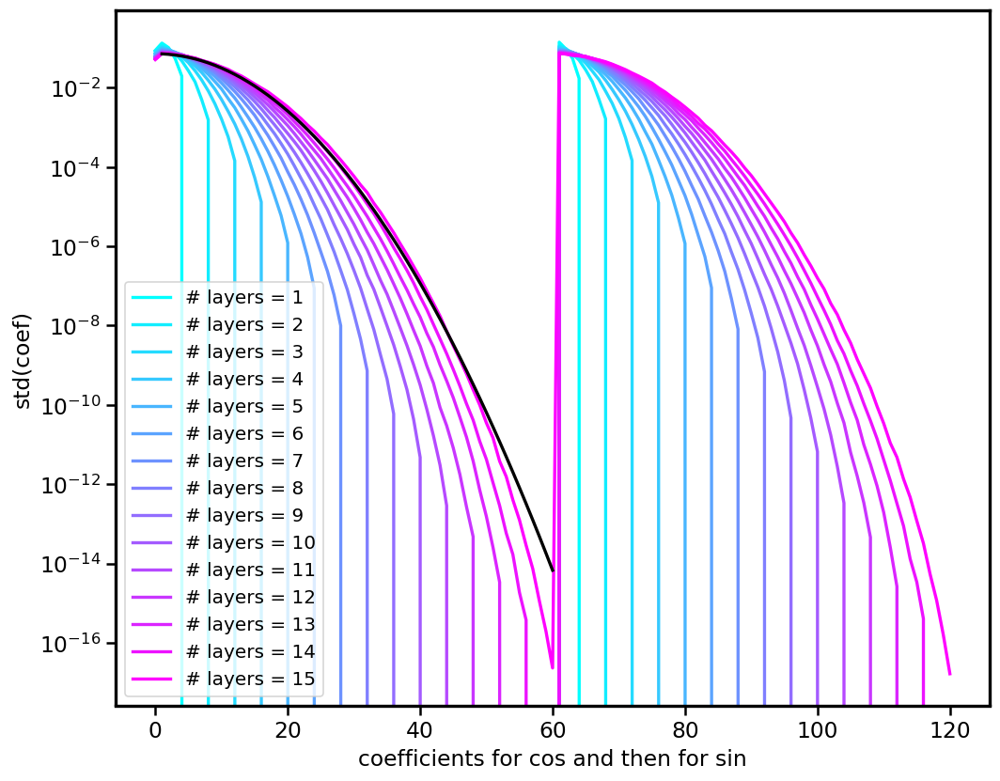

In [151]:
for k in range(numlayers):
    plt.semilogy(ocs_avg[k,:].T,c=cmap(k/(numlayers-1)),label=f"# layers = {k+1}")
scale = 8
# plt.semilogy(np.arange(1,61),1/np.sqrt(scale*(k+1)*np.pi)*np.exp(-np.arange(1,61)**2/(k+1)/scale),'k')
plt.semilogy(np.arange(1,61),ocs_avg[-1,1]*np.exp(-np.arange(1,61)**2/(k+1)/scale),'k')

# plt.plot([0,out_fun.shape[2]],[1,1],'k')
plt.xlabel('coefficients for cos and then for sin')
plt.ylabel('std(coef)')
plt.legend()

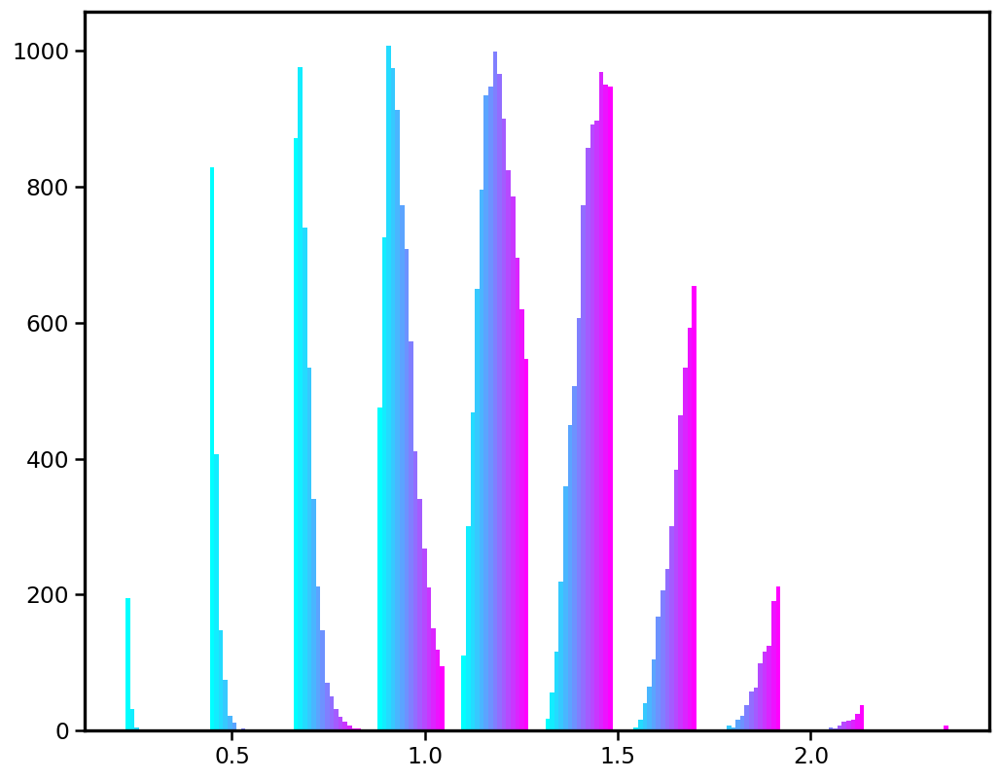

In [152]:
plt.hist(np.sum(np.abs(ocs),axis=2),color=cmap(np.linspace(0,1,15)));

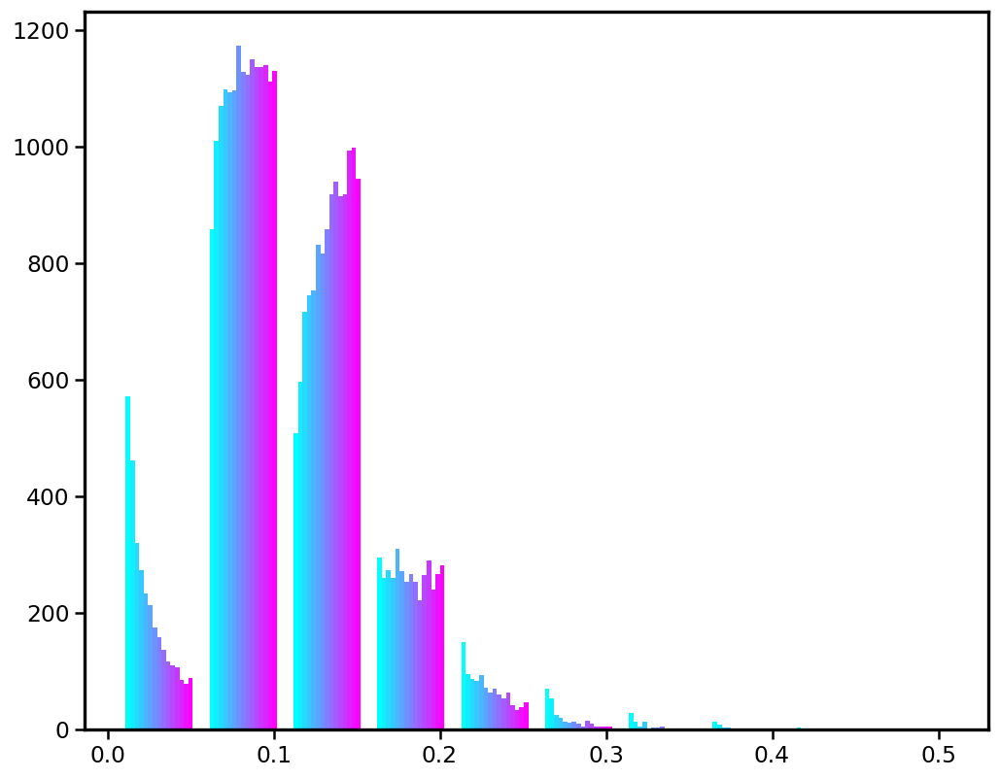

In [153]:
plt.hist(np.sum(np.abs(ocs)**2,axis=2),color=cmap(np.linspace(0,1,15)));

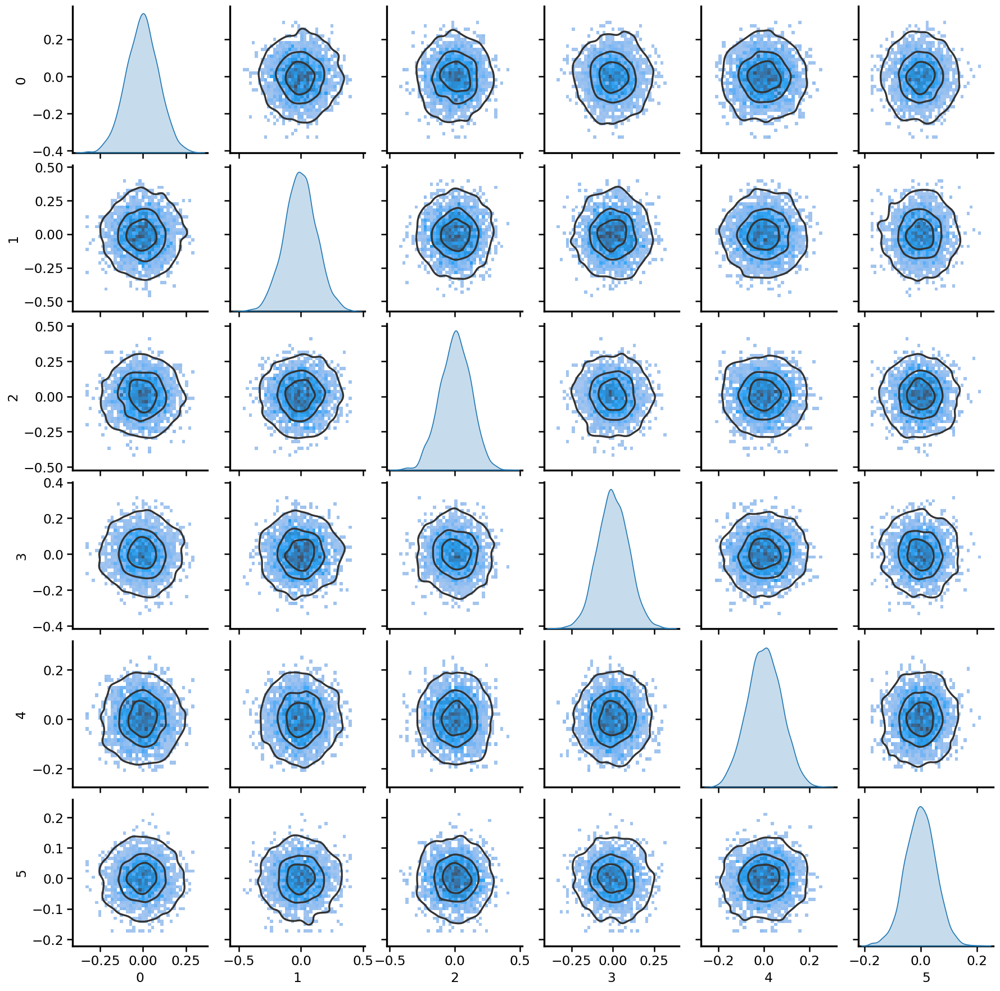

In [154]:
inds = [0,1,2,3,4,5]
data = ocs[:,2,inds].squeeze()
df = pd.DataFrame(data)
g = sns.pairplot(df, diag_kind="kde", kind="hist")
g.map_offdiag(sns.kdeplot, levels=4, color=".2")

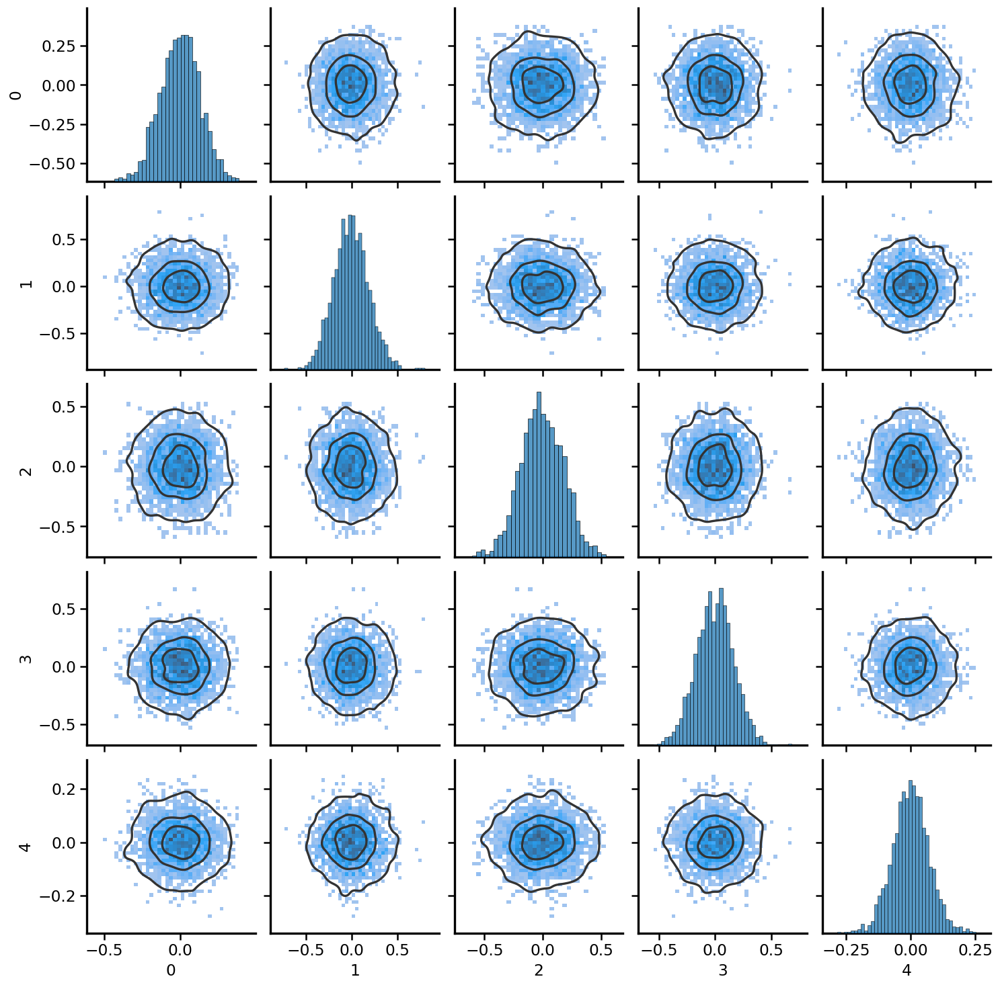

In [100]:
# inds = [0,1,2,5,15,30]
inds = [0,1,2,5,15]
data = ocs[:,-1,inds].squeeze()
df = pd.DataFrame(data)
g = sns.pairplot(df, kind="hist")
g.map_offdiag(sns.kdeplot, levels=4, color=".2")
# g = sns.pairplot(df, kind="hist", plot_kws = {"binwidth" : (0.01, 0.01)})

### Lipschitz

In [155]:
xs = np.linspace(0,np.pi*2,103)
dx = xs[1]-xs[0] 
lips = []
for k in range(ocs.shape[1]):
    a = eval_several_scpoly(ocs[:,k,:].T,xs)
    deriv = np.abs(a[:,1:]-a[:,:-1])/dx
    lips.append(np.max(deriv,axis=1))
lips = np.array(lips)
lips.shape

(15, 2500)

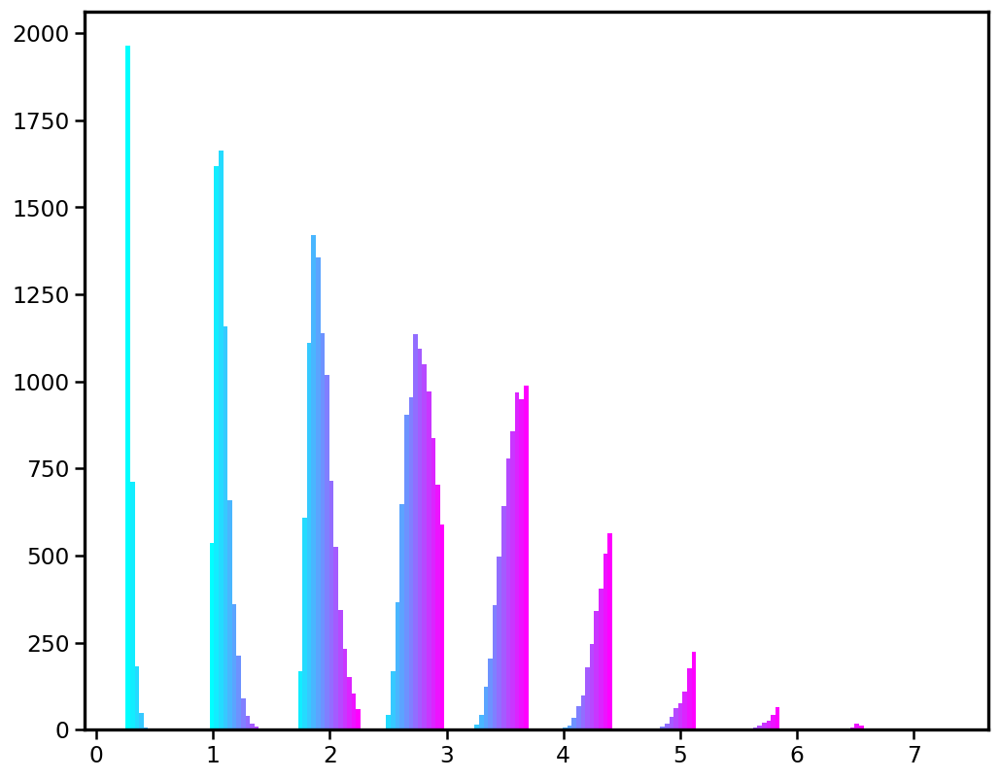

In [156]:
plt.hist(lips.T,color=cmap(np.linspace(0,1,15)));

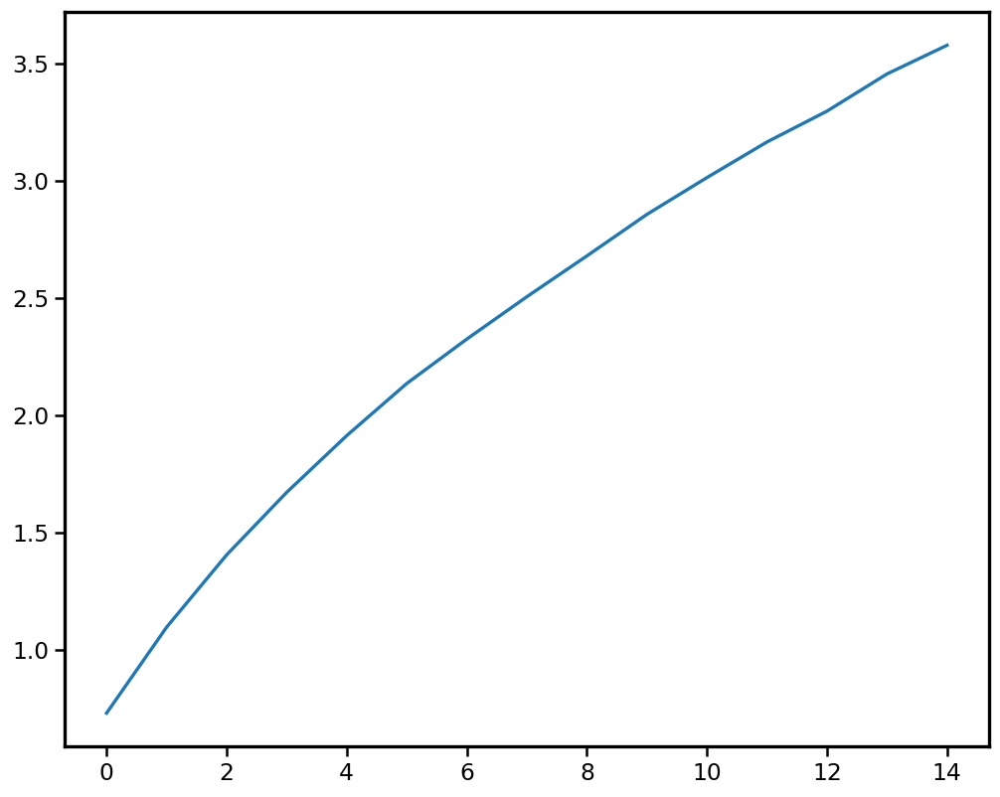

In [157]:
plt.plot(np.mean(lips,axis=1))

In [158]:
Ls = np.concatenate([np.arange(0,61),np.arange(1,61)])
fu = np.sum(np.abs(ocs) * np.expand_dims(Ls,axis=(0,1)),axis=2)
fu.shape
# ocs

(2500, 15)

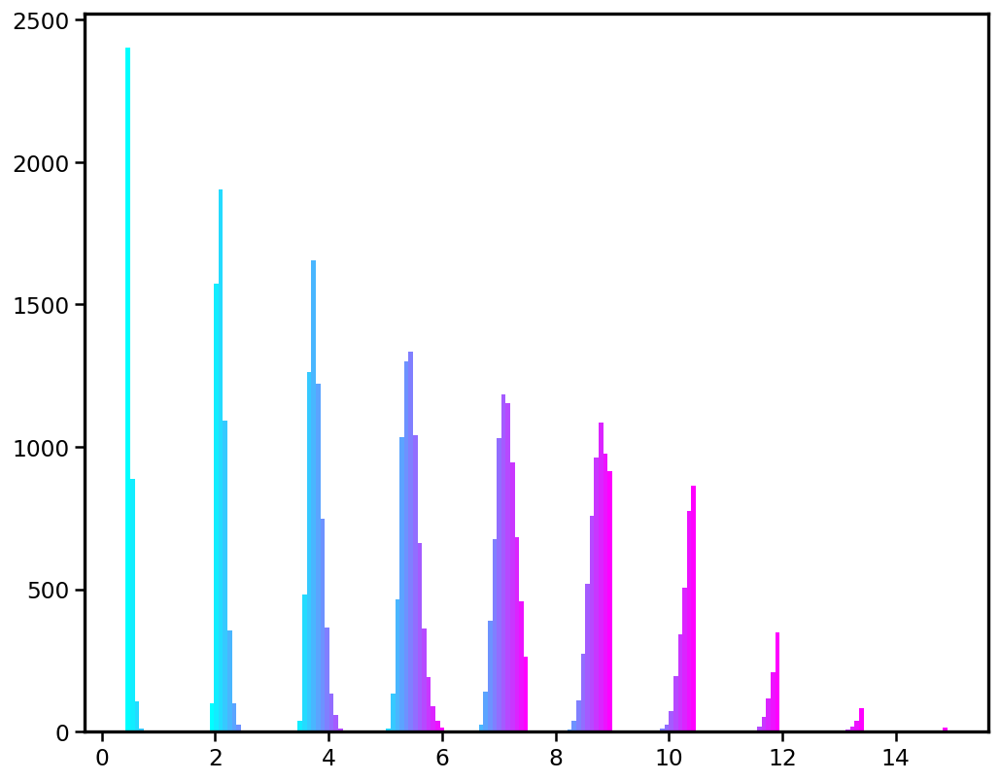

In [159]:
plt.hist(fu,color=cmap(np.linspace(0,1,15)));

In [160]:
v = fu - lips.T
np.sum(v<0)

0

In [165]:
a = fu/lips.T
a.shape

(2500, 15)

In [166]:
a

array([[1.49587172, 1.69177597, 2.03009276, ..., 2.57310758, 2.62669656,
        2.22250564],
       [1.77863697, 2.09268484, 1.7926587 , ..., 2.8291824 , 2.22807512,
        2.5629976 ],
       [1.56162182, 1.73061164, 2.24660801, ..., 2.78708109, 2.61115497,
        3.29163524],
       ...,
       [1.50676536, 1.85497444, 1.93732852, ..., 2.92519913, 2.74219486,
        3.11840129],
       [1.4487067 , 1.84687453, 2.03536247, ..., 2.33762712, 2.73849392,
        2.77166773],
       [1.90499136, 1.59425388, 2.32745401, ..., 2.40678308, 1.87534235,
        2.6007768 ]])

0.9686195033444109
-0.39492548923378057
0.9957794979458757


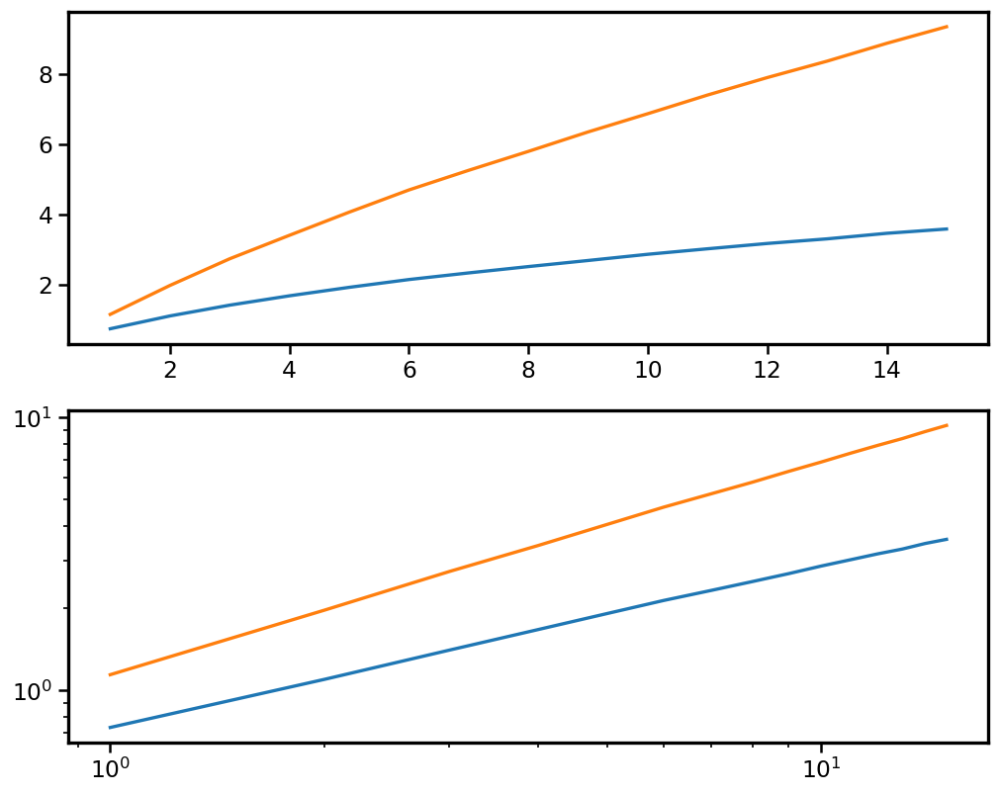

In [161]:
ma = np.mean(lips,axis=1)
mb = np.mean(fu,axis=0)
ks = np.arange(0,15)+1

plt.subplot(211)
plt.plot(ks,ma)
plt.plot(ks,mb)
# plt.plot(ks+1,np.sqrt(ks+1)/np.pi**(1/4),'k')
# plt.plot(ks+1,np.sqrt(ks+1)*1.1,'k')

plt.subplot(212)
plt.loglog(ks,ma)
plt.loglog(ks,mb)
# plt.loglog(ks+1,np.sqrt(ks+1)/np.pi**(1/4),'k')
# plt.loglog(ks+1,np.sqrt(ks+1)*1.1,'k')

x = np.log(ks+1)
y = np.log(np.array(mb))

slope, intercept, r, p, se = scipy.stats.linregress(x,y)
print(slope)
print(intercept)
print(r)